# Libraries

Install scorEpochs to quantify epoch quality (i.e., select best quality epochs)

In [43]:
!git clone https://github.com/Scorepochs-tools/scorepochs_py

import os
print(os.listdir("C:/Users/sesam_analysis/anaconda3/envs/eeg_sensor/scorepochs_py/"))
import sys
sys.path.append("C:/Users/sesam_analysis/anaconda3/envs/eeg_sensor/scorepochs_py/")

from scorepochs import scorEpochs


['.git', 'COPYING', 'README.md', 'scorepochs.py', 'scorEpochs_demo.ipynb', '__pycache__']


Cloning into 'scorepochs_py'...


In [57]:
import os
import sys

print(os.listdir("C:/Users/sesam_analysis/anaconda3/envs/eeg_sensor/scorepochs_py/"))
# import sys
sys.path.append("C:/Users/sesam_analysis/anaconda3/envs/eeg_sensor/scorepochs_py/")

from scorepochs import scorEpochs

['.git', 'COPYING', 'README.md', 'scorepochs.py', 'scorEpochs_demo.ipynb', '__pycache__']


In [58]:
import os
import mne
import seaborn as sns
import pandas as pd


import bids
from mne_bids import BIDSPath, read_raw_bids, print_dir_tree, make_report, get_entities_from_fname
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import sovaharmony
from sovaharmony.preprocessing import harmonize

import bids
from pyprep.prep_pipeline import PrepPipeline
from mne.datasets.eegbci import standardize
import cmasher as cmr
import scipy as sp
import fooof
from fooof.analysis import get_band_peak_fm
from fooof import FOOOF, FOOOFGroup
from fooof.bands import Bands
from fooof.objs import combine_fooofs
from fooof.utils import trim_spectrum
from fooof.analysis.error import compute_pointwise_error_fm
import antropy as ant
import yasa
from scorepochs import scorEpochs

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

import mne_connectivity
from mne_connectivity.viz import plot_sensors_connectivity

from scipy.stats import zscore


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_19280\3220282424.py:22: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  import fooof


# Preprocessing

USE UPPERCASE FOR CHANNEL NAMES IN THIS STEP

## Oslo

In [5]:
THE_DATASET={
    'name':'oslo',
    'input_path':'D:/eeg_datasets/bids/oslo',
    'layout':{'extension':'.edf','session':'t1','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
        'spatial_filter':None
}

In [6]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## California

In [ ]:
THE_DATASET={
    'name':'california',
    'input_path':'D:/eeg_datasets/bids/california',
    'layout':{'extension':'.bdf','session':['hc', 'on'],'suffix':'eeg', 'return_type':'filename'},
    'args':{'line_freqs':[60]},
    'group_regex':None,
    'events_to_keep':None,
    'run-label':'',
    'channels':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
    'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Iowa

In [3]:
THE_DATASET={
    'name':'iowa',
    'input_path':'D:/eeg_datasets/bids/iowa',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[60]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FZ', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'P3', 'P7', 'O1', 'OZ', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'CZ', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'FP2', 'AF7', 'AF3', 'AFZ', 'F1', 'F5', 'FT7', 'FC3', 'C1', 'C5', 'TP7', 'CP3', 'P1', 'P5', 'PO7', 'PO3', 'POZ', 'PO4', 'PO8', 'P6', 'P2', 'CPZ', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'AF8', 'AF4', 'F2', 'FCZ'],
        'spatial_filter':None
}

In [4]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Finland

In [5]:
THE_DATASET={
    'name':'finland',
    'input_path':'D:/eeg_datasets/bids/finland',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
        'spatial_filter':None
}

In [6]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Medellin

In [8]:
THE_DATASET={
    'name':'antioquia',
    'input_path':'D:/eeg_datasets/bids/antioquia',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[60]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
        'spatial_filter':None
}

In [9]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Genoa

In [10]:
THE_DATASET={
    'name':'genova',
    'input_path':'D:/eeg_datasets/bids/genoa',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
        'spatial_filter':None
}


In [11]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Greece

In [ ]:
THE_DATASET={
    'name':'greece',
    'input_path':'D:/eeg_datasets/bids/greece',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ',],
        'spatial_filter':None
}

In [13]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## France

In [ ]:
THE_DATASET={
    'name':'france',
    'input_path':'D:/eeg_datasets/bids/france',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [15]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Chieti

In [16]:
THE_DATASET={
    'name':'chieti',
    'input_path':'D:/eeg_datasets/bids/chieti',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
        'spatial_filter':None
}

In [17]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Newcastle

In [18]:
THE_DATASET={
    'name':'newcastle',
    'input_path':'D:/eeg_datasets/bids/newcastle',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'task':'RestEC','return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'RestEC',
        'channels':['FP1', 'FPZ', 'FP2', 'F7', 'F3', 'FZ', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'CZ', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'PZ', 'P4', 'P8', 'POZ', 'O1', 'OZ', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCZ', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPZ', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9H', 'TPP10H', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFZ', 'AFF2', 'FFC5H', 'FFC3H', 'FFC4H', 'FFC6H', 'FCC5H', 'FCC3H', 'FCC4H', 'FCC6H', 'CCP5H', 'CCP3H', 'CCP4H', 'CCP6H', 'CPP5H', 'CPP3H', 'CPP4H', 'CPP6H', 'PPO1', 'PPO2', 'I1', 'IZ', 'I2', 'AFP3H', 'AFP4H', 'AFF5H', 'AFF6H', 'FFT7H', 'FFC1H', 'FFC2H', 'FFT8H', 'FTT9H', 'FTT7H', 'FCC1H', 'FCC2H', 'FTT8H', 'FTT10H', 'TTP7H', 'CCP1H', 'CCP2H', 'TTP8H', 'TPP7H', 'CPP1H', 'CPP2H', 'TPP8H', 'PPO9H', 'PPO5H', 'PPO6H', 'PPO10H', 'POO9H', 'POO3H', 'POO4H', 'POO10H', 'OI1H', 'OI2H'],        
        'spatial_filter':None}

In [19]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Stavanger - DDI

In [3]:
THE_DATASET={
    'name':'stavanger',
    'input_path':'D:/eeg_datasets/bids/stavanger_ddi',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [4]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Stavanger - NORDLB

In [9]:
THE_DATASET={
    'name':'stavanger',
    'input_path':'D:/eeg_datasets/bids/stavanger_nordlb',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [10]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

# Inspection

Inspect number of epochs and common channels across datasets.

##### California #####

In [4]:
california={
'layout':{'extension':'.fif', 'session':['hc', 'on'], 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
    'path':'D:/eeg_datasets/bids/california/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/california/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=california #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

31 ['D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc1\\ses-hc\\eeg\\sub-hc1_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc2\\ses-hc\\eeg\\sub-hc2_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc4\\ses-hc\\eeg\\sub-hc4_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc7\\ses-hc\\eeg\\sub-hc7_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc8\\ses-hc\\eeg\\sub-hc8_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc10\\ses-hc\\eeg\\sub-hc10_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc18\\ses-hc\\eeg\\sub-hc18_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sova

In [5]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'california'
    features['subject'] = ('c_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/california/derivatives/inspection.csv', index=False)

CPU times: total: 797 ms
Wall time: 1.14 s


##### Iowa

In [6]:
iowa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['T8', 'CP3', 'T7', 'C4', 'C5', 'FT8', 'F6', 'FC5', 'FC3', 'C2', 'TP9', 'F7', 'C6', 'CP6', 'F2', 'TP7', 'PO7', 'FCZ', 'O2', 'P2', 'CZ', 'F1', 'P6', 'AF8', 'C3', 'AF4', 'CPZ', 'F5', 'CP1', 'O1', 'P8', 'FC6', 'FC2', 'P4', 'F8', 'FP2', 'AF3', 'POZ', 'FT10', 'P1', 'FC1', 'TP10', 'FP1', 'AF7', 'PO8', 'TP8', 'F4', 'FZ', 'AFZ', 'OZ', 'CP4', 'P3', 'FT7', 'CP5', 'P5', 'P7', 'F3', 'FC4', 'CP2', 'C1'],
    'path':'D:/eeg_datasets/bids/iowa'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/iowa'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=iowa #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

28 ['D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1021\\eeg\\sub-Control1021_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1041\\eeg\\sub-Control1041_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1061\\eeg\\sub-Control1061_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1081\\eeg\\sub-Control1081_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1101\\eeg\\sub-Control1101_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1111\\eeg\\sub-Control1111_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1191\\eeg\\sub-Control1191_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Cont

In [7]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'iowa'
    features['subject'] = ('i_' + subject)
    features['channels'] = epochs.ch_names
    features['epoch_num'] = epochs.get_data().shape[0]
    features['num_ch'] = len(epochs.ch_names)
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/iowa/derivatives/inspection.csv', index=False)

CPU times: total: 1.56 s
Wall time: 1.81 s


##### Finland ####

In [9]:
finland={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
    'path':'D:/eeg_datasets/bids/finland/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/finland/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=finland #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

38 ['D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-02\\eeg\\sub-02_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-03\\eeg\\sub-03_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-04\\eeg\\sub-04_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-05\\eeg\\sub-05_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-06\\eeg\\sub-06_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-07\\eeg\\sub-07_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-08\\eeg\\sub-08_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-09\\eeg\\sub-09_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\de

In [10]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'finland'
    features['subject'] = ('f_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/finland/derivatives/inspection.csv', index=False)

CPU times: total: 1.91 s
Wall time: 2.19 s


##### Oslo ####

In [11]:
oslo={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
    'path':'D:/eeg_datasets/bids/oslo/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/oslo/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=oslo #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

111 ['D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-001\\ses-t1\\eeg\\sub-001_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-002\\ses-t1\\eeg\\sub-002_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-003\\ses-t1\\eeg\\sub-003_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-004\\ses-t1\\eeg\\sub-004_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-005\\ses-t1\\eeg\\sub-005_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-006\\ses-t1\\eeg\\sub-006_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-007\\ses-t1\\eeg\\sub-007_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-008

In [12]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'oslo'
    features['subject'] = ('o_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/oslo/derivatives/inspection.csv', index=False)

CPU times: total: 14.1 s
Wall time: 15.9 s


## Medellin

In [15]:
antioquia={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
    'path':'D:/eeg_datasets/bids/antioquia/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/antioquia/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=antioquia

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

72 ['D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-004\\eeg\\sub-004_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sov

In [16]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'medellin'
    features['subject'] = ('m_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/antioquia/derivatives/inspection.csv', index=False)

CPU times: total: 12.6 s
Wall time: 14 s


## Genoa

In [18]:
genoa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/genoa/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/genoa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=genoa #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

80 ['D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-1\\eeg\\sub-1_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-2\\eeg\\sub-2_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-3\\eeg\\sub-3_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-4\\eeg\\sub-4_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-5\\eeg\\sub-5_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-6\\eeg\\sub-6_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-7\\eeg\\sub-7_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-8\\eeg\\sub-8_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-9\\eeg

In [19]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'genoa'
    features['subject'] = ('gen_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/genoa/derivatives/inspection.csv', index=False)

CPU times: total: 4.7 s
Wall time: 5.41 s


## Greece

In [20]:
greece={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/greece/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/greece/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=greece #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

87 ['D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-004\\eeg\\sub-004_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\gre

In [21]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'greece'
    features['subject'] = ('gre_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/greece/derivatives/inspection.csv', index=False)

CPU times: total: 6.83 s
Wall time: 7.68 s


## France

In [22]:
france={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/france/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/france/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=france #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


76 ['D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA1\\eeg\\sub-MA1_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA3\\eeg\\sub-MA3_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA7\\eeg\\sub-MA7_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA8\\eeg\\sub-MA8_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA9\\eeg\\sub-MA9_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA10\\eeg\\sub-MA10_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA11\\eeg\\sub-MA11_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA12\\eeg\\sub-MA12_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA13\\e

In [23]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'fra'
    features['subject'] = ('fra_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/france/derivatives/inspection.csv', index=False)

CPU times: total: 4.7 s
Wall time: 5.45 s


## Chieti

In [24]:
chieti={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
    'path':'D:/eeg_datasets/bids/chieti/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/chieti/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=chieti #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

104 ['D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-009\\eeg\\sub-009_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-010\\eeg\\su

In [25]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'chi'
    features['subject'] = ('chi_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/chieti/derivatives/inspection.csv', index=False)

CPU times: total: 2.75 s
Wall time: 3.64 s


## Stavanger - DDI

In [26]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/stavanger_ddi/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/stavanger_ddi/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

35 ['D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20033\\eeg\\sub-D20033_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20034\\eeg\\sub-D20034_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20037\\eeg\\sub-D20037_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20102\\eeg\\sub-D20102_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20118\\eeg\\sub-D20118_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20128\\eeg\\sub-D20128_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20130\\eeg\\sub-D20130_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovah

In [27]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'stavanger'
    features['subject'] = ('sta_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/stavanger_ddi/derivatives/inspection.csv', index=False)

CPU times: total: 2.44 s
Wall time: 2.79 s


## Stavanger - NORDLB

In [29]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/stavanger_nordlb/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/stavanger_nordlb/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

15 ['D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-1018\\eeg\\sub-1018_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-01020\\eeg\\sub-01020_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004002\\eeg\\sub-004002_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004004\\eeg\\sub-004004_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004005\\eeg\\sub-004005_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004010\\eeg\\sub-004010_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004011\\eeg\\sub-004011_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\

In [30]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'stavanger'
    features['subject'] = ('sta_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/stavanger_nordlb/derivatives/inspection.csv', index=False)




CPU times: total: 984 ms
Wall time: 1.16 s


## Newcastle

In [31]:
newcastle={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'Cz', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCz', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPz', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9h', 'TPP10h', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFz', 'AFF2', 'FFC5h', 'FFC3h', 'FFC4h', 'FFC6h', 'FCC5h', 'FCC3h', 'FCC4h', 'FCC6h', 'CCP5h', 'CCP3h', 'CCP4h', 'CCP6h', 'CPP5h', 'CPP3h', 'CPP4h', 'CPP6h', 'PPO1', 'PPO2', 'I1', 'Iz', 'I2', 'AFp3h', 'AFp4h', 'AFF5h', 'AFF6h', 'FFT7h', 'FFC1h', 'FFC2h', 'FFT8h', 'FTT9h', 'FTT7h', 'FCC1h', 'FCC2h', 'FTT8h', 'FTT10h', 'TTP7h', 'CCP1h', 'CCP2h', 'TTP8h', 'TPP7h', 'CPP1h', 'CPP2h', 'TPP8h', 'PPO9h', 'PPO5h', 'PPO6h', 'PPO10h', 'POO9h', 'POO3h', 'POO4h', 'POO10h', 'OI1h', 'OI2h', 'EMGr', 'EMGl'],
    'path':'D:/eeg_datasets/bids/newcastle/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/newcastle/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=newcastle #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'RestEC_desc-reject' in k]

print(len(eegs), eegs)

57 ['D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT002\\eeg\\sub-CAT002_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT008\\eeg\\sub-CAT008_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT011\\eeg\\sub-CAT011_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT013\\eeg\\sub-CAT013_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT017\\eeg\\sub-CAT017_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT019\\eeg\\sub-CAT019_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT020\\eeg\\sub-CAT020_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT022

In [32]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'newcastle'
    features['subject'] = ('n_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/eeg_datasets/bids/newcastle/derivatives/inspection.csv', index=False)

CPU times: total: 12.9 s
Wall time: 14.1 s


# Feature Extraction

##### California #####

In [59]:
california={
'layout':{'extension':'.fif', 'session':['hc', 'on'], 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
    'path':'D:/eeg_datasets/bids/california/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/california/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=california #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

31 ['D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc1\\ses-hc\\eeg\\sub-hc1_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc2\\ses-hc\\eeg\\sub-hc2_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc4\\ses-hc\\eeg\\sub-hc4_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc7\\ses-hc\\eeg\\sub-hc7_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc8\\ses-hc\\eeg\\sub-hc8_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc10\\ses-hc\\eeg\\sub-hc10_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sovaharmony\\sub-hc18\\ses-hc\\eeg\\sub-hc18_ses-hc_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\california\\derivatives\\sova

In [ ]:
%%capture
dict_list = []
scores_list = []    # <-- ADD: to collect best scores per subject

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]



        best_20_scores = scores[best_20_indices]   # <-- ADD: extract best 20 scores

        # Optional: Save best 20 scores per subject for quality control/reporting
        scores_list.append({
            'subject': subject,
            'best_20_indices': best_20_indices.tolist(),
            'best_20_scores': best_20_scores.tolist()
        })  # <-- ADD



        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'california'
                features['subject'] = ('c_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # COMMENTED TO PRESERVE LINEAR SPACE OF PSD
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/california/derivatives/spectrum_fooof_california_no_z.feather')

# Save best epoch scores per subject as CSV (optional, but recommended)
scores_df = pd.DataFrame(scores_list)
scores_df.to_csv('D:/eeg_datasets/bids/california/derivatives/scores_california_no_z.csv', index=False)  # <-- ADD

Plot channel positions

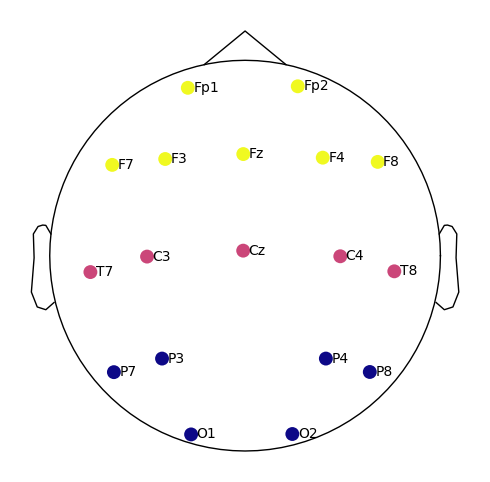

In [23]:
import matplotlib.pyplot as plt
import mne

# ONLY PLOT INCLUDED CHANNELS 
anterior = ["Fp1", "Fp2", "F3", "F4", "F7", "F8", "Fz"]
central = ["T7", "T8", "C3", "C4", "Cz"]
posterior = ["P3", "P4", "P7", "P8", "O1", "O2"]

# Load your epochs data here
# epochs = mne.read_epochs('your_epochs_file.fif')

montage = mne.channels.make_standard_montage("standard_1005")
epochs.set_montage(montage)

groups = [anterior, central, posterior]
group_indices = []  # Create a separate list to store indices

for ch_names in groups:
    indices = [epochs.ch_names.index(ch_name) for ch_name in ch_names]
    group_indices.append(indices)  # Append indices to the separate list

# Define colors for each group
group_colors = ['red', 'blue', 'green']  # Red for anterior, blue for central, green for posterior

# Create the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the sensors with specified colors
mne.viz.plot_sensors(epochs.info, ch_groups=group_indices, cmap= "plasma_r", pointsize=100, show_names=True, linewidth=0, sphere=(0, 0.024, 0, 0.09), axes=ax)

# Save the figure as TIFF with 300 DPI
fig.savefig('D:/papers_alberto/edlb_combat_psd/figures/sensors.tiff', dpi=300, format='tiff')


In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


##### Iowa

In [14]:
iowa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['T8', 'CP3', 'T7', 'C4', 'C5', 'FT8', 'F6', 'FC5', 'FC3', 'C2', 'TP9', 'F7', 'C6', 'CP6', 'F2', 'TP7', 'PO7', 'FCZ', 'O2', 'P2', 'CZ', 'F1', 'P6', 'AF8', 'C3', 'AF4', 'CPZ', 'F5', 'CP1', 'O1', 'P8', 'FC6', 'FC2', 'P4', 'F8', 'FP2', 'AF3', 'POZ', 'FT10', 'P1', 'FC1', 'TP10', 'FP1', 'AF7', 'PO8', 'TP8', 'F4', 'FZ', 'AFZ', 'OZ', 'CP4', 'P3', 'FT7', 'CP5', 'P5', 'P7', 'F3', 'FC4', 'CP2', 'C1'],
    'path':'D:/eeg_datasets/bids/iowa/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/iowa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=iowa #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

28 ['D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1021\\eeg\\sub-Control1021_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1041\\eeg\\sub-Control1041_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1061\\eeg\\sub-Control1061_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1081\\eeg\\sub-Control1081_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1101\\eeg\\sub-Control1101_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1111\\eeg\\sub-Control1111_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Control1191\\eeg\\sub-Control1191_task-eyesOpen_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\iowa\\derivatives\\sovaharmony\\sub-Cont

In [15]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'iowa'
                features['subject'] = ('i_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/iowa/derivatives/spectrum_fooof_iowa_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


##### Finland ####

In [17]:
finland={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
    'path':'D:/eeg_datasets/bids/finland/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/finland/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=finland #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

38 ['D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-02\\eeg\\sub-02_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-03\\eeg\\sub-03_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-04\\eeg\\sub-04_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-05\\eeg\\sub-05_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-06\\eeg\\sub-06_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-07\\eeg\\sub-07_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-08\\eeg\\sub-08_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\derivatives\\sovaharmony\\sub-09\\eeg\\sub-09_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\finland\\de

In [18]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample


        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'finland'
                features['subject'] = ('f_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/finland/derivatives/spectrum_fooof_finland_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


##### Oslo ####

In [20]:
oslo={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
    'path':'D:/eeg_datasets/bids/oslo/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/oslo/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=oslo #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

111 ['D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-001\\ses-t1\\eeg\\sub-001_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-002\\ses-t1\\eeg\\sub-002_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-003\\ses-t1\\eeg\\sub-003_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-004\\ses-t1\\eeg\\sub-004_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-005\\ses-t1\\eeg\\sub-005_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-006\\ses-t1\\eeg\\sub-006_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-007\\ses-t1\\eeg\\sub-007_ses-t1_task-resteyesc_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\oslo\\derivatives\\sovaharmony\\sub-008

In [23]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:]*1e-6, sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'oslo'
                features['subject'] = ('o_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/oslo/derivatives/spectrum_fooof_oslo_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


## Medellin

In [25]:
antioquia={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
    'path':'D:/eeg_datasets/bids/antioquia/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/antioquia/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=antioquia

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

72 ['D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-004\\eeg\\sub-004_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\antioquia\\derivatives\\sov

In [26]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'medellin'
                features['subject'] = ('m_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/antioquia/derivatives/spectrum_fooof_medellin_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


## Genoa

Note: The 10-20 and 10-10 system share 4 channel positions but changed the name. 

Thus, in the 10-20 the electrodes T3, T4, T5, T6, correspond to the 10-10 T7, T8, P7, and P8 respectively.

https://en.wikipedia.org/wiki/10%E2%80%9320_system_(EEG)


In [28]:
genoa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/genoa/'
}


#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/genoa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=genoa #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

80 ['D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-1\\eeg\\sub-1_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-2\\eeg\\sub-2_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-3\\eeg\\sub-3_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-4\\eeg\\sub-4_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-5\\eeg\\sub-5_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-6\\eeg\\sub-6_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-7\\eeg\\sub-7_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-8\\eeg\\sub-8_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\genoa\\derivatives\\sovaharmony\\sub-9\\eeg

In [29]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'genoa'
                features['subject'] = ('gen_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/genoa/derivatives/spectrum_fooof_genoa_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


## Greece

In [31]:
greece={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/greece/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/greece/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=greece #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

87 ['D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-004\\eeg\\sub-004_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\greece\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-eyesclosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\gre

In [32]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'greece'
                features['subject'] = ('gre_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/greece/derivatives/spectrum_fooof_greece_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


## France

In [34]:
france={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/france/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/france/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=france #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


76 ['D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA1\\eeg\\sub-MA1_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA3\\eeg\\sub-MA3_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA7\\eeg\\sub-MA7_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA8\\eeg\\sub-MA8_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA9\\eeg\\sub-MA9_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA10\\eeg\\sub-MA10_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA11\\eeg\\sub-MA11_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA12\\eeg\\sub-MA12_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\france\\derivatives\\sovaharmony\\sub-MA13\\e

In [35]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'france'
                features['subject'] = ('fra_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/france/derivatives/spectrum_fooof_france_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)

## Chieti

In [37]:
chieti={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
    'path':'D:/eeg_datasets/bids/chieti/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/chieti/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=chieti #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


104 ['D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-001\\eeg\\sub-001_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-002\\eeg\\sub-002_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-003\\eeg\\sub-003_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-005\\eeg\\sub-005_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-006\\eeg\\sub-006_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-007\\eeg\\sub-007_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-008\\eeg\\sub-008_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-009\\eeg\\sub-009_task-rest_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\chieti\\derivatives\\sovaharmony\\sub-010\\eeg\\su

In [38]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'chieti'
                features['subject'] = ('chi_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/chieti/derivatives/spectrum_fooof_chieti_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df); 


## Stavanger - DDI

In [40]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/stavanger_ddi/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/stavanger_ddi/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


35 ['D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20033\\eeg\\sub-D20033_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20034\\eeg\\sub-D20034_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20037\\eeg\\sub-D20037_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20102\\eeg\\sub-D20102_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20118\\eeg\\sub-D20118_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20128\\eeg\\sub-D20128_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovaharmony\\sub-D20130\\eeg\\sub-D20130_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_ddi\\derivatives\\sovah

In [41]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/stavanger_ddi/derivatives/spectrum_fooof_stavanger_ddi_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)

## Stavanger - NORDLB

In [43]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/eeg_datasets/bids/stavanger_nordlb/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/stavanger_nordlb/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


15 ['D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-1018\\eeg\\sub-1018_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-01020\\eeg\\sub-01020_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004002\\eeg\\sub-004002_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004004\\eeg\\sub-004004_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004005\\eeg\\sub-004005_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004010\\eeg\\sub-004010_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\derivatives\\sovaharmony\\sub-004011\\eeg\\sub-004011_task-eyesClosed_desc-reject[]_eeg.fif', 'D:\\eeg_datasets\\bids\\stavanger_nordlb\\

In [44]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)

# Update 'participant_id' values if they start with 'sta_1', 'sta_01', or 'sta_004'
df['subject'] = df['subject'].replace(
    to_replace=r'^(sta_1|sta_01|sta_004)',
    value='sta_001',
    regex=True)

df.to_feather('D:/eeg_datasets/bids/stavanger_nordlb/derivatives/spectrum_fooof_stavanger_nordlb_no_z.feather')



In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)

## Newcastle ##

In [46]:
newcastle={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'Cz', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCz', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPz', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9h', 'TPP10h', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFz', 'AFF2', 'FFC5h', 'FFC3h', 'FFC4h', 'FFC6h', 'FCC5h', 'FCC3h', 'FCC4h', 'FCC6h', 'CCP5h', 'CCP3h', 'CCP4h', 'CCP6h', 'CPP5h', 'CPP3h', 'CPP4h', 'CPP6h', 'PPO1', 'PPO2', 'I1', 'Iz', 'I2', 'AFp3h', 'AFp4h', 'AFF5h', 'AFF6h', 'FFT7h', 'FFC1h', 'FFC2h', 'FFT8h', 'FTT9h', 'FTT7h', 'FCC1h', 'FCC2h', 'FTT8h', 'FTT10h', 'TTP7h', 'CCP1h', 'CCP2h', 'TTP8h', 'TPP7h', 'CPP1h', 'CPP2h', 'TPP8h', 'PPO9h', 'PPO5h', 'PPO6h', 'PPO10h', 'POO9h', 'POO3h', 'POO4h', 'POO10h', 'OI1h', 'OI2h', 'EMGr', 'EMGl'],
    'path':'D:/eeg_datasets/bids/newcastle/'
}

#Path of the BIDS folder
bids_root = 'D:/eeg_datasets/bids/newcastle/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=newcastle #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'RestEC_desc-reject' in k]

print(len(eegs), eegs)

57 ['D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT002\\eeg\\sub-CAT002_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT008\\eeg\\sub-CAT008_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT011\\eeg\\sub-CAT011_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT013\\eeg\\sub-CAT013_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT017\\eeg\\sub-CAT017_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT019\\eeg\\sub-CAT019_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT020\\eeg\\sub-CAT020_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\eeg_datasets\\bids\\newcastle\\derivatives\\sovaharmony\\sub-CAT022

In [47]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=45)
    downsample = 128
    epochs.resample(downsample)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        clean_epochs = epochs
        continuous_signal = np.reshape(clean_epochs.get_data(), (nchannels, nepochs * npoints), order='F')

        t_ep = 5
        fs = downsample
        freq = [1, 30]
        cfg = {'freqRange': freq, 'fs': fs, 'windowL': t_ep}
        idx_best, epoch, scores = scorEpochs(cfg, continuous_signal)

        best_20_indices = idx_best[:20]
        best_20_epochs = epochs[best_20_indices]

        epochs_c = mne.concatenate_epochs([best_20_epochs], add_offset=False)
        epochs = epochs_c
        epochs.set_montage("standard_1005")

        nepochs, nchannels, npoints = epochs.get_data().shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        sf = downsample

        n_fft, n_overlap, n_per_seg = int(5*sf), int(sf), int(5*sf)
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Input the power spectrum IN LINEAR SPACE to fit FOOOF
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'newcastle'
                features['subject'] = ('n_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                # features['psd'] = np.log10(psds[freqs==freq][0]) # KEEP LINEAR SPACE 
                features['psd'] = psds[freqs==freq][0]
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/eeg_datasets/bids/newcastle/derivatives/spectrum_fooof_newcastle_no_z.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


# Merge participants metadata

In [21]:
import pandas as pd

In [22]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/california/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'c_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'california'


california_df = participants_df
california_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/california_df.csv', index=False)

In [23]:
# Fix the participants.tsv inthe iowa dataset

# Load the Excel file
file_path = 'D:/eeg_datasets/raw/iowa/xls.xlsx'
data = pd.read_excel(file_path)

# Rename the "subject" column to "participant_id"
data.rename(columns={"subject": "participant_id"}, inplace=True)

# Add the prefix "sub-" to each participant_id
data["participant_id"] = "sub-" + data["participant_id"].astype(str)

# Save the dataframe as a TSV file
output_path = 'D:/eeg_datasets/bids/iowa/participants.tsv'
data.to_csv(output_path, sep='\t', index=False)


In [131]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = "D:/eeg_datasets/bids/iowa/participants.tsv"
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'i_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'iowa'


# Load the diagnosis mapping (from the provided list or a separate source)
diagnosis_mapping = {
    'i_PD1001': 'pd_mci', 'i_PD1031': 'pd_mci'}

# Replace 'group' based on diagnosis mapping
participants_df['group'] = participants_df['participant_id'].map(diagnosis_mapping).fillna(participants_df['group'])

iowa_df = participants_df
iowa_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/iowa_df.csv', index=False)

In [25]:
# Fix the participants.tsv inthe finland dataset

# Load the Excel file
file_path = 'D:/eeg_datasets/raw/finland/clinical_data.xlsx'
data = pd.read_excel(file_path)

# Add the prefix "sub-" to each participant_id
data["participant_id"] = "sub-" + data["participant_id"].astype(str)

# Save the dataframe as a TSV file
output_path = 'D:/eeg_datasets/bids/finland/participants.tsv'
data.to_csv(output_path, sep='\t', index=False)

In [50]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/finland/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'f_')  # Drop the "sub-" prefix used for BIDS
participants_df.rename(columns = {'sex':'gender'}, inplace = True) 

participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'finland'


# Add a leading 0 to participant_id values f_1 to f_9
participants_df['participant_id'] = participants_df['participant_id'].str.replace(r'f_(\d)$', r'f_0\1', regex=True)


finland_df = participants_df
finland_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/finland_df.csv', index=False)

In [27]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/oslo/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'o_')  # Drop the "sub-" prefix used for BIDS
participants_df['group'] = 'hc'
participants_df.rename(columns = {'sex':'gender'}, inplace = True)
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'oslo'


oslo_df = participants_df
oslo_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/oslo_df.csv', index=False)


In [77]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/antioquia/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'm_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'medellin'

# Load the diagnosis mapping (from the provided list or a separate source)
diagnosis_mapping = {
    'm_038': 'pd_mci', 'm_041': 'pd_mci', 'm_043': 'pd_mci', 'm_044': 'pd_mci', 'm_047': 'pd_mci',
    'm_052': 'pd_mci', 'm_054': 'pd_mci', 'm_055': 'pd_mci', 'm_058': 'pd_mci', 'm_060': 'pd_mci',
    'm_064': 'pd_mci', 'm_065': 'pd_mci', 'm_068': 'pd_mci', 'm_069': 'pd_mci'
}

# Replace 'group' based on diagnosis mapping
participants_df['group'] = participants_df['participant_id'].map(diagnosis_mapping).fillna(participants_df['group'])


medellin_df = participants_df
medellin_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/medellin_df.csv', index=False)



In [29]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/greece/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'gre_')  # Drop the "sub-" prefix used for BIDS
participants_df['gender'] = participants_df['gender'].replace({'F': 'f', 'M': 'm'})
participants_df['group'] = participants_df['group'].replace({'A': 'ad', 'C':'hc', 'F':'ftd'})
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'greece'


greece_df = participants_df
greece_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/greece_df.csv', index=False)



In [30]:
metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/genoa/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df.rename(columns={'particpant_id': 'participant_id'}, inplace=True)
participants_df['participant_id'] = 'gen_' + participants_df['participant_id']
participants_df['participant_id'] = participants_df['participant_id'].str.replace('_eyesClosed', '')
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'genoa'


genoa_df = participants_df

genoa_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/genoa_df.csv', index=False)


In [31]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/bids/france/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'fra_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'france'



france_df = participants_df
france_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/france_df.csv', index=False)


In [32]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

# Fix the Stavanger - NORDLB demographics

participants_df = pd.read_csv('D:/eeg_datasets/raw/SUS_04_11_2024/metadata_SESAM/stavanger_nordlb_df.csv')
participants_df = participants_df.groupby('participant_id').first().reset_index()
participants_df = participants_df[['participant_id', 'group', 'age', 'gender']]
# Update 'participant_id' values if they start with 'sta_1', 'sta_01', or 'sta_004'
participants_df['participant_id'] = participants_df['participant_id'].replace(
    to_replace=r'^(sta_1|sta_01|sta_004)',
    value='sta_001',
    regex=True)


#participants_df.rename(columns = {'age_at_eeg':'age'}, inplace = True) 
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns

participants_df['center'] = 'stavanger'


stavanger_nordlb_df = participants_df
stavanger_nordlb_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/stavanger_nordlb_df.csv', index=False)


In [33]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/eeg_datasets/raw/SUS_04_11_2024/metadata_SESAM/stavanger_ddi_df.csv'
participants_df = pd.read_csv(participants_file)
participants_df = participants_df.groupby('participant_id').first().reset_index()
participants_df = participants_df[['participant_id', 'group', 'age', 'gender']]
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'sta_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns
participants_df['center'] = 'stavanger'



stavanger_ddi_df = participants_df
stavanger_ddi_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/stavanger_ddi_df.csv', index=False)


In [34]:
import pandas as pd
from dateutil.relativedelta import relativedelta

# Load the participants file
age_at_measurement_path = 'D:/eeg_datasets/bids/chieti/participants_identifiers.csv'
age_at_measurement = pd.read_csv(age_at_measurement_path, sep=';')

# Convert 'dob_parsed' and 'measuring_date' to datetime and remove timezone
age_at_measurement['dob_parsed'] = pd.to_datetime(age_at_measurement['dob_parsed'], errors='coerce').dt.tz_localize(None)
age_at_measurement['measuring_date'] = pd.to_datetime(age_at_measurement['measuring_date'], errors='coerce').dt.tz_localize(None)

# Function to calculate age
def calculate_age(dob, measuring_date):
    # Check for NaT values and handle gracefully
    if pd.isna(dob) or pd.isna(measuring_date):
        return None
    # Calculate the difference in years
    age = relativedelta(measuring_date, dob).years
    return age

# Apply the function to calculate age
age_at_measurement['age_at_measurement'] = age_at_measurement.apply(
    lambda row: calculate_age(row['dob_parsed'], row['measuring_date']), axis=1
)


# Load the participants file
participants_file = 'D:/eeg_datasets/bids/chieti/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")

# Standardize column names
participants_df.columns = participants_df.columns.str.lower()

# Identify participants with negative age
negative_age_mask = participants_df['age'] < 0

# Load `age_at_measurement` data
age_at_measurement_df = age_at_measurement[['participant_id', 'age_at_measurement']]

# Replace negative ages with `age_at_measurement`
participants_df.loc[negative_age_mask, 'age'] = participants_df.loc[negative_age_mask, 'participant_id'].map(
    age_at_measurement_df.set_index('participant_id')['age_at_measurement']
)

# Validate if all negative ages were fixed
if (participants_df['age'] < 0).any():
    print("Some participants still have negative ages.")
else:
    print("All negative ages have been corrected.")

# Proceed with merging and filtering
metadata_cols = ['participant_id', 'group', 'age', 'gender']
participants_df = participants_df.loc[:, metadata_cols]
participants_df['center'] = 'chieti'
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'chi_')  # Update participant IDs

# Merge the datasets
chieti_df = participants_df

# Save the final dataframe
chieti_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/chieti_df.csv', index=False)


All negative ages have been corrected.


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_18392\4214605467.py:9: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  age_at_measurement['dob_parsed'] = pd.to_datetime(age_at_measurement['dob_parsed'], errors='coerce').dt.tz_localize(None)


In [35]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged


participants_file = 'D:/eeg_datasets/bids/newcastle/participants_2.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'n_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns

participants_df['center'] = 'newcastle'


newcastle_df = participants_df
newcastle_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/newcastle_df.csv', index=False)

In [134]:
import numpy as np


dfs = [oslo_df, california_df, stavanger_nordlb_df, stavanger_ddi_df, iowa_df, 
       finland_df, medellin_df, greece_df, genoa_df, france_df, chieti_df, newcastle_df]


# Step 2: Find common columns
common_cols = list(set.intersection(*(set(df.columns) for df in dfs)))

# Step 3: Merge dataframes
df_merged = dfs[0][common_cols]
for df in dfs[1:]:
    df_merged = pd.merge(df_merged, df[common_cols], on=common_cols, how='outer')


# Step 5: Save or proceed with the merged dataframe
# Example: Filter relevant features
metadata_cols = ['participant_id', 'group', 'center', 'age', 'gender']

all_participants_metadata = df_merged[metadata_cols]
all_participants_metadata['center'] = all_participants_metadata['center'].replace({'finland': 'turku', 'france': 'paris','greece': 'thessaloniki'})

# # Filter the features based on the condition
all_participants_metadata.to_feather('D:/papers_alberto/edlb_combat_psd/data/all_subj_metadata.feather')


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_18392\4109396944.py:14: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, df[common_cols], on=common_cols, how='outer')
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_18392\4109396944.py:14: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, df[common_cols], on=common_cols, how='outer')
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_18392\4109396944.py:14: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, df[common_cols], on=common_cols, how='outer')
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_18392\4109396944.py:14: UserWarning: You are merging on int and float columns where the float values are not equal t

# PLOT INSPECTION

In [11]:
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

description1 = pd.read_csv('D:/eeg_datasets/bids/oslo/derivatives/inspection.csv')
description1['center'] = 'oslo'

description2 = pd.read_csv('D:/eeg_datasets/bids/california/derivatives/inspection.csv')
description2['center'] = 'california'

description3 = pd.read_csv('D:/eeg_datasets/bids/iowa/derivatives/inspection.csv')
description3['center'] = 'iowa'

description4 = pd.read_csv('D:/eeg_datasets/bids/finland/derivatives/inspection.csv')
description4['center'] = 'finland'


description5 = pd.read_csv('D:/eeg_datasets/bids/antioquia/derivatives/inspection.csv')
description5['center'] = 'medellin'


description6 = pd.read_csv('D:/eeg_datasets/bids/stavanger_ddi/derivatives/inspection.csv')
description6['center'] = 'stavanger'

description7 = pd.read_csv('D:/eeg_datasets/bids/genoa/derivatives/inspection.csv')
description7['center'] = 'genoa'

description8 = pd.read_csv('D:/eeg_datasets/bids/greece/derivatives/inspection.csv')
description8['center'] = 'greece'

description9 = pd.read_csv('D:/eeg_datasets/bids/france/derivatives/inspection.csv')
description9['center'] = 'france'

description10 = pd.read_csv('D:/eeg_datasets/bids/stavanger_nordlb/derivatives/inspection.csv')
description10['center'] = 'stavanger'

description11 = pd.read_csv('D:/eeg_datasets/bids/chieti/derivatives/inspection.csv')
description11['center'] = 'chieti'

merged_df = pd.concat([description1, description2, description3, description4, description5,description6,description7,description8,description9,description10, description11], ignore_index=True)

print(merged_df.head(2))

  center subject                                           channels  num_ch  \
0   oslo   o_001  ['FPZ', 'C2', 'AFZ', 'C3', 'P3', 'O2', 'P10', ...      64   
1   oslo   o_002  ['FPZ', 'C2', 'AFZ', 'C3', 'P3', 'O2', 'P10', ...      64   

   epoch_num   sfreq  min_epochs  
0         37  1024.0          36  
1         40  1024.0          36  


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_12640\1876747357.py:20: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(x="center", y="epoch_num", data=merged_df, hue="center", dodge=False,
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_12640\1876747357.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_12640\1876747357.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([tick.get_text().capitalize() for tick in ax.get_xticklabels()])


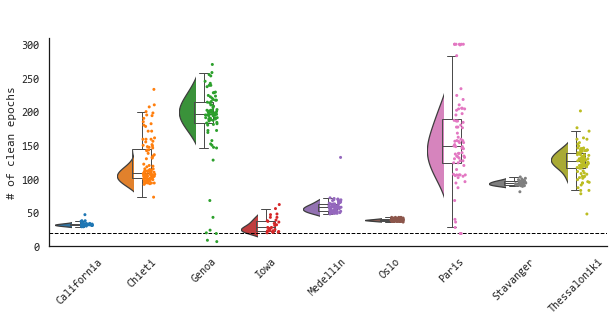

In [12]:
all_participants_metadata = pd.read_feather('D:/papers_alberto/edlb_combat_psd/data/all_subj_metadata.feather')

subjects = all_participants_metadata['participant_id']

merged_df = merged_df[merged_df['subject'].isin(subjects)]

# Clip the y-axis values to a maximum of 300
merged_df['epoch_num'] = np.clip(merged_df['epoch_num'], 0, 300)
merged_df['center'] = merged_df['center'].replace({'finland': 'turku', 'france': 'paris','greece': 'thessaloniki'})
# Sort the DataFrame by 'center'
merged_df = merged_df.sort_values(by='center')

sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"
# sns.set_style('white')
palette = 'tab10'
fig, ax = plt.subplots(figsize=(10, 5))  # Adjust the figure size as needed
ax = sns.violinplot(x="center", y="epoch_num", data=merged_df, hue="center", dodge=False,
                    palette=palette, scale="width", inner=None)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax.transData))

sns.boxplot(x="center", y="epoch_num", data=merged_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax)

old_len_collections = len(ax.collections)

sns.stripplot(x="center", y="epoch_num", data=merged_df, hue="center", palette=palette, dodge=False,
              size=3, ax=ax)  # Adjust the size parameter to change the dot size

for dots in ax.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))


# Set the tick labels and other adjustments
ax.set_xlabel("")  # Update X label
ax.set_ylabel("# of clean epochs")  # Update Y label
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_xticklabels([tick.get_text().capitalize() for tick in ax.get_xticklabels()])
ax.set_ylim(0,310)  # Update X label

ax.set_facecolor('white')

# Set spines color
for spine in ax.spines.values():
    spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Add a dashed horizontal line at y=20
ax.axhline(y=20, color='black', linestyle='--', linewidth=1)

#ax.legend_.remove()
plt.subplots_adjust(bottom=0.3)  # Adjust this value as needed to fit labels
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/clean_epochs.tiff', dpi=300, format='tiff')
plt.show()

# Median PSD across posterior channels

In [6]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)
import pandas as pd
all_participants_metadata_path = 'D:/papers_alberto/edlb_combat_psd/data/all_subj_metadata.feather'
all_participants_metadata = pd.read_feather(all_participants_metadata_path)
all_participants_metadata.shape

(733, 5)

In [7]:
import pandas as pd

# Update 'participant_id' values if they start with 'sta_1', 'sta_01', or 'sta_004'
all_participants_metadata['participant_id'] = all_participants_metadata['participant_id'].replace(
    to_replace=r'^(sta_1|sta_01|sta_004)',
    value='sta_001',
    regex=True)


# List of file paths and their corresponding spectrum names
file_paths = [
    'D:/eeg_datasets/bids/oslo/derivatives/spectrum_fooof_oslo_no_z.feather',
    'D:/eeg_datasets/bids/california/derivatives/spectrum_fooof_california_no_z.feather',
    'D:/eeg_datasets/bids/iowa/derivatives/spectrum_fooof_iowa_no_z.feather',
    'D:/eeg_datasets/bids/finland/derivatives/spectrum_fooof_finland_no_z.feather',
    'D:/eeg_datasets/bids/antioquia/derivatives/spectrum_fooof_medellin_no_z.feather',
    'D:/eeg_datasets/bids/genoa/derivatives/spectrum_fooof_genoa_no_z.feather',
    'D:/eeg_datasets/bids/greece/derivatives/spectrum_fooof_greece_no_z.feather',
    'D:/eeg_datasets/bids/chieti/derivatives/spectrum_fooof_chieti_no_z.feather',
    'D:/eeg_datasets/bids/france/derivatives/spectrum_fooof_france_no_z.feather',
    'D:/eeg_datasets/bids/stavanger_ddi/derivatives/spectrum_fooof_stavanger_ddi_no_z.feather',
    'D:/eeg_datasets/bids/stavanger_nordlb/derivatives/spectrum_fooof_stavanger_nordlb_no_z.feather',
    'D:/eeg_datasets/bids/newcastle/derivatives/spectrum_fooof_newcastle_no_z.feather']

# Load datasets into a list
datasets = []
for file in file_paths:
    df = pd.read_feather(file)
    df.rename(columns={'subject': 'participant_id'}, inplace=True)
    datasets.append(df)

# Find common columns across all datasets
common_cols = list(set.intersection(*(set(df.columns) for df in datasets)))

# Merge all datasets based on common columns
df_merged = datasets[0][common_cols]
for df in datasets[1:]:
    df_merged = pd.merge(df_merged, df[common_cols], on=common_cols, how='outer')

# Keep specific columns and merge with metadata
keep_cols = ['participant_id', 'group', 'age', 'gender']
original_metadata = all_participants_metadata[keep_cols].drop_duplicates()
bandpowers_file = pd.merge(original_metadata, df_merged, on=['participant_id'])

Subjects with artifact-free EEG data

In [16]:
(bandpowers_file.shape[0]/18)/146 # 18 channels and 146 frequency bins

720.0

In [17]:
unique_in_bandpowers = set(bandpowers_file['participant_id']) - set(all_participants_metadata['participant_id'])
unique_in_metadata = set(all_participants_metadata['participant_id']) - set(bandpowers_file['participant_id'])

print(len(unique_in_metadata), unique_in_metadata)

13 {'gen_7', 'gre_043', 'fra_MCL10', 'gen_68', 'sta_001013', 'gen_3', 'gen_59', 'chi_004', 'fra_MA26', 'gen_27', 'fra_MCL2', 'sta_001022', 'f_30'}


In [18]:
keep_cols = ['participant_id', 'group', 'age', 'gender', 'center']
processed_eeg_metadata = bandpowers_file[keep_cols].drop_duplicates()

# Grouping the data to calculate min, median, and max by 'group'
age_summary = processed_eeg_metadata.groupby('group')['age'].agg(['min', 'median', 'max'])
age_summary


,min,median,max
group,,,
ad,49.000000,76.000000,89.000000
dlb,60.000000,76.000000,89.000000
ftd,44.000000,64.000000,78.000000
hc,17.000000,58.000000,87.000000
lbd,64.000000,76.500000,89.000000
mci_ad,50.986301,73.139726,88.558904
mci_lb,57.000000,71.000000,86.000000
mci_lbd,66.200000,72.600000,79.000000
pd,46.000000,66.000000,86.000000


Filter based on min age across all NDD groups & exclude subjective cognitive impairment subgroup

In [19]:
# Exclude the 'hc' group and calculate the minimum age across all other groups
filtered_data = processed_eeg_metadata[processed_eeg_metadata['group'] != 'hc']
min_age_across_groups = filtered_data['age'].min()

# Count 'sci' subjects
sci_count = processed_eeg_metadata[processed_eeg_metadata['group'] == 'sci'].shape[0]

min_age_across_groups, sci_count

(44.0, 5)

In [20]:
bandpowers_file = bandpowers_file[bandpowers_file['group'] != 'sci'].reset_index(drop=True)
bandpowers_file = bandpowers_file[bandpowers_file['age'] >= 44]
processed_eeg_metadata = processed_eeg_metadata[processed_eeg_metadata['group'] != 'sci'].reset_index(drop=True)
processed_eeg_metadata = processed_eeg_metadata[processed_eeg_metadata['age'] >= 44]

Final sample size after filtering out young adults

In [21]:
(bandpowers_file.shape[0]/18)/146 # 18 channels and 146 frequency bins

639.0

In [167]:
bandpowers_file.to_feather('D:/papers_alberto/edlb_combat_psd/data/all_sub_psd_vectors.feather')

## LOAD PSD FOR ANALYSIS

In [2]:
import pandas as pd
import numpy as np

path = 'D:/papers_alberto/edlb_combat_psd/data/all_sub_psd_vectors.feather'
bandpowers_file = pd.read_feather(path)
np.unique(bandpowers_file['group'])

array(['ad', 'dlb', 'ftd', 'hc', 'lbd', 'mci_ad', 'mci_lb', 'mci_lbd',
       'pd', 'pd_mci', 'pdd'], dtype=object)

1) Rename centers to cities
2) Select posterior ROI channels
3) Aggregate MCI-LBD and LBD groups


In [3]:
bandpowers_file['center'] = bandpowers_file['center'].replace({'finland': 'turku', 'france': 'paris','greece': 'thessaloniki'})

posterior_roi = ["P3", "P4", "P7", "P8", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
bandpowers_file = bandpowers_file[(bandpowers_file['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
bandpowers_file['group'] = bandpowers_file['group'].replace({'mci_lb': 'mci-lbd', 'pd_mci': 'mci-lbd', 'mci_lbd': 'mci-lbd'})
bandpowers_file['group'] = bandpowers_file['group'].replace({'mci_ad': 'mci-ad'})

bandpowers_file['group'] = bandpowers_file['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})


In [4]:
np.unique(bandpowers_file['channel'])

array(['O1', 'O2', 'P3', 'P4', 'P7', 'P8'], dtype=object)

Compute median psd, osc, aperiodic (and their median fits - in log space - ) across posterior channels


In [5]:
keep_cols = ['participant_id', 'group', 'age', 'gender', 'center', 'channel','frequency']
median_spectrum = bandpowers_file[keep_cols].drop_duplicates().reset_index(drop=True)


# Add median columns directly to the existing `bandpowers_file` without creating a new DataFrame

median_spectrum['psd_fit'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['psd_fit'].transform('median')


median_spectrum['osc_fit'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['osc_fit'].transform('median')

median_spectrum['ap_fit'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['ap_fit'].transform('median')

median_spectrum['psd'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['psd'].transform('median')

median_spectrum['osc'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['osc'].transform('median')

median_spectrum['ap'] = bandpowers_file.groupby(
    ['participant_id', 'center', 'group', 'age', 'gender', 'frequency']
)['ap'].transform('median')

# COMPUTE LOG TRANSFORMED INPUT PSD FOR COMBAT HARMONIZATION
median_spectrum['psd_log'] = np.log10(median_spectrum['psd'])

# Sort the median_spectrum DataFrame
median_spectrum.drop('channel', inplace=True, axis=1)
median_spectrum = median_spectrum.sort_values(by=['participant_id', 'group', 'age', 'gender', 'center', 'frequency']).drop_duplicates().reset_index(drop=True)


In [6]:
# Pivot the DataFrame for each variable
pivot_psd = median_spectrum.pivot(index=['participant_id', 'center', 'group', 'age', 'gender'], columns='frequency', values='psd_log').reset_index()
pivot_osc = median_spectrum.pivot(index=['participant_id', 'center', 'group', 'age', 'gender'], columns='frequency', values='osc_fit').reset_index()
pivot_ap = median_spectrum.pivot(index=['participant_id', 'center', 'group', 'age', 'gender'], columns='frequency', values='ap_fit').reset_index()

# Rename the frequency columns
pivot_psd.columns = ['participant_id', 'center', 'group', 'age', 'gender'] + ['psd_freq {}'.format(col) for col in pivot_psd.columns[5:]]
pivot_osc.columns = ['participant_id', 'center', 'group', 'age', 'gender'] + ['osc_freq {}'.format(col) for col in pivot_osc.columns[5:]]
pivot_ap.columns = ['participant_id', 'center', 'group', 'age', 'gender'] + ['ap_freq {}'.format(col) for col in pivot_ap.columns[5:]]


# Descriptives paper

In [7]:
# Grouping the data by 'center' and 'group', and counting unique 'participant_id'
freq_table = pivot_psd.groupby(['center', 'group'])['participant_id'].nunique().unstack(fill_value=0)
freq_table

group,ad,ftd,hc,lbd,mci-ad,mci-lbd,pd
center,,,,,,,
california,0,0,16,0,0,0,15
chieti,38,0,0,63,1,0,2
genoa,77,0,0,0,0,0,0
iowa,0,0,14,0,0,2,12
medellin,0,0,36,0,0,14,22
newcastle,32,0,0,25,0,0,0
oslo,0,0,35,0,0,0,0
paris,0,0,0,0,58,16,0
stavanger,3,0,5,7,18,2,1


# HC vs NDD Age-matched? 

In [8]:
pivot_psd['hc_ndd'] = pivot_psd['group'].apply(lambda x: 'hc' if x == 'hc' else 'ndd')

In [9]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = pivot_psd.groupby(['hc_ndd'])['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])



# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
group_stats

,median_age,p25_age,p75_age
hc_ndd,,,
hc,65.000000,58.000000,70.000000
ndd,73.068493,66.208219,78.389041


In [10]:
# Compute min and max age by hc_ndd
age_stats = (
    pivot_psd
    .groupby('hc_ndd')['age']
    .agg(min_age='min', max_age='max')
    .reset_index()
)

print(age_stats)


  hc_ndd  min_age  max_age
0     hc     44.0     87.0
1    ndd     44.0     89.0


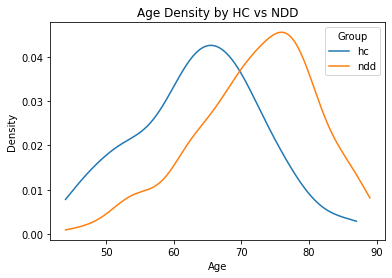

In [11]:
import numpy as np
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

# KDE plot of ages by hc_ndd
plt.figure()
for grp in pivot_psd['hc_ndd'].unique():
    ages = pivot_psd.loc[pivot_psd['hc_ndd'] == grp, 'age'].dropna()
    density = gaussian_kde(ages)
    xs = np.linspace(ages.min(), ages.max(), 200)
    plt.plot(xs, density(xs), label=grp)

plt.xlabel('Age')
plt.ylabel('Density')
plt.title('Age Density by HC vs NDD')
plt.legend(title='Group')
plt.show()


In [12]:
import numpy as np

age_hc  = pivot_psd.loc[pivot_psd['hc_ndd']=='hc',  'age']
age_ndd = pivot_psd.loc[pivot_psd['hc_ndd']=='ndd', 'age']

# Means & SDs
m1, s1, n1 = age_hc.mean(), age_hc.std(ddof=1), age_hc.size
m2, s2, n2 = age_ndd.mean(), age_ndd.std(ddof=1), age_ndd.size

# Pooled SD
s_pooled = np.sqrt(((n1-1)*s1**2 + (n2-1)*s2**2) / (n1+n2-2))

smd_age = (m1 - m2) / s_pooled
print(f"HC mean ± SD = {m1:.1f} ± {s1:.1f}, NDD = {m2:.1f} ± {s2:.1f}")
print(f"Standardized Mean Difference (age): {smd_age:.3f}")


HC mean ± SD = 63.7 ± 9.3, NDD = 72.2 ± 8.9
Standardized Mean Difference (age): -0.937


In [14]:
import pingouin as pg

# Extract age vectors for each group
age_hc  = pivot_psd.loc[pivot_psd['hc_ndd'] == 'hc',  'age']
age_ndd = pivot_psd.loc[pivot_psd['hc_ndd'] == 'ndd', 'age']

# Run Welch’s t‐test (auto‐detects unequal n’s/variances)
ttest_res = pg.ttest(
    x         = age_hc,
    y         = age_ndd,
    paired    = False,
    alternative = 'two-sided',
    confidence  = 0.95
)

# 4. View results rounded to 3 decimal places
ttest_res.round(3)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.923,247.543,two-sided,0.0,"[-10.14, -6.78]",0.937,3.222e+18,1.0


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set figure and subplots with only 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), sharey=True, gridspec_kw={'width_ratios': [3.2, 0.4, 2]})

# Keeping only the first row for each unique participant_id
df = pivot_psd.drop_duplicates(subset='participant_id', keep='first')

# Palette setup
colorblind_palette = sns.color_palette("colorblind")
# Adding red to the palette
colorblind11_palette = colorblind_palette + [(1.0, 0.0, 0.0)]  # Existing red addition

# Adding new colors to the palette
colorblind11_palette.extend(["#F72585", "#3A0CA3"])  # Append the new colors
palette = colorblind11_palette

sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"
# First subplot: Raincloud plot for "age" with grouping by center
ax1 = sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
                     palette=palette, scale="width", inner=None, ax=axs[0])
xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[0])

old_len_collections = len(ax1.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False,
              alpha=0.6, size=3, ax=axs[0])

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[0].set_xlim(xlim1)
axs[0].set_ylim(ylim1)
axs[0].set_title("Sites", fontweight='bold', size=18)
axs[0].set_xlabel("")
axs[0].set_ylabel("Age (years)", fontweight='bold', size=16)
axs[0].set_facecolor('white')
axs[0].tick_params(axis='y', labelsize=16)  # change 14 to whatever size you want


group_counts = pivot_psd.groupby('center')['participant_id'].nunique()
counts_group = [f"{group.upper()}\n (n={group_counts.loc[group]})" for group in df['center'].unique()]
axs[0].set_xticklabels(counts_group, rotation=45, size=15)

for spine in axs[0].spines.values():
    spine.set_edgecolor('k')
    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)

axs[0].set_xticklabels([tick.get_text().capitalize() for tick in axs[0].get_xticklabels()])

# Second subplot: Raincloud plot for "age" without grouping

pooled_palette = ["#66C2A5"]  # Single color for pooled KDE and dots
ax2 = sns.violinplot(y="age", data=df, inner=None, ax=axs[1], scale="width", color=pooled_palette[0])
sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])
xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])

old_len_collections = len(ax2.collections)

sns.stripplot(y="age", data=df, dodge=False, alpha=0.3, size=4, ax=axs[1], color=pooled_palette[0])  # Match colors

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[1].set_xlim(xlim2)
axs[1].set_ylim(ylim2)
axs[1].set_ylabel("")
axs[1].set_xlabel("")
axs[1].set_title("Pooled Sample", fontweight='bold', size=18)
axs[1].set_facecolor('white')

group_counts = pivot_psd['participant_id'].nunique()
counts_group = [f"All subjects \n (n={group_counts})"]
axs[1].set_xticklabels(counts_group, rotation=45, size=16)

for spine in axs[1].spines.values():
    spine.set_edgecolor('k')
    axs[1].spines['top'].set_visible(False)
    axs[1].spines['right'].set_visible(False)

# Third subplot: Raincloud plot for "age" with grouping by group
palette = ['forestgreen', 'dodgerblue', 'blue', 'hotpink', 'fuchsia', 'darkmagenta', 'chocolate']
group_order = ['hc', 'mci-ad', 'ad', 'pd', 'mci-lbd', 'lbd', 'ftd'] #['HC', 'MCI-AD', 'AD', 'PD', 'MCI-LBD', 'LBD', 'FTD'] #
df['group'] = pd.Categorical(df['group'], categories=group_order, ordered=True)
group_counts = df.groupby('group')['participant_id'].nunique()

ax3 = sns.violinplot(x="group", y="age", data=df, hue="group", dodge=False,
                     palette=palette, scale="width", inner=None, ax=axs[2])

xlim3 = ax3.get_xlim()
ylim3 = ax3.get_ylim()

for violin in ax3.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax3.transData))

sns.boxplot(x="group", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[2])

old_len_collections = len(ax3.collections)
sns.stripplot(x="group", y="age", data=df, hue="group", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[2])

for dots in ax3.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[2].set_xlim(xlim3)
axs[2].set_ylim(ylim3)
axs[2].set_title("Groups", fontweight='bold', size=18)
axs[2].set_xlabel(" ", fontweight='bold')
axs[2].set_ylabel("")
axs[2].set_facecolor('white')
#axs[2].legend_.remove()  # Remove legend


counts_group = [f"{group.upper()}\n (n={group_counts.loc[group]})" for group in group_order]
axs[2].set_xticklabels(counts_group, rotation=45, size=16)

for spine in axs[2].spines.values():
    spine.set_edgecolor('k')
    axs[2].spines['top'].set_visible(False)
    axs[2].spines['right'].set_visible(False)

sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.02, bottom=0.2)
plt.tight_layout()
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2a.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2a.jpg', dpi=1000, format='jpg')

plt.show()

## AGE & GENDER DESCRIPTIVES


In [15]:
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = pivot_psd.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Calculate the overall count of males and females
overall_female_count = (df['gender'] == 'f').sum()
overall_male_count = (df['gender'] == 'm').sum()

# Calculate the overall mean and standard deviation of age
overall_age_mean = df['age'].mean()
overall_age_std = df['age'].std()

# Calculate total participants
total_participants = len(df)

# Calculate percentages for males and females
female_percentage = (overall_female_count / total_participants) * 100
male_percentage = (overall_male_count / total_participants) * 100

# Create a summary dataframe for the overall counts and statistics
summary_df = pd.DataFrame({
    'center': ['Overall'],
    'participant_count': [total_participants],
    'female_count': [overall_female_count],
    'female_percentage': [female_percentage],
    'male_count': [overall_male_count],
    'male_percentage': [male_percentage],
    'age_mean': [overall_age_mean],
    'age_std': [overall_age_std]
})

summary_df

,center,participant_count,female_count,female_percentage,male_count,male_percentage,age_mean,age_std
0,Overall,639,321,50.234742,318,49.765258,70.126821,9.716752


In [17]:
pivot_psd['age'].describe()

count    639.000000
mean      70.126821
std        9.716752
min       44.000000
25%       64.000000
50%       71.000000
75%       77.000000
max       89.000000
Name: age, dtype: float64

In [18]:
# Use groupby, mean, and std to calculate mean and standard deviation for age in each group
group_stats = pivot_psd['age'].agg(['mean', 'std'])

# Rename the columns for clarity
group_stats.columns = ['mean_age', 'std_age']

# Print or display the results
print(group_stats)


mean    70.126821
std      9.716752
Name: age, dtype: float64


In [19]:
# Use groupby, mean, and std to calculate median p25 and p75
group_stats = pivot_psd['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Print or display the results
print(group_stats, 77-64)


median      71.0
<lambda>    64.0
<lambda>    77.0
Name: age, dtype: float64 13


In [20]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = pivot_psd.groupby(['center','group','gender'])['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])



# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
group_stats

median_age    p25_age    p75_age
center       group   gender                                  
california   hc      f        59.000000  54.000000  61.000000
                     m        69.000000  64.000000  73.500000
             pd      f        66.500000  60.250000  69.500000
                     m        62.000000  58.000000  68.500000
chieti       ad      f        76.000000  72.000000  80.000000
                     m        73.000000  71.000000  76.000000
             lbd     f        76.000000  72.000000  80.000000
                     m        77.000000  71.750000  80.000000
             mci-ad  f        84.000000  84.000000  84.000000
             pd      f        68.000000  68.000000  68.000000
                     m        71.000000  71.000000  71.000000
genoa        ad      f        77.000000  74.000000  83.000000
                     m        76.000000  74.000000  79.500000
iowa         hc      f        69.000000  64.750000  72.500000
                     m        72.000000  70.000000  78.500000
             mci-lbd m        80.000000  80.000000  80.000000
             pd      f        69.000000  64.750000  72.500000
                     m        70.000000  67.500000  71.000000
medellin     hc      f        62.000000  58.750000  65.000000
                     m        65.000000  60.500000  69.000000
             mci-lbd f        62.000000  60.750000  62.250000
                     m        69.000000  65.750000  71.000000
             pd      f        62.500000  54.750000  66.750000
                     m        63.000000  56.500000  65.750000
newcastle    ad      f        79.500000  74.500000  85.750000
                     m        78.000000  71.250000  80.000000
             lbd     f        81.000000  81.000000  81.000000
                     m        75.500000  70.750000  78.000000
oslo         hc      f        52.000000  50.000000  60.000000
                     m        54.000000  46.000000  65.000000
paris        mci-ad  f        73.008219  66.378767  78.259589
                     m        67.661644  60.231507  77.113699
             mci-lbd f        70.000000  68.500000  73.000000
                     m        72.000000  62.000000  75.000000
stavanger    ad      f        74.200000  70.900000  79.050000
             hc      f        76.000000  70.500000  81.500000
                     m        80.000000  63.000000  83.000000
             lbd     f        77.750000  77.425000  78.075000
                     m        72.500000  71.000000  77.000000
             mci-ad  f        75.000000  69.750000  78.250000
                     m        75.000000  70.500000  77.000000
             mci-lbd f        79.000000  79.000000  79.000000
                     m        66.200000  66.200000  66.200000
             pd      f        78.300000  78.300000  78.300000
thessaloniki ad      f        67.000000  60.500000  72.250000
                     m        69.500000  61.750000  71.000000
             ftd     f        67.000000  60.000000  71.000000
                     m        63.500000  61.250000  69.000000
             hc      f        70.000000  64.000000  72.000000
                     m        66.000000  63.000000  70.000000
turku        hc      f        67.000000  64.000000  69.500000
                     m        70.000000  64.500000  75.000000
             pd      f        69.000000  64.500000  75.500000
                     m        71.000000  66.000000  76.500000

In [21]:

# Capitalizing gender values, formatting group as uppercase, and capitalizing center
pivot_psd['center'] = pivot_psd['center'].str.capitalize()
pivot_psd['gender'] = pivot_psd['gender'].str.capitalize()
pivot_psd['group'] = pivot_psd['group'].str.upper()

# Group by the specified columns and calculate the median and IQR for age
group_stats = pivot_psd.groupby(['center', 'group', 'gender'])['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Count the unique participants at each level
center_counts = pivot_psd.groupby('center')['participant_id'].nunique()
group_counts = pivot_psd.groupby(['center', 'group'])['participant_id'].nunique()
gender_counts = pivot_psd.groupby(['center', 'group', 'gender'])['participant_id'].nunique()

# Reset the index to turn the multi-index into columns
group_stats.reset_index(inplace=True)

# Add the counts to the DataFrame
group_stats['center_count'] = group_stats['center'].map(center_counts)
group_stats['group_count'] = group_stats.set_index(['center', 'group']).index.map(group_counts)
group_stats['gender_count'] = group_stats.set_index(['center', 'group', 'gender']).index.map(gender_counts)

# Format the counts as strings
group_stats['center'] = group_stats['center'] + ' (n = ' + group_stats['center_count'].astype(str) + ')'
group_stats['group'] = group_stats['group'] + ' (n = ' + group_stats['group_count'].astype(str) + ')'
group_stats['gender'] = group_stats['gender'] + ' (n = ' + group_stats['gender_count'].astype(str) + ')'


# Round the age columns to three decimal places
group_stats['median_age'] = group_stats['median_age'].round(2)
group_stats['p25_age'] = group_stats['p25_age'].round(2)
group_stats['p75_age'] = group_stats['p75_age'].round(2)

# Change the decimal separator to ',' by converting the numbers to strings
# group_stats['median_age'] = group_stats['median_age'].apply(lambda x: f"{x:.3f}".replace('.', ','))
# group_stats['p25_age'] = group_stats['p25_age'].apply(lambda x: f"{x:.3f}".replace('.', ','))
# group_stats['p75_age'] = group_stats['p75_age'].apply(lambda x: f"{x:.3f}".replace('.', ','))


# Drop the count columns
group_stats = group_stats.drop(columns=['center_count', 'group_count', 'gender_count'])
group_stats

,center,group,gender,median_age,p25_age,p75_age
0,California (n = 31),HC (n = 16),F (n = 9),59.00,54.00,61.00
1,California (n = 31),HC (n = 16),M (n = 7),69.00,64.00,73.50
2,California (n = 31),PD (n = 15),F (n = 8),66.50,60.25,69.50
3,California (n = 31),PD (n = 15),M (n = 7),62.00,58.00,68.50
4,Chieti (n = 104),AD (n = 38),F (n = 23),76.00,72.00,80.00
5,Chieti (n = 104),AD (n = 38),M (n = 15),73.00,71.00,76.00
6,Chieti (n = 104),LBD (n = 63),F (n = 27),76.00,72.00,80.00
7,Chieti (n = 104),LBD (n = 63),M (n = 36),77.00,71.75,80.00
8,Chieti (n = 104),MCI-AD (n = 1),F (n = 1),84.00,84.00,84.00
9,Chieti (n = 104),PD (n = 2),F (n = 1),68.00,68.00,68.00


In [22]:
from pingouin import welch_anova, read_dataset
df = pivot_psd
aov = welch_anova(dv='age', between='gender', data=df).round(2)
aov


,Source,ddof1,ddof2,F,p-unc,np2
0,gender,1,631.92,0.11,0.75,0.0


In [23]:
from pingouin import welch_anova, read_dataset
df = pivot_psd
aov = welch_anova(dv='age', between='center', data=df).round(2)
aov


,Source,ddof1,ddof2,F,p-unc,np2
0,center,10,196.57,44.57,0.0,0.4


In [24]:
import pingouin as pg
gh = pg.pairwise_gameshowell(dv='age', between='center', data = df).round(3)
gh

,A,B,mean(A),mean(B),diff,se,T,df,pval,hedges
0,California,Chieti,63.387,75.212,-11.824,1.723,-6.864,41.228,0.000,-1.605
1,California,Genoa,63.387,77.247,-13.860,1.741,-7.963,42.682,0.000,-1.941
2,California,Iowa,63.387,70.500,-7.113,2.258,-3.150,56.763,0.084,-0.809
3,California,Medellin,63.387,63.403,-0.016,1.795,-0.009,47.481,1.000,-0.002
4,California,Newcastle,63.387,76.421,-13.034,1.842,-7.076,51.098,0.000,-1.673
5,California,Oslo,63.387,54.800,8.587,2.051,4.188,59.906,0.004,1.029
6,California,Paris,63.387,70.703,-7.316,1.967,-3.720,63.251,0.017,-0.751
7,California,Stavanger,63.387,74.306,-10.918,2.040,-5.353,59.993,0.000,-1.310
8,California,Thessaloniki,63.387,66.103,-2.716,1.774,-1.532,45.767,0.901,-0.347
9,California,Turku,63.387,68.553,-5.166,1.959,-2.636,56.980,0.255,-0.645


In [25]:
aov = welch_anova(dv='age', between='group', data=df).round(2)
aov

,Source,ddof1,ddof2,F,p-unc,np2
0,group,6,152.15,38.39,0.0,0.25


In [26]:
import pingouin as pg
gh = pg.pairwise_gameshowell(dv='age', between='group', data = df).round(3)
gh

,A,B,mean(A),mean(B),diff,se,T,df,pval,hedges
0,AD,FTD,74.428,63.652,10.776,1.818,5.929,27.748,0.000,1.304
1,AD,HC,74.428,63.693,10.736,0.963,11.152,307.066,0.000,1.229
2,AD,LBD,74.428,75.829,-1.401,0.859,-1.630,247.302,0.663,-0.185
3,AD,MCI-AD,74.428,71.754,2.675,1.253,2.135,124.306,0.339,0.308
4,AD,MCI-LBD,74.428,69.241,5.187,1.533,3.383,45.954,0.023,0.628
5,AD,PD,74.428,65.849,8.579,1.184,7.246,122.175,0.000,1.027
6,FTD,HC,63.652,63.693,-0.041,1.871,-0.022,31.052,1.000,-0.004
7,FTD,LBD,63.652,75.829,-12.177,1.820,-6.690,27.846,0.000,-1.876
8,FTD,MCI-AD,63.652,71.754,-8.102,2.036,-3.980,41.703,0.005,-0.861
9,FTD,MCI-LBD,63.652,69.241,-5.589,2.219,-2.518,47.364,0.176,-0.671


In [27]:
print('Female/Male ratio = ', 321/318)

Female/Male ratio =  1.009433962264151


In [28]:
expected, observed, stats = pg.chi2_independence(df, x='gender',y='center')
stats = stats.round(3)
stats

,test,lambda,chi2,dof,pval,cramer,power
0,pearson,1.000,38.240,10.0,0.0,0.245,0.997
1,cressie-read,0.667,38.473,10.0,0.0,0.245,0.997
2,log-likelihood,0.000,39.324,10.0,0.0,0.248,0.998
3,freeman-tukey,-0.500,40.328,10.0,0.0,0.251,0.998
4,mod-log-likelihood,-1.000,41.685,10.0,0.0,0.255,0.999
5,neyman,-2.000,45.645,10.0,0.0,0.267,1.000


In [29]:
import pingouin as pg
expected, observed, stats = pg.chi2_independence(df, x='gender',y='group')
stats = stats.round(3)
stats

,test,lambda,chi2,dof,pval,cramer,power
0,pearson,1.000,28.946,6.0,0.0,0.213,0.992
1,cressie-read,0.667,29.095,6.0,0.0,0.213,0.992
2,log-likelihood,0.000,29.650,6.0,0.0,0.215,0.993
3,freeman-tukey,-0.500,30.316,6.0,0.0,0.218,0.994
4,mod-log-likelihood,-1.000,31.230,6.0,0.0,0.221,0.995
5,neyman,-2.000,33.977,6.0,0.0,0.231,0.998


In [30]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = pivot_psd['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])



# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

median      71.0
<lambda>    64.0
<lambda>    77.0
Name: age, dtype: float64


In [31]:
# Use groupby, mean, and std to calculate mean and standard deviation for age in each group
group_stats = pivot_psd.groupby('gender')['age'].agg(['mean', 'std'])

# Rename the columns for clarity
group_stats.columns = ['mean_age', 'std_age']

# Print or display the results
print(group_stats)


         mean_age    std_age
gender                      
F       70.250932  10.191455
M       70.001538   9.227234


In [190]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = pivot_psd.groupby('group')['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

         median_age   p25_age    p75_age
group                                   
AD        76.000000  70.00000  80.000000
FTD       64.000000  60.50000  70.500000
HC        65.000000  58.00000  70.000000
LBD       76.000000  72.00000  80.000000
MCI-AD    73.139726  65.69863  78.372603
MCI-LBD   69.000000  62.25000  75.750000
PD        66.000000  61.00000  71.000000


In [32]:
import pandas as pd

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = pivot_psd.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Group the dataset by center and gender
#grouped_df = df.groupby(['center', 'gender'])
grouped_df = df.groupby(['center'])


# Calculate the mean and standard deviation of age for each center
summary_df = grouped_df.agg({'age': ['mean', 'std']})

# Reset the index to flatten the grouped columns
summary_df = summary_df.reset_index()

# Calculate the participant count, female count, and male count for each center
summary_df['participant_count'] = grouped_df['participant_id'].count().values
summary_df['female_count'] = grouped_df.apply(lambda x: (x['gender'] == 'f').sum()).values
summary_df['male_count'] = grouped_df.apply(lambda x: (x['gender'] == 'm').sum()).values

# Display Table 1
summary_df


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_4520\4276318643.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_df['female_count'] = grouped_df.apply(lambda x: (x['gender'] == 'f').sum()).values
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_4520\4276318643.py:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_df['male_count'] = grouped_df.apply(lambda x: (x['gender'] == 'm').

center        age           participant_count female_count  \
                       mean       std                                  
0     California  63.387097  8.838090                31           17   
1         Chieti  75.211538  6.823251               104           52   
2          Genoa  77.246753  6.266359                77           54   
3           Iowa  70.500000  8.500545                28           16   
4       Medellin  63.402778  7.108138                72           24   
5      Newcastle  76.421053  7.053235                57           15   
6           Oslo  54.800000  7.680380                35           22   
7          Paris  70.703221  9.988504                74           37   
8      Stavanger  74.305556  7.686796                36           17   
9   Thessaloniki  66.103448  7.378527                87           44   
10         Turku  68.552632  7.081370                38           23   

   male_count  
               
0          14  
1          52  
2          23  
3          12  
4          48  
5          42  
6          13  
7          37  
8          19  
9          43  
10         15

## BARPLOTS BY GENDER

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = pivot_psd.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Color palette
colorblind_palette = sns.color_palette("colorblind")
colorblind11_palette = colorblind_palette + [(1.0, 0.0, 0.0)] + [(1.0, 0.0, 0.0)]  # Add reds for > 10 centers
palette = colorblind11_palette

# Create a 1x2 grid layout
fig = plt.figure(figsize=(16, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="center", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex", fontweight='bold', size = 16)
ax1.set_ylabel("Count", fontweight='bold', size = 16)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.set_facecolor('white')
ax1.tick_params(axis='y', labelsize=16)  
ax1.tick_params(axis='x', labelsize=16)  


# Set spines color
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

for p in ax1.patches:
    height = p.get_height()
    if height > 0:  # Only annotate non-zero bars
        ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2+0.005, height+2.1),
                ha='center', va='bottom', rotation = 90, size=16)

# Move the legend outside
legend1 = ax1.legend(title='Sites', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white', frameon=False, fontsize=14)
legend1.get_title().set_fontweight('bold')
legend1.get_title().set_fontsize(16)      # bigger title text

# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().capitalize())

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

palette = ["#F72585", "#3A0CA3"]# "#7209B7",

counts = df.groupby(['center', 'gender']).size().reset_index(name='count')

total_counts = counts.groupby('center')['count'].transform('sum')

counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='center', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage", fontweight='bold', size = 16)
ax2.set_ylim(0, 100)
ax2.tick_params(axis='y', labelsize=16)  
ax2.tick_params(axis='x', labelsize=16)  

legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white', frameon=False, fontsize=14)
legend2.get_title().set_fontweight('bold')
legend2.get_title().set_fontsize(16)      # bigger title text

# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, size = 16)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])

ax2.set_facecolor('white')

# Set spines color
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

for p in ax2.patches:
    height = p.get_height()
    if height > 0:  # Only annotate non-zero bars    
        ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2+0.25, height+3),
                ha='right', va='bottom', size=15, rotation=90)


# Adjust spacing between subplots
fig.tight_layout()

plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2b.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2b.jpg', dpi=1000, format='jpg')
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


## BARPLOTS BY GROUP

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = pivot_psd.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Define the custom colors
palette = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']

# # Create a ListedColormap
# custom_palette = ListedColormap(palette)

# Create a 1x2 grid layout
fig = plt.figure(figsize=(16, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="group", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex", fontweight='bold', size = 16)
ax1.set_ylabel("Count", fontweight='bold', size = 16)
ax1.set_xticklabels([tick.get_text().upper() for tick in ax1.get_xticklabels()])
ax1.set_facecolor('white')
ax1.tick_params(axis='y', labelsize=16)  
ax1.tick_params(axis='x', labelsize=16)  

# Set spines color
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

for p in ax1.patches:
    height = p.get_height()
    if height > 0:  # Only annotate non-zero bars  
        ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2+0.005, height+2),
                ha='center', va='bottom', rotation = 90, size=16)

# Move the legend outside
legend1 = ax1.legend(title='Group', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white', frameon=False, fontsize = 16)
legend1.get_title().set_fontweight('bold')
legend1.get_title().set_fontsize(16)      # bigger title text

# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().upper())


palette = ["#F72585", "#3A0CA3"]# "#7209B7",

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['group', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('group')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100



# Define the desired order
group_order = ['HC', 'MCI-AD', 'AD', 'PD', 'MCI-LBD', 'LBD', 'FTD']

# Ensure 'group' column follows the specified order
counts['group'] = pd.Categorical(counts['group'], categories=group_order, ordered=True)

# Sort the dataframe to reflect the order before plotting
counts = counts.sort_values('group')


sns.barplot(x='group', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage", fontweight='bold', size = 16)
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white', frameon=False, fontsize = 16)
legend2.get_title().set_fontweight('bold')
legend2.get_title().set_fontsize(16)      # bigger title text

# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels([tick.get_text().upper() for tick in ax2.get_xticklabels()], rotation=90)

ax2.set_facecolor('white')
ax2.tick_params(axis='y', labelsize=16)  
ax2.tick_params(axis='x', labelsize=16)  


# Set spines color
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

for p in ax2.patches:
    height = p.get_height()
    if height > 0:  # Only annotate non-zero bars    
        ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2+0.005, height+3),
                ha='center', va='bottom', size=16, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()


plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2c.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2c.jpg', dpi=1000, format='jpg')
# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


# Figure 2

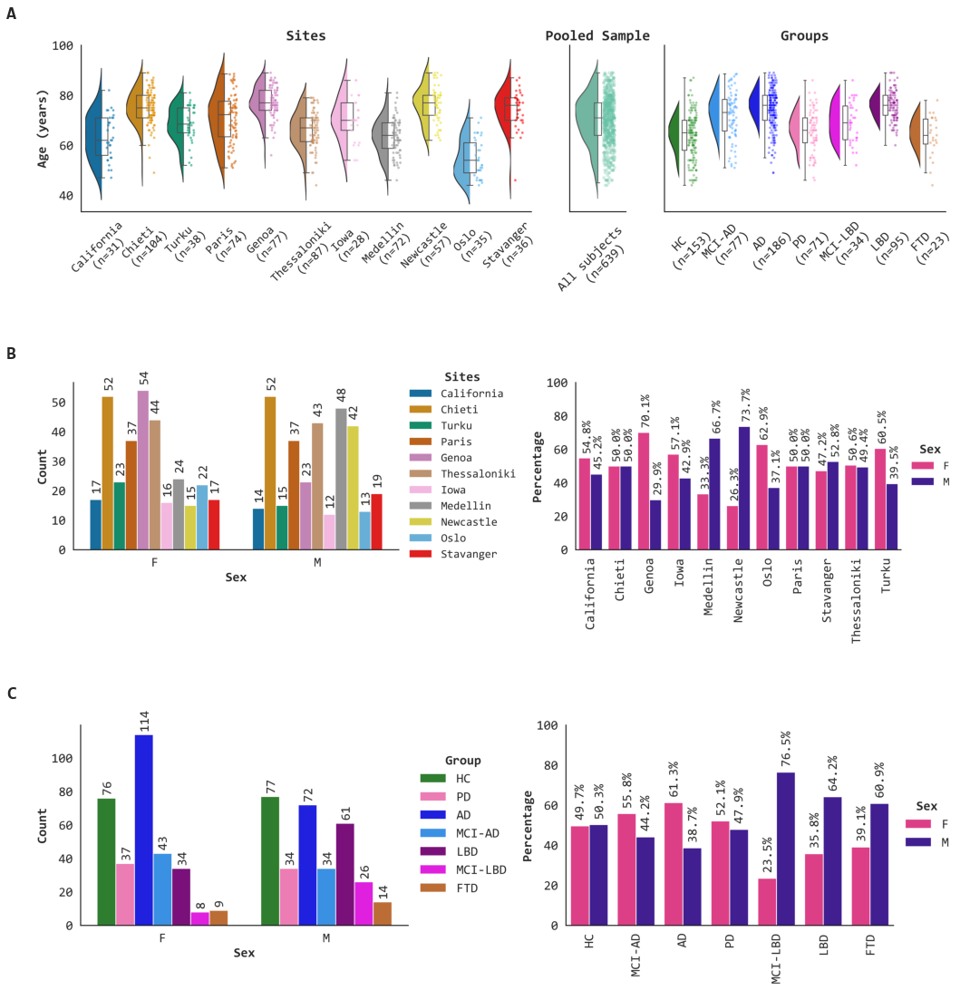

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2a.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2b.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2c.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(3, 1, figsize=(15, 16))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B', 'C']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.01, 1.05, annotations[i], transform=ax.transAxes,
            fontsize=20, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots
plt.subplots_adjust(hspace=0.005)
plt.tight_layout()


# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_2'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


plt.show()

## reComBat psd

In [33]:
from reComBat import reComBat
import numpy as np


df = pivot_psd.drop(columns='hc_ndd').copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets

model = reComBat(parametric=True,
                    model='elastic_net',
                    config={'alpha': 1e-6, 'max_iter': 50000},
                    n_jobs=7,
                    verbose=True)

# Creating a subset of df and renaming the column
covars = df.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.gender = covars.gender.astype(str)
covars.group = covars.group.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_data = model.transform(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
df_harmonized = pd.concat([df.iloc[:,:5], transformed_data], axis=1)
all_combat = df_harmonized.copy()


[reComBat] 2025-08-09 16:48:10,941 Starting to fot reComBat.
[reComBat] 2025-08-09 16:48:10,943 Fit the linear model.
[reComBat] 2025-08-09 16:48:11,410 Starting the empirical parametric optimisation.
[reComBat] 2025-08-09 16:48:11,413 Optimisation finished.
[reComBat] 2025-08-09 16:48:11,414 reComBat is fitted.
[reComBat] 2025-08-09 16:48:11,416 Starting to transform.
[reComBat] 2025-08-09 16:48:11,420 Transform finished.


In [34]:
np.unique(all_combat['group'])

array(['AD', 'FTD', 'HC', 'LBD', 'MCI-AD', 'MCI-LBD', 'PD'], dtype=object)

               variable    VIF
0                 const  97.65
1         center_Chieti   8.00
2          center_Genoa   6.58
3           center_Iowa   1.86
4       center_Medellin   3.11
5      center_Newcastle   5.29
6           center_Oslo   2.28
7          center_Paris   6.88
8      center_Stavanger   3.17
9   center_Thessaloniki   4.98
10         center_Turku   2.12
11             gender_M   1.10
12             group_AD   5.90
13            group_FTD   1.63
14            group_LBD   4.68
15         group_MCI-AD   4.90
16        group_MCI-LBD   1.82
17             group_PD   1.57
18                  age   1.68


C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_4520\277267575.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif, x='variable', y='VIF', palette='tab20', ax=ax)
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_4520\277267575.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=16)


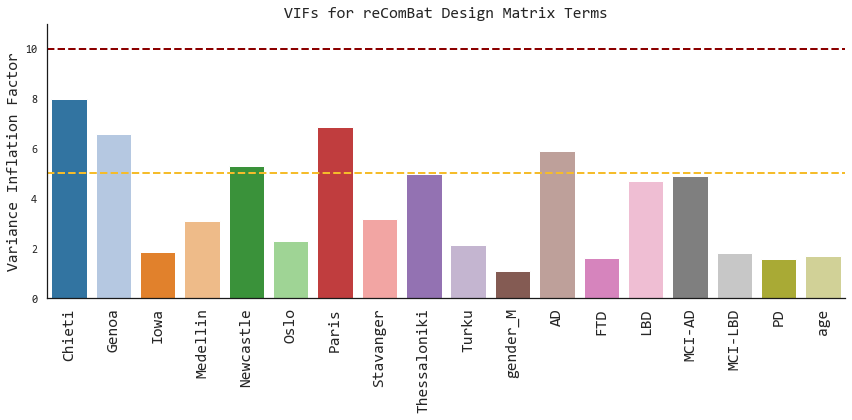

In [35]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# 1) Build the design with HC as the reference level
X = covars[['center','gender','group','age_numerical']].copy()

# Force categorical order so HC is dropped as the reference
grp_order = ['HC','AD','FTD','LBD','MCI-AD','MCI-LBD','PD']
X['group'] = pd.Categorical(X['group'], categories=grp_order, ordered=True)

# One-hot encode (drops first level per categorical; for group that's HC)
X_dummies = pd.get_dummies(X[['center','gender','group']], drop_first=True).astype(float)

# Add numeric age
X_dummies['age'] = X['age_numerical'].astype(float)

# 2) Add intercept
X_design = sm.add_constant(X_dummies).astype(float)

# 3) Compute VIFs
vif = pd.DataFrame({
    'variable': X_design.columns,
    'VIF': [variance_inflation_factor(X_design.values, i)
            for i in range(X_design.shape[1])]
})

print(vif.round(2))


vif = vif[vif['variable'] != 'const'].reset_index(drop=True)
# Remove “center_” and “group_” prefixes
vif['variable'] = vif['variable'].str.replace(r'^(center_|group_)', '', regex=True)




import matplotlib.pyplot as plt
import seaborn as sns

# --- Set Consolas as the font and styling ---
plt.rcParams['font.family'] = 'monospace'
plt.rcParams['font.monospace'] = ['Consolas']
plt.rcParams['axes.grid'] = False

# White background
sns.set_style("white")
sns.set(font="Consolas")


# Create the barplot
fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(data=vif, x='variable', y='VIF', palette='tab20', ax=ax)

# Rotate x-tick labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=16)

# Labels and title
ax.set_xlabel('', fontsize=16)
ax.set_ylabel('Variance Inflation Factor', fontsize=16)
ax.set_title('VIFs for reComBat Design Matrix Terms', fontsize=16)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Ensure white background
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
# Add dashed horizontal lines at VIF thresholds
ax.axhline(10, color='darkred', linestyle='--', linewidth=2)
ax.axhline(5, color="#F5BC2B", linestyle='--', linewidth=2)

# Set y-limits
ax.set_ylim(0, 11)

# Set spines color
for spine in ax.spines.values():
    spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


# Plot scale/location factors

In [209]:
import pandas as pd
import numpy as np

# Your feature & batch lists
features = df.columns[5:].tolist()          # length = 146
batches  = covars.center.unique().tolist()  # length = 11

# 1) Location adjustments γ̂* (raw shape: 11 × 146)
raw_loc = model.gamma_star_hat_
loc_adj = pd.DataFrame(
    raw_loc.T,        # transpose to 146 × 11
    index=features,   # rows = features
    columns=batches   # cols = batches
)

# 2) Scale adjustments δ̂* = sqrt(δ̂*²)
raw_delta2 = model.delta_star_squared_hat_   # also 11 × 146
sca_adj = pd.DataFrame(
    np.sqrt(raw_delta2.T),  # transpose then sqrt
    index=features,
    columns=batches
)


# Extract numeric frequency values from the index (e.g. "psd_freq 1.0" -> 1.0)
freqs = np.array([float(idx.split()[-1]) for idx in loc_adj.index])

C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_19280\3413420944.py:79: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


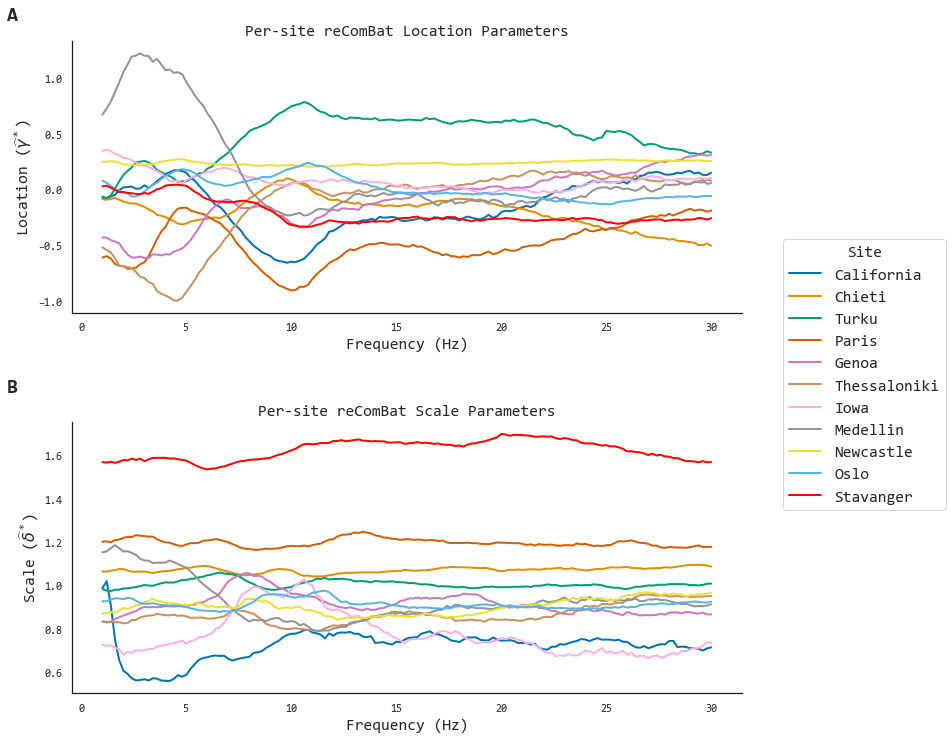

In [216]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Set Consolas as the font ---
plt.rcParams['font.family'] = 'monospace'
plt.rcParams['font.monospace'] = ['Consolas']
plt.rcParams['axes.grid'] = False


# --- White background ---
sns.set(font="Consolas")



# --- Reconstruct loc_adj and sca_adj ---
features = df.columns[5:].tolist()                # 146 PSD bins
batches  = covars.center.unique().tolist()        # 11 site labels

raw_loc    = model.gamma_star_hat_                # shape: [11 × 146]
raw_delta2 = model.delta_star_squared_hat_        # shape: [11 × 146]

loc_adj = pd.DataFrame(raw_loc.T, index=features, columns=batches)
sca_adj = pd.DataFrame(np.sqrt(raw_delta2.T), index=features, columns=batches)

# --- Extract numeric frequencies ---
freqs = np.array([float(f.split()[-1]) for f in loc_adj.index])

# --- Color palette ---
base_cb = sns.color_palette("colorblind")
colorblind11_palette = base_cb + [(1.0, 0.0, 0.0), (1.0, 0.0, 0.0)]
palette = colorblind11_palette[:len(batches)]

# --- Create figure with 2 rows, 1 column ---
# --- Create figure with 2 rows, 1 column and reduced vertical spacing ---
fig, axes = plt.subplots(2, 1, figsize=(12, 12), sharex=False,
                         gridspec_kw={'hspace': 0.4})



# --- Top subplot: Location adjustments ---
ax1 = axes[0]
for clr, site in zip(palette, batches):
    ax1.plot(freqs, loc_adj[site], label=site, color=clr, alpha=1, lw= 2)
ax1.set_ylabel(r'Location ($\widehat{\gamma}^*$)', fontsize=16)
ax1.set_xlabel('Frequency (Hz)', fontsize=16)
ax1.set_title('Per-site reComBat Location Parameters', fontsize=16)
ax1.set_facecolor('white')
# Set spines color
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)


# --- Bottom subplot: Scale adjustments ---
ax2 = axes[1]
for clr, site in zip(palette, batches):
    ax2.plot(freqs, sca_adj[site], label=site, color=clr, alpha=1, lw= 2)
ax2.set_ylabel(r'Scale ($\widehat{\delta}^*$)', fontsize=16)
ax2.set_title('Per-site reComBat Scale Parameters', fontsize=16)
ax2.set_xlabel('Frequency (Hz)', fontsize=16)
ax2.set_facecolor('white')

# Set spines color
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)


# --- Legend outside ---
axes[0].legend(title='Site', bbox_to_anchor=(1.05, 0.3), loc='upper left', facecolor='white', fontsize=16, title_fontsize= 16)

fig.text(0.05, 0.92, "A", ha='left', va='top', fontsize=20, fontweight='bold')
fig.text(0.05, 0.49, "B", ha='left', va='top', fontsize=20, fontweight='bold')

plt.tight_layout()
plt.show()


In [47]:
all_combat.to_feather('D:/papers_alberto/edlb_combat_psd/data/all_sub_psd_median_combat.feather')

# BATCH PCA PAPER

In [36]:
def plot_channel_power_ax(df, fig_title= '', plot_variable = '', group_by = '', ylim = (-11.5, -8.5), legend_title = '', ax=None, legend=True):
    # If no ax is provided, create a new figure (for standalone use)
    if ax is None:
        ax = plt.gca()

    sns.set_style("white")
    sns.set(font="Consolas")
    sns.set_style(rc={'axes.facecolor': 'white'})

    # Get unique groups and assign colors from the sns palette
    group_categories = df[group_by].unique()
    palette = sns.color_palette(colorblind11_palette, len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df[group_by] == group]
        mean_group = group_df.groupby(['frequency'])[plot_variable].mean()
        std_group = group_df.groupby(['frequency'])[plot_variable].std()
        num_samples = group_df.groupby(['frequency'])[plot_variable].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        ax.plot(mean_group.index, mean_group.values, linewidth=2, label=group.capitalize(), alpha=0.5, color=color)
        ax.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df[group_by].unique()
        for center in centers:
            center_mean = group_df[group_df[group_by] == center].groupby(['frequency'])[plot_variable].mean()
            ax.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.2)

    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Power (μV$^2$)')
    ax.set_ylim(ylim)
    ax.grid(False)  # Turn off the grid

    # Only add legend if the 'legend' parameter is set to True
    if legend:
        ax.legend(loc='center right', bbox_to_anchor=(1.42, 0.5), ncol=1, frameon=True, title=legend_title)

    ax.set_title(fig_title, size=20)

    sns.despine()  # Remove the top and right spines
    # Set the spines color and visibility
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
    ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6)

    return ax  # Return the axis object for further use


## Reshape to long format

In [36]:
import pandas as pd

# Assume you have a DataFrame called combat_psd
combat_psd = pd.melt(all_combat, id_vars=['participant_id', 'center', 'group', 'age', 'gender'], 
                     value_vars=all_combat.columns[:], var_name='frequency', value_name='psd')

# Remove "frequency" word and brackets from the frequency column
combat_psd['frequency'] = combat_psd['frequency'].str.replace('psd_freq', '').str.rstrip('')
# Round the frequency values to 1 decimal place
combat_psd['frequency'] = combat_psd['frequency'].astype(float).round(1)
# Sort the dataframe by participant_id
combat_psd = combat_psd.sort_values(by=['participant_id', 'frequency'])
# Reset the index
combat_psd = combat_psd.reset_index(drop=True)



# Print the final unpivoted dataframe
print(combat_psd)

      participant_id      center group   age gender  frequency        psd
0              c_hc1  California    HC  54.0      F        1.0  -9.492026
1              c_hc1  California    HC  54.0      F        1.2  -9.492081
2              c_hc1  California    HC  54.0      F        1.4  -9.461076
3              c_hc1  California    HC  54.0      F        1.6  -9.451670
4              c_hc1  California    HC  54.0      F        1.8  -9.464036
...              ...         ...   ...   ...    ...        ...        ...
93289    sta_D20171K   Stavanger    HC  65.0      F       29.2 -11.374335
93290    sta_D20171K   Stavanger    HC  65.0      F       29.4 -11.401556
93291    sta_D20171K   Stavanger    HC  65.0      F       29.6 -11.479604
93292    sta_D20171K   Stavanger    HC  65.0      F       29.8 -11.544009
93293    sta_D20171K   Stavanger    HC  65.0      F       30.0 -11.512281

[93294 rows x 7 columns]


In [37]:
import pandas as pd

pivot_psd.drop(columns='hc_ndd', inplace = True)

# Assume you have a DataFrame called unharm_psd
unharm_psd = pd.melt(pivot_psd, id_vars=['participant_id', 'center', 'group', 'age', 'gender'], 
                     value_vars=pivot_psd.columns[:], var_name='frequency', value_name='psd')

# Remove "frequency" word and brackets from the frequency column
unharm_psd['frequency'] = unharm_psd['frequency'].str.replace('psd_freq', '').str.rstrip('')
# Round the frequency values to 1 decimal place
unharm_psd['frequency'] = unharm_psd['frequency'].astype(float).round(1)
# Sort the dataframe by participant_id
unharm_psd = unharm_psd.sort_values(by=['participant_id', 'frequency'])
# Reset the index
unharm_psd = unharm_psd.reset_index(drop=True)



# Print the final unpivoted dataframe
print(unharm_psd)

      participant_id      center group   age gender  frequency        psd
0              c_hc1  California    HC  54.0      F        1.0  -9.523721
1              c_hc1  California    HC  54.0      F        1.2  -9.513538
2              c_hc1  California    HC  54.0      F        1.4  -9.511992
3              c_hc1  California    HC  54.0      F        1.6  -9.557238
4              c_hc1  California    HC  54.0      F        1.8  -9.603472
...              ...         ...   ...   ...    ...        ...        ...
93289    sta_D20171K   Stavanger    HC  65.0      F       29.2 -11.259767
93290    sta_D20171K   Stavanger    HC  65.0      F       29.4 -11.289169
93291    sta_D20171K   Stavanger    HC  65.0      F       29.6 -11.364419
93292    sta_D20171K   Stavanger    HC  65.0      F       29.8 -11.430858
93293    sta_D20171K   Stavanger    HC  65.0      F       30.0 -11.401187

[93294 rows x 7 columns]


# Figure 3

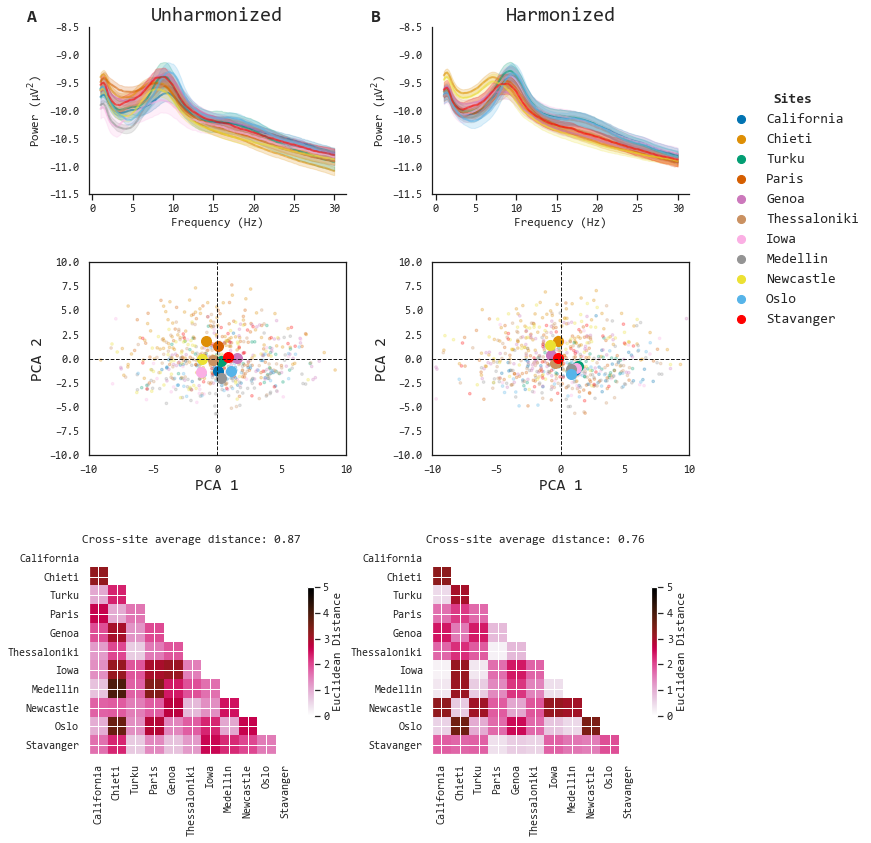

In [72]:
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker


# Set palette and labels
group_labels = {'California': 'California', 'Chieti': 'Chieti', 'Turku': 'Turku', 'Paris': 'Paris', 'Genoa': 'Genoa', 'Thessaloniki':'Thessaloniki', 'Iowa': 'Iowa', 
                'Medellin':'Medellin', 'Newcastle':'Newcastle','Oslo': 'Oslo', 'Stavanger':'Stavanger'}#'lemon': 'LEMON',

                
sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each center
X_unharmonized = pivot_psd.loc[:, ~pivot_psd.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = pivot_psd['center'].values

X_neurocombat = all_combat.loc[:, ~all_combat.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_neurocombat = all_combat['center'].values


palette = sns.color_palette(colorblind11_palette, len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}
from sklearn.decomposition import PCA

# Fit PCA
pca = PCA(n_components=2, random_state=42)
X_pca_unharmonized = pca.fit_transform(X_unharmonized)
X_pca_neurocombat = pca.fit_transform(X_neurocombat)

# Function to plot PCA results
def plot_pca(X_pca, labels, title, ax):
    ax.scatter(X_pca[:, 0], X_pca[:, 1], s=7, c=[colors[label] for label in labels], alpha=0.25)
    ax.axhline(0, color='k', linestyle='--', linewidth=1)
    ax.axvline(0, color='k', linestyle='--', linewidth=1)  
    for group in group_labels:
        ax.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        center_point = X_pca[group_indices, :].mean(axis=0)
        ax.scatter(center_point[0], center_point[1], s=100, c=[colors[group]], marker='o')
        
    ax.set_xlim(-10, 10)
    ax.set_ylim(-10, 10)
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('PCA 1', fontsize=16)
    ax.set_ylabel('PCA 2', fontsize=16)
    ax.set_facecolor('white')
    ax.grid(False)
    
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('k')



# Plot unharmonized and harmonized psd, pca, matrixes
fig, axs = plt.subplots(3, 2, figsize=(10, 12), gridspec_kw={'height_ratios': [0.65,0.75,1]})


plot_channel_power_ax(unharm_psd, fig_title='Unharmonized', plot_variable='psd', group_by='center', legend = False, ax=axs[0, 0])
axs[0, 0].set_facecolor('white')


plot_channel_power_ax(combat_psd, fig_title='Harmonized', plot_variable='psd', group_by='center', legend = False, ax=axs[0, 1])
axs[0, 1].set_facecolor('white')



plot_pca(X_pca_unharmonized, labels_unharmonized, ' ', axs[1, 0])
plot_pca(X_pca_neurocombat, labels_neurocombat, ' ', axs[1, 1])

# Create a single legend for the first two subplots and place it to the right
handles, labels = axs[1, 0].get_legend_handles_labels()

legend = fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 0.9), facecolor='white', ncol=1, title = "Sites", frameon= False, 
                    title_fontsize = 14, fontsize=14)
legend.get_title().set_fontweight('bold')
for handle in legend.legend_handles:
    handle.set_sizes([65])

# Calculate the Euclidean distances between center points for PCA
center_points_pca_unharmonized = {}
center_points_pca_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    center_points_pca_unharmonized[group] = X_pca_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    center_points_pca_neurocombat[group] = X_pca_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_pca_unharmonized = euclidean_distances(list(center_points_pca_unharmonized.values()))
distances_pca_neurocombat = euclidean_distances(list(center_points_pca_neurocombat.values()))

distances_pca_unharmonized = np.tril(distances_pca_unharmonized, k=-1)
distances_pca_neurocombat = np.tril(distances_pca_neurocombat, k=-1)



plt.subplot(325)
plt.imshow(distances_pca_unharmonized, cmap=cmap_r, vmax=5)
plt.colorbar(label='Euclidean Distance', shrink=0.5)
plt.title('Cross-site average distance: {:.2f}'.format(np.mean(distances_pca_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(326)
plt.imshow(distances_pca_neurocombat, cmap=cmap_r, vmax=5)
plt.colorbar(label='Euclidean Distance', shrink=0.5)
plt.title('Cross-site average distance: {:.2f}'.format(np.mean(distances_pca_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))


# Annotations for each subplot
annotations = ['A', 'B', '', '','', '']

# Add annotations and adjust subplots' layout
for i, ax in enumerate(axs.flatten()):
    ax.text(-0.2, 1.1, annotations[i], transform=ax.transAxes, fontsize=18, fontweight='bold', va='top', ha='right')


from matplotlib.legend_handler import HandlerBase
import matplotlib.patches as mpatches


# Adjust the spacing of the subplots
plt.subplots_adjust(top=0.9, bottom=0.0001, left=0.00009, right=1.05, hspace=0.3, wspace=0.55)

plt.tight_layout()
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_3.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
plt.savefig('D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_3.jpg', dpi=1000, format='jpg', bbox_inches='tight')

plt.show();

Joyplots

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def joyplot(data, variable, hue, quantile_colors, size, title="", x_label="", y_label="", height=1, xlims=(-14,-8)):
    # Initialize the figure and get the Axes object
    sns.set(font="Consolas")
    fig, ax = plt.subplots(figsize=size)

    # Get unique values of the hue variable for y-axis labels
    unique_values = data[hue].unique()

    # Loop over each category in the hue variable
    for i, category in enumerate(unique_values):
        category_data = data[data[hue] == category]

        # Calculate the quantiles for each distribution
        q1 = np.percentile(category_data[variable], 25)
        q2 = np.percentile(category_data[variable], 50)
        q3 = np.percentile(category_data[variable], 75)
        q4 = np.percentile(category_data[variable], 100)
        sns.set(font='Consolas')
        sns.set_style(rc={'axes.facecolor': 'white'})

        # Create a KDE plot for the data
        kde = sns.kdeplot(category_data[variable], color='grey', alpha=0.5, bw_adjust=0.5, ax=ax)

        # Get the line data from the plot
        kde_x, kde_y = kde.lines[-1].get_data()
        kde_y = kde_y * height + i * height  # Normalize the y-values to the same height and offset by index

        # Plot the filled quantiles
        ax.fill_between(kde_x, i * height, kde_y, where=(kde_x <= q1), color=quantile_colors[0], alpha=0.5)
        ax.fill_between(kde_x, i * height, kde_y, where=(kde_x > q1) & (kde_x <= q2), color=quantile_colors[1], alpha=0.5)
        ax.fill_between(kde_x, i * height, kde_y, where=(kde_x > q2) & (kde_x <= q3), color=quantile_colors[2], alpha=0.5)
        ax.fill_between(kde_x, i * height, kde_y, where=(kde_x > q3), color=quantile_colors[3], alpha=0.5)

        # Remove the original line
        kde.lines[-1].remove()

    # Set the title, and x and y labels of the plot
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel(x_label if x_label else str(variable).upper(), fontweight='bold')
    ax.set_ylabel(y_label if y_label else str(hue).upper(), fontweight='bold')

    # Set y-ticks as labels from the unique values of the hue variable in uppercase
    ax.set_yticks(np.arange(len(unique_values)) * height)
    ax.set_yticklabels([str(value).capitalize() for value in unique_values], fontweight='bold')
    ax.set_facecolor('white')

    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # Hide the grid
    ax.grid(False)
    ax.set_xlim(xlims)
    # Show the plot
    plt.show()

# Example usage
# data = pd.read_csv("your_data.csv")  # Load your data
# fixed_height_joyplot(data, variable='PSD', hue='Site', quantile_colors=['blue', 'purple', 'red', 'orange'], size=(10, 8), title="Unharmonized")


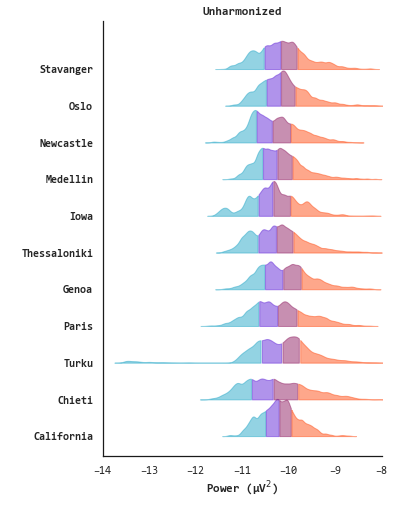

In [41]:
# Define the colors for each quantile
import cmasher as cmr

quantile_colors = cmr.take_cmap_colors('cmr.guppy_r', N=4, cmap_range=(0.1, 0.9), return_fmt='hex')
# Call the joyplot function
joyplot(unharm_psd, 'psd', 'center', quantile_colors, size = (5,8), title="Unharmonized", x_label="Power (μV$^2$)", y_label=" ")

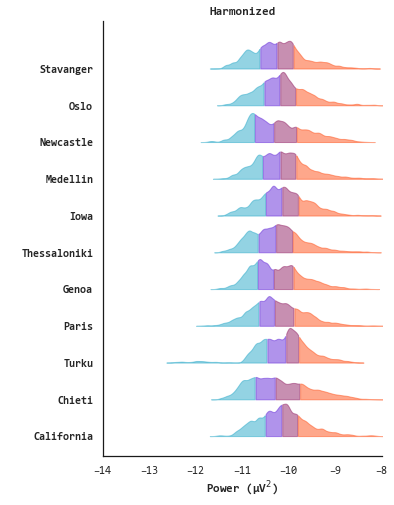

In [42]:
# Define the colors for each quantile
import cmasher as cmr

quantile_colors = cmr.take_cmap_colors('cmr.guppy_r', N=4, cmap_range=(0.1, 0.9), return_fmt='hex')
# Call the joyplot function
joyplot(combat_psd, 'psd', 'center', quantile_colors, size = (5,8), title="Harmonized", x_label="Power (μV$^2$)", y_label=" ")

Histograms unharmonized vs harmonized

C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_21140\349267656.py:15: UserWarning: The palette list has more values (13) than needed (11), which may not be intended.
  sns.histplot(data=unharm_psd, x='psd', hue="center", element="bars", multiple='stack', fill=True, ax=axes[0], alpha = 0.666, palette=colorblind11_palette, bins=100, stat='density', edgecolor="black")
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_21140\349267656.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(handles=None, labels=None, title='', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
C:\Users\sesam_analysis\AppData\Local\Temp\ipykernel_21140\349267656.py:31: UserWarning: The palette list has more values (13) than needed (11), which may not be intended.
  sns.histplot(data=combat_psd, x='psd', hue="center", element="bars",
C:\Users\sesam_analysis\

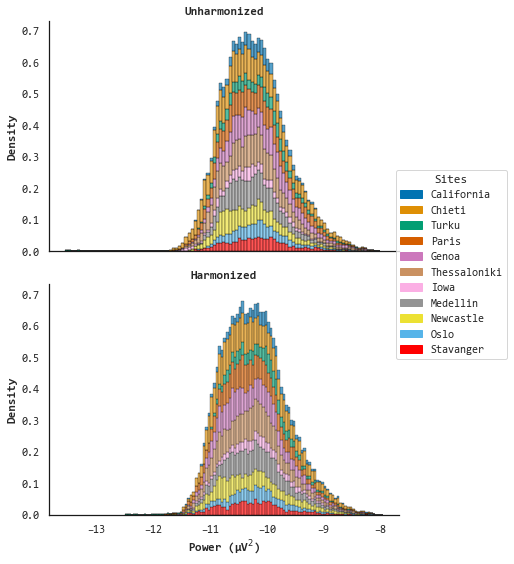

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming `unharm_psd` is the DataFrame we previously worked with and has been loaded with log10 transformed 'psd' values



sns.set(font="Consolas")

# Now create the subplots
fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharex=True, sharey = True)

# First subplot without hue
sns.histplot(data=unharm_psd, x='psd', hue="center", element="bars", multiple='stack', fill=True, ax=axes[0], alpha = 0.666, palette=colorblind11_palette, bins=100, stat='density', edgecolor="black")
axes[0].set_title('Unharmonized', fontweight='bold')
axes[0].set_xlabel('Power (μV$^2$)', fontweight='bold')
axes[0].set_ylabel('Density', fontweight='bold')
axes[0].set_facecolor('white')  # Set the background color
axes[0].legend(handles=None, labels=None, title='', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
axes[0].grid(False)  # Turn off the grid
# Set spines color
for spine in axes[0].spines.values():
    spine.set_edgecolor('k')
    axes[0].spines['top'].set_visible(False)
    axes[0].spines['right'].set_visible(False)



# Second subplot with hue by 'center'
sns.histplot(data=combat_psd, x='psd', hue="center", element="bars", 
             multiple='stack', fill=True, ax=axes[1], alpha = 0.666, palette=colorblind11_palette, bins=100, stat='density', edgecolor="black")
axes[1].set_title('Harmonized', fontweight='bold')
axes[1].set_xlabel('Power (μV$^2$)', fontweight='bold')
axes[1].set_ylabel('Density', fontweight='bold')
axes[1].set_facecolor('white')  # Set the background color
axes[1].grid(False)  # Turn off the grid
axes[1].legend(handles=None, labels=None, title='', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

# Set spines color
for spine in axes[1].spines.values():
    spine.set_edgecolor('k')
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)

# Creating custom handles for the legend
centers = unharm_psd['center'].unique().tolist()
palette = sns.color_palette(colorblind11_palette, len(centers))
handles = [plt.Rectangle((0,0),1,1, color=palette[i]) for i in range(len(centers))]
labels = [element.capitalize() for element in centers]  # Ensure labels are a list

# Creating custom legend
fig.legend(handles=handles, labels=labels, title='Sites', loc='right', bbox_to_anchor=(1.2, 0.53) , facecolor='white',  frameon=True, ncol=1)

plt.tight_layout()
plt.show()




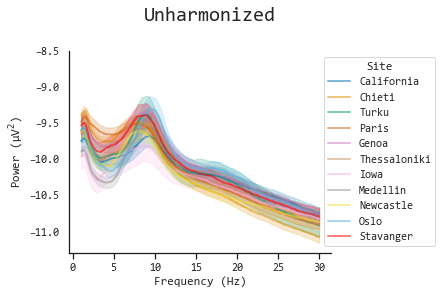

In [44]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

def plot_mean_power_by(df, fig_title= '', plot_variable = '', group_by = '', ylim = (-11.3, -8.5), legend_title = ''):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")
    sns.set(font="Consolas")
    sns.set_style(rc={'axes.facecolor': 'white'})

 
    # Get unique groups and assign colors from the sns palette
    group_categories = df[group_by].unique()
    palette = sns.color_palette(colorblind11_palette, len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df[group_by] == group]
        mean_group = group_df.groupby(['frequency'])[plot_variable].mean()
        std_group = group_df.groupby(['frequency'])[plot_variable].std()
        num_samples = group_df.groupby(['frequency'])[plot_variable].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.capitalize(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df[group_by].unique()
        for center in centers:
            center_mean = group_df[group_df[group_by] == center].groupby(['frequency'])[plot_variable].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.2)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(ylim)
    plt.grid(False)  # Turn off the grid

    plt.legend(loc='center right', bbox_to_anchor=(1.42, 0.5), ncol=1,frameon=True, title= legend_title)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines
    # Set the spines color and visibility
    ax = plt.gca()  # Get the current axes
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
    ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6)
    plt.suptitle(fig_title, size=20)
    plt.tight_layout(rect=[0, 0.3, 1, 0.99])  # Adjust the rect parameter as needed

    plt.show()


plot_mean_power_by(unharm_psd, fig_title= 'Unharmonized', plot_variable='psd', group_by='center', legend_title='Site')


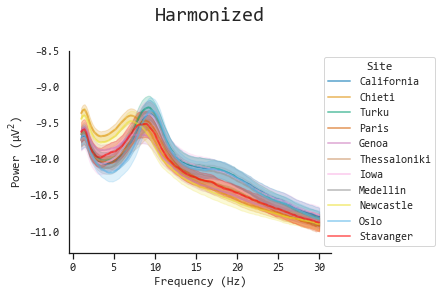

In [45]:
plot_mean_power_by(combat_psd, fig_title= 'Harmonized', plot_variable='psd', group_by='center', legend_title='Site')


# Statistical testing across batches

## Functional means by batch in unharmonized and harmonized data

In [ ]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from numpy.random import RandomState
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
#data = unharm_psd.copy()
data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique center
# s
centers = data['center'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each center
fd_list = []
for center in centers:
    center_data = pivoted_data.xs(center, level='center')
    fd_center = skfda.FDataGrid(
        data_matrix=center_data.values, 
        grid_points=center_data.columns.values
    ).mean()#.to_basis(BSplineBasis(n_basis=13, order = 13))
    fd_list.append(fd_center)
fd_means = skfda.concatenate(fd_list)

fd_means.plot(),

# means = [fd_knee1.mean(), fd_knee2.mean(), fd_knee3.mean()]
# fd_means = skfda.concatenate(means)
# fig = fd_means.plot()

In [ ]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from numpy.random import RandomState
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
data = unharm_psd.copy()
#data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique center
# s
centers = data['center'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each center
fd_list = []
for center in centers:
    center_data = pivoted_data.xs(center, level='center')
    fd_center = skfda.FDataGrid(
        data_matrix=center_data.values, 
        grid_points=center_data.columns.values
    ).mean()#.to_basis(BSplineBasis(n_basis=13, order = 13))
    fd_list.append(fd_center)
    
fd_means = skfda.concatenate(fd_list)

fd_means.plot(),

# means = [fd_knee1.mean(), fd_knee2.mean(), fd_knee3.mean()]
# fd_means = skfda.concatenate(means)
# fig = fd_means.plot()

## B-spline smoothing

In [ ]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
#data = unharm_psd.copy()
data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique centers
centers = data['participant_id'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')


center_data = pivoted_data.iloc[:,2:]
fd_center = skfda.FDataGrid(
    data_matrix=center_data.values, 
    grid_points=center_data.columns.values
)

fd_center.plot(),

# # Perform the functional one-way ANOVA
# v_n, p_val = oneway_anova(*fd_list)

# # Output the results
# print('Statistic: ', v_n)
# print('p-value: ', p_val)

# # Optionally, visualize the data
# for fd in fd_list:
#     fd.plot()
# plt.show()


In [ ]:
max_basis = 20


fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 30))

order = 1
for n_basis in range(1, max_basis + 1):
    basis = skfda.representation.basis.BSplineBasis(n_basis=n_basis, order=order)
    X_basis = fd_center.to_basis(basis)

    ax = axes.ravel()[n_basis - 1]
    fig = X_basis.plot(axes=ax)
    ax.set_title(f"{n_basis} basis functions")
    order = order + 1

plt.show()

## FDA - ANOVA by Batch

In [90]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
data = unharm_psd.copy()
#data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique centers
centers = data['center'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each center
fd_list = []
for center in centers:
    center_data = pivoted_data.xs(center, level='center')
    fd_center = skfda.FDataGrid(
        data_matrix=center_data.values, 
        grid_points=center_data.columns.values
    ).to_basis(BSplineBasis(n_basis=13, order = 4))
    fd_list.append(fd_center)

# Perform the functional one-way ANOVA
v_n_unharm, p_val, dist_unharm = oneway_anova(*fd_list, equal_var=False, random_state=42, return_dist=True)

# Output the results
print('Statistic: ', v_n_unharm)
print('p-value: ', p_val)

# # Optionally, visualize the data
# for fd in fd_list:
#     fd.plot()
# plt.show()


Statistic:  3791.961191658599
p-value:  0.0


In [91]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from numpy.random import RandomState
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
#data = unharm_psd.copy()
data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique center
# s
centers = data['center'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each center
fd_list = []
for center in centers:
    center_data = pivoted_data.xs(center, level='center')
    fd_center = skfda.FDataGrid(
        data_matrix=center_data.values, 
        grid_points=center_data.columns.values
    ).to_basis(BSplineBasis(n_basis=13, order = 4))
    fd_list.append(fd_center)

# Perform the functional one-way ANOVA
v_n_combat, p_val, dist_combat = oneway_anova(*fd_list, equal_var=False, random_state=42, return_dist=True)

# Output the results
print('Statistic: ', v_n_combat)
print('p-value: ', p_val)

# # Optionally, visualize the data
# for fd in fd_list:
#     fd.plot()
# plt.show()


Statistic:  2996.294890217191
p-value:  0.0


In [92]:
import numpy as np
from joblib import Parallel, delayed
import pandas as pd
from skfda.inference.anova import oneway_anova
from skfda.representation.basis import BSplineBasis
from skfda import FDataGrid

def paired_permutation_test_fast(
    combat_df: pd.DataFrame,
    unharm_df: pd.DataFrame,
    group_col: str = 'group',
    id_col: str = 'participant_id',
    grid_col: str = 'frequency',
    value_col: str = 'psd',
    n_perm: int = 1000,
    random_state: int = 42,
    n_jobs: int = -1,
    alternative: str = "two-sided",
    equal_var: bool = False,
    n_basis: int = 13,
    order: int = 4,
):
    """
    Paired permutation test comparing Vm stats from oneway_anova between
    two preprocessing pipelines (combat_df vs unharm_df) applied to the same subjects.

    Parameters
    ----------
    combat_df, unharm_df : long-form DataFrames with columns:
        [id_col, group_col, grid_col, value_col]
    alternative : {"two-sided", "greater", "less"}
        - "greater" tests Vm(combat) > Vm(unharm)
        - "less"    tests Vm(combat) < Vm(unharm)
        - "two-sided" tests |ΔVm| > 0
    equal_var : bool
        Passed to skfda.inference.anova.oneway_anova (homoscedastic vs heteroscedastic).
    n_basis, order : int
        B-spline basis parameters (defaults: 13, order 4).
    """

    # ----------------------------
    # 0) Setup & input checks
    # ----------------------------
    rng = np.random.default_rng(random_state)

    def pivot(df):
        df = df.copy()
        df[grid_col] = df[grid_col].astype(float)
        pvt = df.pivot(index=[id_col, group_col], columns=grid_col, values=value_col)
        return pvt.sort_index()

    pivot_combat = pivot(combat_df)
    pivot_unharm = pivot(unharm_df)

    if not np.array_equal(pivot_combat.index.values, pivot_unharm.index.values):
        raise ValueError("Participant mismatch between combat and unharm data after pivot/sort.")

    grid_points = pivot_combat.columns.values
    idx_multi = pivot_combat.index
    groups = idx_multi.get_level_values(group_col).values
    group_labels = pd.Index(idx_multi.get_level_values(group_col).unique())

    # Map each group to the row indices it occupies
    group_to_rows = {g: np.where(groups == g)[0] for g in group_labels}

    # Convert to numpy arrays for fast swapping
    combat_arr = pivot_combat.to_numpy(copy=True)  # shape [N_subjects, N_grid]
    unharm_arr = pivot_unharm.to_numpy(copy=True)

    # Basis (fixed per function call)
    basis = BSplineBasis(n_basis=n_basis, order=order)

    # ----------------------------
    # Helper: compute Vm given whole matrix by groups
    # ----------------------------
    def compute_vm_from_matrix(mat, seed=None):
        """Build FD lists groupwise from `mat` and run oneway_anova."""
        fd_list = []
        for g in group_labels:
            rows = group_to_rows[g]
            fd = FDataGrid(data_matrix=mat[rows], grid_points=grid_points).to_basis(basis)
            fd_list.append(fd)
        # random_state only affects the internal Monte Carlo for null dist; not needed for stat itself
        vm_stat, *_ = oneway_anova(*fd_list, equal_var=equal_var, random_state=seed)
        return vm_stat

    # ----------------------------
    # 1) Observed difference
    # ----------------------------
    v_combat = compute_vm_from_matrix(combat_arr, seed=random_state)
    v_unharm = compute_vm_from_matrix(unharm_arr, seed=random_state)
    v_diff_obs = v_combat - v_unharm

    # ----------------------------
    # 2) Permutations (paired swaps)
    # ----------------------------
    def permute_and_diff(seed):
        rng_local = np.random.default_rng(seed)
        swap_mask = rng_local.integers(0, 2, size=combat_arr.shape[0]).astype(bool)

        # swap rows between combat/unharm according to mask
        perm_c = combat_arr.copy()
        perm_u = unharm_arr.copy()

        if swap_mask.any():
            tmp = perm_c[swap_mask].copy()
            perm_c[swap_mask] = perm_u[swap_mask]
            perm_u[swap_mask] = tmp

        v_c = compute_vm_from_matrix(perm_c)  # no need to set seed here for the stat
        v_u = compute_vm_from_matrix(perm_u)
        return v_c - v_u

    seeds = rng.integers(0, 2**32 - 1, size=n_perm)
    diffs = Parallel(n_jobs=n_jobs, backend="loky")(
        delayed(permute_and_diff)(int(s)) for s in seeds
    )
    diffs = np.asarray(diffs)

    # ----------------------------
    # 3) P-value (with +1 correction)
    # ----------------------------
    obs = v_diff_obs
    if alternative == "greater":
        p_val = (np.sum(diffs >= obs) + 1) / (n_perm + 1)
    elif alternative == "less":
        p_val = (np.sum(diffs <= obs) + 1) / (n_perm + 1)
    elif alternative == "two-sided":
        p_val = (np.sum(np.abs(diffs) >= abs(obs)) + 1) / (n_perm + 1)
    else:
        raise ValueError("alternative must be 'greater', 'less', or 'two-sided'.")

    return {
        "v_combat": float(v_combat),
        "v_unharm": float(v_unharm),
        "v_diff": float(v_diff_obs),
        "null_distribution": diffs,   # array of permuted differences
        "p_value": float(p_val),
        "alternative": alternative,
        "n_perm": int(n_perm),
        "equal_var": bool(equal_var),
        "basis": {"n_basis": int(n_basis), "order": int(order)},
    }


In [94]:
res_center = paired_permutation_test_fast(
    combat_df=combat_psd,         # harmonized
    unharm_df=unharm_psd,         # unharmonized
    group_col="center",           # compare centers instead of diagnosis group
    id_col="participant_id",
    grid_col="frequency",
    value_col="psd",
    n_perm=1000,
    random_state=42,
    n_jobs=15,
    alternative="two-sided",
    equal_var=False,              # or True if assuming same variance
    n_basis=13,
    order=4)

In [95]:
print(f"Vn (reComBat):     {res_center['v_combat']:.3f}")
print(f"Vn (unharmonized): {res_center['v_unharm']:.3f}")
print(f"Difference:        {res_center['v_diff']:.3f}")
print(f"P-value:           {res_center['p_value']:.4f}")

Vn (reComBat):     2996.295
Vn (unharmonized): 3791.961
Difference:        -795.666
P-value:           0.0010


In [98]:
import pickle

with open("D:/papers_alberto/edlb_combat_psd/data/delta_fda_center.pkl", "wb") as f:
    pickle.dump(res_center, f)

In [ ]:
# LOAD PICKLE
with open(r"D:\papers_alberto\edlb_combat_psd\data\delta_fda_center.pkl", "rb") as f:
    res_center = pickle.load(f)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming res is the dictionary from the permutation test
delta_vms = res_center["null_distribution"]
obs_diff = res_center["v_diff"]

fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={'width_ratios': [2, 1]}, sharey=True)
sns.set(font="Consolas")

# ------------------
# Panel A: dist_combat / dist_unharm
# ------------------
ax = axes[0]
ax.hist(dist_combat, bins=50, alpha=0.3, label='Harm. H$_0$', color='blue', density=True)
ax.axvline(x=v_n_combat, color='blue', linestyle='--', linewidth=1, label='Harm. H$_1$')
ax.annotate(f'V$_n$ = {v_n_combat:.1f}', xy=(v_n_combat-1100, 0.002),
            xytext=(v_n_combat-1100, 0.002), ha='center', color='blue', size=16)

ax.hist(dist_unharm, bins=50, alpha=0.3, label='Unharm. H$_0$', color='red', density=True)
ax.axvline(x=v_n_unharm, color='red', linestyle='--', linewidth=1, label='Unharm. H$_1$')
ax.annotate(f'V$_n$ = {v_n_unharm:.1f}', xy=(v_n_unharm+2300, 0.002),
            xytext=(v_n_unharm+2300, 0.002), ha='center', color='red', size=16)

ax.set_xscale('log')
ax.set_xlim(-10000, 10000)
ax.set_xlabel('V$_n$ Value', size=16)
ax.set_ylabel('Density', size=16)
ax.set_title('Functional Data ANOVA - Cross-site Differences', size=16)
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), facecolor='white', fontsize=16, ncol=4)
ax.spines['bottom'].set_color('k')
ax.spines['left'].set_color('k')
ax.set_facecolor('white')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
# ------------------
# Panel B: permutation ΔVm null distribution
# ------------------
ax2 = axes[1]
ax2.hist(delta_vms, bins=50, alpha=0.3, color='gray', density=True, label="Permutation H$_0$")
ax2.axvline(x=obs_diff, color='black', linestyle='--', linewidth=1, label='Observed ΔVm')
ax2.annotate(f'ΔV$_n$ = {obs_diff:.1f}', xy=(obs_diff+300, 0.002),
             xytext=(obs_diff+300, 0.002), ha='center', color='black', size=16)

ax2.set_xlabel('ΔV$_n$ (Harmonized - Unharmonized)', size=16)
ax2.set_ylabel('Density', size=16)
ax2.set_title('Change in Cross-site Differences', size=16)
ax2.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), facecolor='white', fontsize=16, ncol=2)
ax2.spines['bottom'].set_color('k')
ax2.spines['left'].set_color('k')
ax2.set_facecolor('white')
ax2.tick_params(axis='x', labelsize=14)
ax2.tick_params(axis='y', labelsize=14)


plt.tight_layout()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_4a'
plt.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()


In [108]:
v_n_unharm/v_n_combat

1.2655500645277717

## mass univariate cluster-level permutation test by batch

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f
from statsmodels.stats.multitest import multipletests
import numpy as np
from mne.stats import permutation_cluster_test
from scipy import stats
import pandas as pd


def prepare_data(psd_data):
    # Prepare the data for functional analysis by pivoting
    pivoted_data = psd_data.pivot(index=['participant_id', 'center'], columns='frequency', values='psd')
    centers = np.unique(pivoted_data.index.get_level_values('center'))

    # Prepare data arrays for each center
    center_data_arrays = {}
    for center in centers:
        # Extract the center's PSD data
        center_data = pivoted_data.xs(center, level='center').values
        n_subjects = center_data.shape[0]
        n_frequency_bins = center_data.shape[1]
        
        # Reshape data to fit MNE's expected shape: (n_subjects, n_frequency_bins, n_channels)
        # Assuming there is only one channel, the reshaping should order the frequencies correctly
        center_data_arrays[center] = center_data.reshape(n_subjects, n_frequency_bins, 1)  # This is important to use a regular lattice adjacency, connecting neighbors along the freqs dimension

    # Create a list of data arrays for each center
    data_arrays_list = [center_data_arrays[center] for center in centers]
    return data_arrays_list, n_frequency_bins


# Run permutation test
def run_permutation_test(data_arrays_list):
    n_conditions = len(data_arrays_list)
    n_observations = sum(len(center_data) for center_data in data_arrays_list)
    
    alpha = 0.05  # arbitrary
    dfn = n_conditions - 1  # degrees of freedom numerator
    dfd = n_observations - n_conditions  # degrees of freedom denominator
    thresh = f.ppf(1 - alpha, dfn=dfn, dfd=dfd)  # F distribution
    return permutation_cluster_test(
        data_arrays_list,
        n_permutations=2000,
        threshold=thresh,
        tail=0,
        n_jobs=1,
        out_type='mask',
        adjacency=None, seed=42
    )

# Assume unharm_psd and combat_psd are your dataframes ready to be processed
unharm_data_arrays, n_frequency_bins = prepare_data(unharm_psd)
combat_data_arrays, _ = prepare_data(combat_psd)

# Running the permutation tests
T_obs_unharm, clusters_unharm, cluster_p_values_unharm, H0_unharm = run_permutation_test(unharm_data_arrays)
T_obs_combat, clusters_combat, cluster_p_values_combat, H0_combat = run_permutation_test(combat_data_arrays)

# Visualization and further analysis
times = np.linspace(1, 30, n_frequency_bins)  # Assuming frequency bins are uniform across datasets

# Define subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), sharey=True)

# Function to plot results



def plot_results(ax, T_obs, clusters, cluster_p_values, title, line_color, alpha = 0.05):
    T_obs = np.squeeze(T_obs)
    ax.plot(times, T_obs, color=line_color)  # Plot the observed statistics
    ax.set_xlabel('Frequency (Hz)', size = 16)
    ax.set_ylabel('F-value', size = 16)
    ax.set_title(title, size = 16)
    ax.spines['bottom'].set_color('k')
    ax.spines['left'].set_color('k')
    ax.set_xlim(1, 30)
    ax.set_ylim(0, 30)
    ax.set_facecolor('white')
    ax.set_xticks(np.arange(1, 31, 2))  # Set ticks to show every 2 units on the x-axis
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Define frequency bands
    bands = {'δ': (1, 4), 'θ': (4, 8), 'α': (8, 13), 'β': (13, 30)}
    for band, (start, end) in bands.items():
        ax.axvline(x=start, color='grey', linestyle='--', alpha=0.5)  # Start line of each band
        if band != 'β':  # Beta ends at the edge of the plot
            ax.axvline(x=end, color='grey', linestyle='--', alpha=0.5)  # End line of each band
        # Place text in the middle of the band
        ax.text((start + end) / 2, 30 * 0.95, band, horizontalalignment='center', verticalalignment='top', fontsize=16, color='black')

    # Highlight significant clusters and apply legend to this
    cluster_handle = None
    for i_c, mask in enumerate(clusters):
        if cluster_p_values[i_c] < alpha:
            contiguous_regions = np.where(np.diff(np.concatenate(([False], mask.squeeze(), [False]))))[0].reshape(-1, 2)
            for start, stop in contiguous_regions:
                cluster_handle = ax.axvspan(times[start], times[stop - 1], color='green', alpha=0.3, label='Cluster p < 0.05')

    # Only add the legend if there is at least one significant cluster
    if cluster_handle:
        ax.legend(handles=[cluster_handle], loc='center right', fontsize = 16, facecolor= 'white')


# Plot results for Unharm PSD
plot_results(ax1, T_obs_unharm, clusters_unharm, cluster_p_values_unharm, 'Unharm. Power spectrum', 'red')

# Plot results for Combat PSD
plot_results(ax2, T_obs_combat, clusters_combat, cluster_p_values_combat, 'Harm. Power spectrum', 'blue')
# To show only the bottom and left spines
plt.suptitle('Cluster-level Permutation test - Cross-site Differences', size = 16)

plt.tight_layout()


# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_4b'
plt.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


plt.show()

# Figure 4

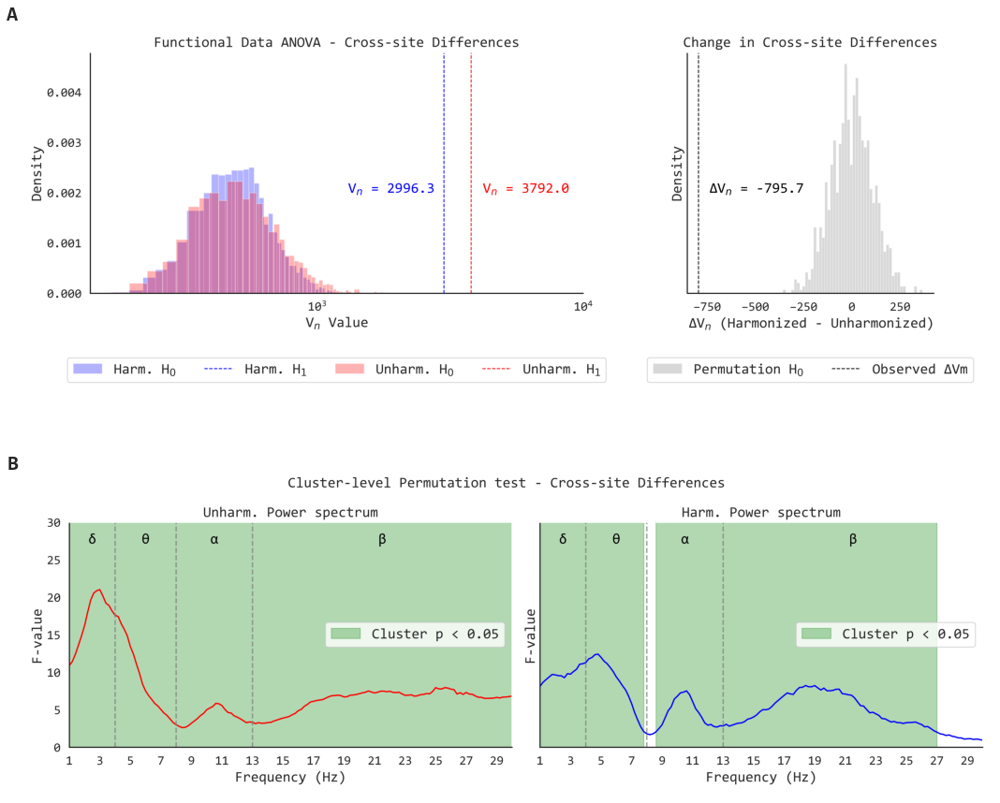

In [134]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_4a.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_4b.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(2, 1, figsize=(15, 13))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.001, 1.05, annotations[i], transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots
plt.subplots_adjust(hspace=0.0001)

plt.tight_layout()

plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_4'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


## FDA - ANOVA by Group

In [135]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from numpy.random import RandomState
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
#data = unharm_psd.copy()
data = combat_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique group
# s
groups = data['group'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'group'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each group
fd_list = []
for group in groups:
    group_data = pivoted_data.xs(group, level='group')
    fd_group = skfda.FDataGrid(
        data_matrix=group_data.values, 
        grid_points=group_data.columns.values
    ).to_basis(BSplineBasis(n_basis=13, order = 4))
    fd_list.append(fd_group)

# Perform the functional one-way ANOVA
v_n_combat, p_val, dist_combat = oneway_anova(*fd_list, equal_var=False, random_state=42, return_dist=True)

# Output the results
print('Statistic: ', v_n_combat)
print('p-value: ', p_val)

# # Optionally, visualize the data
# for fd in fd_list:
#     fd.plot()
# plt.show()

Statistic:  2821.0694431902834
p-value:  0.0


In [136]:
import pandas as pd
import skfda
from skfda.inference.anova import oneway_anova
from numpy.random import RandomState
from skfda.representation.basis import BSplineBasis
import matplotlib.pyplot as plt

# Assuming the dataset has been loaded into a DataFrame
#data = unharm_psd.copy()
data = unharm_psd.copy()

# Ensure 'frequency' is treated as numerical
data['frequency'] = data['frequency'].astype(float)

# Extract unique group
# s
groups = data['group'].unique()

# Prepare the data for functional analysis by pivoting
pivoted_data = data.pivot(index=['participant_id', 'group'], columns='frequency', values='psd')

# Create a functional data object (FDataGrid) for each group
fd_list = []
for group in groups:
    group_data = pivoted_data.xs(group, level='group')
    fd_group = skfda.FDataGrid(
        data_matrix=group_data.values, 
        grid_points=group_data.columns.values
    ).to_basis(BSplineBasis(n_basis=13, order = 4))
    fd_list.append(fd_group)

# Perform the functional one-way ANOVA
v_n_unharm, p_val, dist_unharm = oneway_anova(*fd_list, equal_var=False, random_state=42, return_dist=True)

# Output the results
print('Statistic: ', v_n_unharm)
print('p-value: ', p_val)

# # Optionally, visualize the data
# for fd in fd_list:
#     fd.plot()
# plt.show()


Statistic:  1965.5333029330207
p-value:  0.0


In [141]:
res_diag = paired_permutation_test_fast(
    combat_df=combat_psd,         # harmonized
    unharm_df=unharm_psd,         # unharmonized
    group_col="group",           # compare diagnosis group
    id_col="participant_id",
    grid_col="frequency",
    value_col="psd",
    n_perm=1000,
    random_state=42,
    n_jobs=15,
    alternative="two-sided",
    equal_var=False,              # or True if assuming same variance
    n_basis=13,
    order=4)

In [142]:
print(f"Vn (reComBat):     {res_diag['v_combat']:.3f}")
print(f"Vn (unharmonized): {res_diag['v_unharm']:.3f}")
print(f"Difference:        {res_diag['v_diff']:.3f}")
print(f"P-value:           {res_diag['p_value']:.4f}")

Vn (reComBat):     2821.069
Vn (unharmonized): 1965.533
Difference:        855.536
P-value:           0.0010


In [143]:
import pickle

with open("D:/papers_alberto/edlb_combat_psd/data/delta_fda_diagnosis.pkl", "wb") as f:
    pickle.dump(res_diag, f)

In [144]:
# LOAD PICKLE
with open(r"D:\papers_alberto\edlb_combat_psd\data\delta_fda_diagnosis.pkl", "rb") as f:
    res_diag = pickle.load(f)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming res is the dictionary from the permutation test
delta_vms = res_diag["null_distribution"]
obs_diff = res_diag["v_diff"]

fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={'width_ratios': [2, 1]}, sharey=True)
sns.set(font="Consolas")

# ------------------
# Panel A: dist_combat / dist_unharm
# ------------------
ax = axes[0]
ax.hist(dist_combat, bins=50, alpha=0.3, label='Harm. H$_0$', color='blue', density=True)
ax.axvline(x=v_n_combat, color='blue', linestyle='--', linewidth=1, label='Harm. H$_1$')
ax.annotate(f'V$_n$ = {v_n_combat:.1f}', xy=(v_n_combat+2000, 0.002),
            xytext=(v_n_combat+2000, 0.002), ha='center', color='blue', size=16)

ax.hist(dist_unharm, bins=50, alpha=0.3, label='Unharm. H$_0$', color='red', density=True)
ax.axvline(x=v_n_unharm, color='red', linestyle='--', linewidth=1, label='Unharm. H$_1$')
ax.annotate(f'V$_n$ = {v_n_unharm:.1f}', xy=(v_n_unharm-800, 0.002),
            xytext=(v_n_unharm-800, 0.002), ha='center', color='red', size=16)

ax.set_xscale('log')
ax.set_xlim(-10000, 10000)
ax.set_xlabel('V$_n$ Value', size=16)
ax.set_ylabel('Density', size=16)
ax.set_title('Functional Data ANOVA - Cross-diagnosis Differences', size=16)
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), facecolor='white', fontsize=16, ncol=4)
ax.spines['bottom'].set_color('k')
ax.spines['left'].set_color('k')
ax.set_facecolor('white')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
# ------------------
# Panel B: permutation ΔVm null distribution
# ------------------
ax2 = axes[1]
ax2.hist(delta_vms, bins=50, alpha=0.3, color='gray', density=True, label="Permutation H$_0$")
ax2.axvline(x=obs_diff, color='black', linestyle='--', linewidth=1, label='Observed ΔVm')
ax2.annotate(f'ΔV$_n$ = {obs_diff:.1f}', xy=(obs_diff-250, 0.002),
             xytext=(obs_diff-250, 0.002), ha='center', color='black', size=16)

ax2.set_xlabel('ΔV$_n$ (Harmonized - Unharmonized)', size=16)
ax2.set_ylabel('Density', size=16)
ax2.set_title('Change in Cross-diagnosis Differences', size=16)
ax2.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), facecolor='white', fontsize=16, ncol=2)
ax2.spines['bottom'].set_color('k')
ax2.spines['left'].set_color('k')
ax2.set_facecolor('white')
ax2.tick_params(axis='x', labelsize=14)
ax2.tick_params(axis='y', labelsize=14)


plt.tight_layout()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_5a'
plt.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()


In [157]:
v_n_combat/v_n_unharm

1.435269216237959

## Mass univariate cluster-level permutation test by Group

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f
from statsmodels.stats.multitest import multipletests
import numpy as np
from mne.stats import permutation_cluster_test
from scipy import stats
import pandas as pd


def prepare_data(psd_data):
    # Prepare the data for functional analysis by pivoting
    pivoted_data = psd_data.pivot(index=['participant_id', 'group'], columns='frequency', values='psd')
    centers = np.unique(pivoted_data.index.get_level_values('group'))

    # Prepare data arrays for each center
    center_data_arrays = {}
    for center in centers:
        # Extract the center's PSD data
        center_data = pivoted_data.xs(center, level='group').values
        n_subjects = center_data.shape[0]
        n_frequency_bins = center_data.shape[1]
        
        # Reshape data to fit MNE's expected shape: (n_subjects, n_frequency_bins, n_channels)
        # Assuming there is only one channel, the reshaping should order the frequencies correctly
        center_data_arrays[center] = center_data.reshape(n_subjects, n_frequency_bins, 1)  # This is important to use a regular lattice adjacency, connecting neighbors along the freqs dimension

    # Create a list of data arrays for each center
    data_arrays_list = [center_data_arrays[center] for center in centers]
    return data_arrays_list, n_frequency_bins


# Run permutation test
def run_permutation_test(data_arrays_list):
    n_conditions = len(data_arrays_list)
    n_observations = sum(len(center_data) for center_data in data_arrays_list)
    
    alpha = 0.05  # arbitrary
    dfn = n_conditions - 1  # degrees of freedom numerator
    dfd = n_observations - n_conditions  # degrees of freedom denominator
    thresh = f.ppf(1 - alpha, dfn=dfn, dfd=dfd)  # F distribution
    return permutation_cluster_test(
        data_arrays_list,
        n_permutations=2000,
        threshold=thresh,
        tail=0,
        n_jobs=1,
        out_type='mask',
        adjacency=None, seed=42
    )

# Assume unharm_psd and combat_psd are your dataframes ready to be processed
unharm_data_arrays, n_frequency_bins = prepare_data(unharm_psd)
combat_data_arrays, _ = prepare_data(combat_psd)

# Running the permutation tests
T_obs_unharm, clusters_unharm, cluster_p_values_unharm, H0_unharm = run_permutation_test(unharm_data_arrays)
T_obs_combat, clusters_combat, cluster_p_values_combat, H0_combat = run_permutation_test(combat_data_arrays)

# Visualization and further analysis
times = np.linspace(1, 30, n_frequency_bins)  # Assuming frequency bins are uniform across datasets

# Define subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), sharey=True)

# Function to plot results



def plot_results(ax, T_obs, clusters, cluster_p_values, title, line_color, alpha = 0.05):
    T_obs = np.squeeze(T_obs)
    ax.plot(times, T_obs, color=line_color)  # Plot the observed statistics
    ax.set_xlabel('Frequency (Hz)', size = 16)
    ax.set_ylabel('F-value', size = 16)
    ax.set_title(title, size = 16)
    ax.spines['bottom'].set_color('k')
    ax.spines['left'].set_color('k')
    ax.set_xlim(1, 30)
    ax.set_ylim(0, 50)
    ax.set_facecolor('white')
    ax.set_xticks(np.arange(1, 31, 2))  # Set ticks to show every 2 units on the x-axis
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Define frequency bands
    bands = {'δ': (1, 4), 'θ': (4, 8), 'α': (8, 13), 'β': (13, 30)}
    for band, (start, end) in bands.items():
        ax.axvline(x=start, color='grey', linestyle='--', alpha=0.5)  # Start line of each band
        if band != 'β':  # Beta ends at the edge of the plot
            ax.axvline(x=end, color='grey', linestyle='--', alpha=0.5)  # End line of each band
        # Place text in the middle of the band
        ax.text((start + end) / 2, 50 * 0.95, band, horizontalalignment='center', verticalalignment='top', fontsize=16, color='black')

    # Highlight significant clusters and apply legend to this
    cluster_handle = None
    for i_c, mask in enumerate(clusters):
        if cluster_p_values[i_c] < alpha:
            contiguous_regions = np.where(np.diff(np.concatenate(([False], mask.squeeze(), [False]))))[0].reshape(-1, 2)
            for start, stop in contiguous_regions:
                cluster_handle = ax.axvspan(times[start], times[stop - 1], color='green', alpha=0.3, label='Cluster p < 0.05')

    # Only add the legend if there is at least one significant cluster
    if cluster_handle:
        ax.legend(handles=[cluster_handle], loc='center right', fontsize = 16, facecolor= 'white')


# Plot results for Unharm PSD
plot_results(ax1, T_obs_unharm, clusters_unharm, cluster_p_values_unharm, 'Unharm. Power spectrum', 'red')

# Plot results for Combat PSD
plot_results(ax2, T_obs_combat, clusters_combat, cluster_p_values_combat, 'Harm. Power spectrum', 'blue')
# To show only the bottom and left spines
plt.suptitle('Cluster-level Permutation test - Cross-diagnosis Differences', size = 16)

plt.tight_layout()


# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_5b'
plt.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
plt.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


plt.show()

# Figure 5

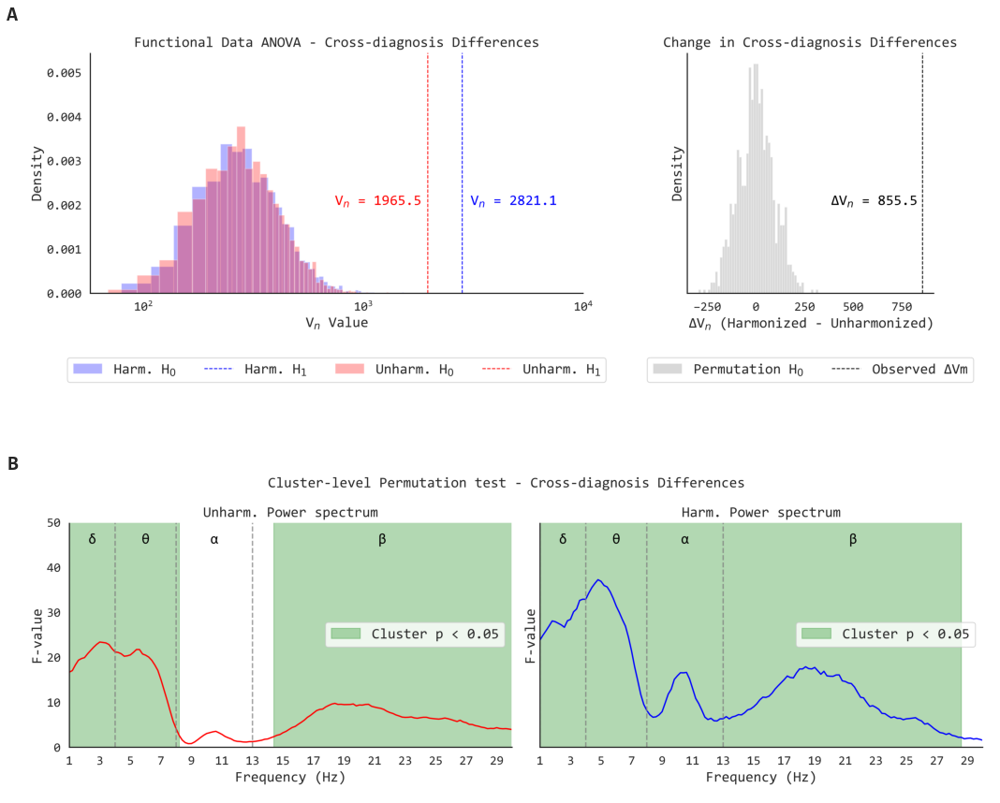

In [160]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_5a.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_5b.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(2, 1, figsize=(15, 13))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.001, 1.05, annotations[i], transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots
plt.subplots_adjust(hspace=0.0001)

plt.tight_layout()

plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_5'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


# Figure Spectral Parameterization with Knee parameter


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



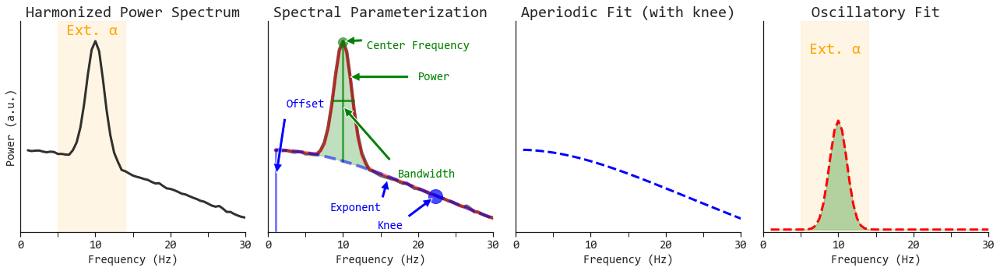

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from fooof import FOOOF, FOOOFGroup
from fooof.plts.spectra import plot_spectra
from fooof.plts.annotate import plot_annotated_model
from fooof.plts.aperiodic import plot_aperiodic_params
from fooof.sim.params import Stepper, param_iter
from fooof.sim import gen_power_spectrum, gen_group_power_spectra
from fooof.utils.params import compute_time_constant, compute_knee_frequency


sns.set_style("white")
plt.rcParams["font.family"] = "Consolas"


# Simulate an example power spectrum
# Initialize model object and fit power spectrum
fm = FOOOF(min_peak_height=0.6, aperiodic_mode='knee')
# Parameters for healthy subjects
freq_range = [1, 31]

periodic_params_healthy = [10, 0.8, 1.2]
aperiodic_params_healthy = [2, 500, 2]

freqs_healthy, powers_healthy = gen_power_spectrum(freq_range, aperiodic_params_healthy, periodic_params_healthy)
periodic_params_healthy = [0, 0, 0]
freqs_healthy, ap_powers_healthy = gen_power_spectrum(freq_range, aperiodic_params_healthy, periodic_params_healthy)


fm.fit(freqs_healthy, powers_healthy)



fig, axs = plt.subplots(figsize=(18, 5), ncols=4)
# Get FOOOF fitting vectors

osc_fit = fm._peak_fit 
psd_fit = fm.fooofed_spectrum_
ap_fit = fm._ap_fit

# Get FOOOF reconstructed oscillatory and aperiodic power vectors
spect_flat = fm._spectrum_flat
aperiodic = fm._spectrum_peak_rm

# Plot 1 - Original Power
axs[0].plot(freqs_healthy, np.log10(powers_healthy), label='Signal', linewidth=3, color='k', alpha=0.9)
#axs[0].plot(freqs_healthy, psd_fit, color='red', linestyle='dashed', linewidth=2, label='Fit')
axs[0].set_title('Harmonized Power Spectrum', fontsize = 20)
axs[0].set_xlabel('Frequency (Hz)', fontsize=15)  # Adjust fontsize here
axs[0].set_ylabel('Power (a.u.)', fontsize=15)  # Adjust fontsize here
axs[0].legend(loc='upper right', fontsize=15)  # Adjust fontsize here
axs[0].set_ylim(-1.24,0.15)
axs[0].set_xlim(0.5,30)
axs[0].grid(False)  # Hide grid
#axes[0].set_facecolor('white') 


# Plot annotated model of aperiodic parameters
plot_annotated_model(fm, annotate_peaks=True, annotate_aperiodic=True, ax=axs[1], plt_log=False)
# Remove legend from the last subplot
axs[1].legend([])
axs[1].set_ylabel(' ', fontsize=13)  # Adjust fontsize here
axs[1].set_xlabel('Frequency (Hz)', fontsize=15)  # Adjust fontsize here
axs[1].set_title('Spectral Parameterization', fontsize = 20)
axs[1].grid(False)  # Hide grid
axs[1].set_xlim(0.5,30)
axs[1].set_ylim(-1.24,0.15)

#axes[1].set_facecolor('white') 


# Adjust fontsize and position for text annotations in axs[3]
for text_obj in axs[1].texts:
    text_obj.set_fontsize(15)
    if text_obj.get_text() == 'Offset':
        text_obj.set_position((5, text_obj.get_position()[1]+0.5))  # Adjust position here
    if text_obj.get_text() == 'Center Frequency':
        text_obj.set_position((20, text_obj.get_position()[1]-0.5))  # Adjust position here   
    if text_obj.get_text() == 'Bandwidth':
        text_obj.set_position((25, text_obj.get_position()[1]+0.3))  # Adjust position here  
    if text_obj.get_text() == 'Power':
        text_obj.set_position((20, text_obj.get_position()[1]))  # Adjust position here  



# Plot 2 - Aperiodic Power 
#axs[2].plot(freqs_healthy, aperiodic, label='Signal', linewidth=3, color='k', alpha=0.9)
axs[2].plot(freqs_healthy, ap_fit, color='blue', linestyle='--', linewidth=3, label='Fit')
axs[2].set_title('Aperiodic Fit (with knee)', fontsize = 20)
axs[2].set_xlabel('Frequency (Hz)', fontsize=15)  # Adjust fontsize here
axs[2].legend(loc='upper right', fontsize=15)  # Adjust fontsize here
axs[2].set_xlim(0.5,30)
axs[2].set_ylim(-1.24,0.15)
axs[2].grid(False)  # Hide grid
#axes[2].set_facecolor('white') 

# Plot 3 - Oscillatory Power 
#axs[3].plot(freqs_healthy, spect_flat, label='Signal', linewidth=3, color='k', alpha=0.9)
axs[3].plot(freqs_healthy, osc_fit, color='red', linestyle='dashed', linewidth=3, label='Fit')
axs[3].set_title('Oscillatory Fit', fontsize = 20)
axs[3].set_xlabel('Frequency (Hz)', fontsize=15)  # Adjust fontsize here
#axs[3].set_ylabel('Power (μV$^2$)', fontsize=18)  # Adjust fontsize here
axs[3].legend(loc='upper right', fontsize=15)  # Adjust fontsize here
axs[3].set_ylim(-0.02,1.5)
axs[3].set_xlim(0.5,30)
axs[3].grid(False)  # Hide grid
#axes[3].set_facecolor('white') 


# Reduce tick label size for all subplots
for ax in axs.flat:
    ax.tick_params(axis='both', labelsize=15)  # Adjust fontsize here

# Apply tight layout
for ax in axs:
    ax.legend().remove()


# Define the frequency range boundaries
freq_ranges = [5, 14]
freq_labels = ['Ext. \u03B1']

colors = ['orange', 'red']  # Replace these with your specific color palette if available





def add_frequency_bands(ax, freq_ranges, freq_labels, colors):
    ymin, ymax = ax.get_ylim()
    for i in range(len(freq_ranges) - 1):
        # Shade full current y-range
        ax.fill_betweenx([ymin, ymax], freq_ranges[i], freq_ranges[i+1], color=colors[i], alpha=0.1)
        # Label at 90% of upper y-limit
        label_x = (freq_ranges[i] + freq_ranges[i+1]) / 2
        label_y = ymax * 0.9
        ax.text(label_x, label_y, freq_labels[i], color=colors[i], ha='center', va='top', fontsize=20)

# Apply the frequency bands to the first subplot
add_frequency_bands(axs[0], freq_ranges, freq_labels, colors)

# Apply the frequency bands to the last subplot
add_frequency_bands(axs[3], freq_ranges, freq_labels, colors)
axs[3].fill_between(freqs_healthy, 0, osc_fit, color='green', alpha=0.3, interpolate=True)


# Loop through all subplots and hide y-axis tick numbers
for ax in axs:
    ax.tick_params(axis='y', labelleft=False)  # Disable y-axis tick labels
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
# Generate the rest of your plots as usual
plt.tight_layout()

axs[0].set_xticks([0, 10, 20, 30])  # Only display 0, 10, 20, 30 on the x-axis
axs[0].xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
axs[0].tick_params(direction="out", which='both', left=False, bottom=True, color='k', length=6)
axs[1].set_xticks([0, 10, 20, 30])  # Only display 0, 10, 20, 30 on the x-axis
axs[1].xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
axs[1].tick_params(direction="out", which='both', left=False, bottom=True, color='k', length=6)
axs[2].set_xticks([0, 10, 20, 30])  # Only display 0, 10, 20, 30 on the x-axis
axs[2].xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
axs[2].tick_params(direction="out", which='both', left=False, bottom=True, color='k', length=6)
axs[3].set_xticks([0, 10, 20, 30])  # Only display 0, 10, 20, 30 on the x-axis
axs[3].xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
axs[3].tick_params(direction="out", which='both', left=False, bottom=True, color='k', length=6)



fig.subplots_adjust(wspace=0.1)

plt.show()

# FOOOF on harmonized psd

In [342]:
import pandas as pd
import numpy as np
from fooof import FOOOF
from fooof.bands import Bands
from fooof.analysis import get_band_peak_fm, compute_pointwise_error_fm

# Initialize lists to store the data
features_list = []
fooof_params_list = []

# Define frequency range and bands
freqs = np.unique(combat_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)  # Boolean mask for desired frequency range
freqs = freqs[freq_mask]  # Reindex freqs to keep only 3-30 Hz

freq_range = [3, 30]
bands = Bands({'extalpha': [5, 14], 'beta': [13, 30]})

# Iterate over each row in the pivoted DataFrame
for idx, row in all_combat.iterrows():
    participant_id = row['participant_id']
    center = row['center']
    group = row['group']
    age = row['age']
    gender = row['gender']
    
    # Retrieve PSD and frequency values
    psd_log10 = row[5:].values  # Assuming PSD values start from the 6th column
    psd_log10 = psd_log10[freq_mask]  # Apply mask to psds 
    # Convert log10 scaled PSD back to linear space for FOOOF
    psd_linear = np.power(10, psd_log10)
    psd_linear = psd_linear  # Apply mask to psds 


    # Check and handle any NaNs or Infs in the linear PSD data
    #psd_linear = np.nan_to_num(psd_linear, nan=1e-10, posinf=1e-10, neginf=1e-10)

    # Initialize and fit the FOOOF model
    fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6, aperiodic_mode = 'knee')
    fm.fit(freqs, psd_linear, freq_range)


    psd_fit = fm.fooofed_spectrum_
    ap_fit = fm._ap_fit
    spect_flat = fm._spectrum_flat
    aperiodic = fm._spectrum_peak_rm

    if psd_fit is not None:
        errs_fm = compute_pointwise_error_fm(fm, plot_errors=False, return_errors=True)

        for i, freq in enumerate(freqs):  # Iterate over reindexed freqs
            features_dict = {
                'participant_id': participant_id,
                'center': center,
                'group': group,
                'age': age,
                'gender': gender,
                'frequency': freq,
                'psd': np.log10(psd_linear[i]),
                'psd_fit': psd_fit[i],
                'osc': spect_flat[i],
                'osc_fit': fm._peak_fit[i],
                'ap': aperiodic[i],
                'ap_fit': ap_fit[i],
                'error_fm': errs_fm[i]  # <- ADDING pointwise error here
            }
            features_list.append(features_dict)
        
        # Extract specific parameters
        betas = get_band_peak_fm(fm, bands.beta)
        extalphas = get_band_peak_fm(fm, bands.extalpha)
        aperiodic_params = fm.get_params('aperiodic_params')
        fit_params = [fm.get_params('r_squared'), fm.get_params('error')]

        fooof_params_dict = {
            'participant_id': participant_id,
            'center': center,
            'group': group,
            'age': age,
            'gender': gender,
            'beta_cf': betas[0],
            'beta_pw': betas[1],
            'beta_bw': betas[2],
            'extalphas_cf': extalphas[0],
            'extalphas_pw': extalphas[1],
            'extalphas_bw': extalphas[2],
            'exponent': aperiodic_params[2],
            'offset': aperiodic_params[0],
            'r_squared': fit_params[0],
            'error': fit_params[1]}
        fooof_params_list.append(fooof_params_dict)

# Create DataFrames from the lists
features_df = pd.DataFrame(features_list)
fooof_params_df = pd.DataFrame(fooof_params_list)

# PLOT FOOOF ERROR AND R-SQUARED

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style('white')
sns.set(font="Consolas")

# Color palette from your existing code
colorblind_palette = sns.color_palette("colorblind")
colorblind11_palette = colorblind_palette + [(1.0, 0.0, 0.0)] + [(1.0, 0.0, 0.0)]  # Add reds for > 10 centers
palette = colorblind11_palette

# Create frequency-wise error DataFrame from features_df
errors_df = features_df[['participant_id', 'center', 'frequency', 'error_fm']].copy()

# Start figure with 3 subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))

### === Subplot 1: Violin plot for "error" === ###
ax1 = axes[0]
sns.violinplot(x="center", y="error", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax1)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="error", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)
sns.stripplot(x="center", y="error", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.25, size=2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
ax1.set_title("FOOOF Error")
ax1.set_xlabel("")
ax1.set_ylabel("Error")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.grid(False)
ax1.set_facecolor('white')
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

### === Subplot 2: Violin plot for "r_squared" === ###
ax2 = axes[1]
sns.violinplot(x="center", y="r_squared", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax2)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(x="center", y="r_squared", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax2)

old_len_collections = len(ax2.collections)
sns.stripplot(x="center", y="r_squared", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax2,
              alpha=0.25, size=2)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax2.set_xlim(xlim2)
ax2.set_ylim(ylim2)
ax2.set_title("FOOOF R$^2$")
ax2.set_xlabel("")
ax2.set_ylabel("R$^2$")
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.axhline(y=0.7, color='black', linestyle='--', linewidth=1)
ax2.grid(False)
ax2.set_facecolor('white')
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

### === Subplot 3: Mean + Dispersion of freq-by-freq error per center === ###
ax3 = axes[2]

# Extract the order of centers from the first subplot's x-axis labels
center_order = [tick.get_text().lower() for tick in ax1.get_xticklabels()]
# Map colors from the palette to the center order
center_color_map = dict(zip(center_order, palette[:len(center_order)]))

# Compute mean and standard deviation of error per center and frequency
summary_df = (
    errors_df
    .groupby(['center', 'frequency'])
    .agg(mean_error=('error_fm', 'mean'),
         std_error=('error_fm', 'std'),
         n=('error_fm', 'count'))
    .reset_index()
)
summary_df['sem'] = summary_df['std_error'] / np.sqrt(summary_df['n'])  # Standard Error of Mean
summary_df['ci95'] = 1.96 * summary_df['sem']  # 95% confidence interval

# Plot one line per center with shaded CI using same colors as subplot 1
for center in center_order:
    group_df = summary_df[summary_df['center'].str.lower() == center]
    if group_df.empty:
        continue
    color = center_color_map[center]
    ax3.plot(group_df['frequency'], group_df['mean_error'], label=center, color=color)
    ax3.fill_between(group_df['frequency'],
                     group_df['mean_error'] - group_df['sem'],
                     group_df['mean_error'] + group_df['sem'],
                     color=color, alpha=0.25)

ax3.set_title("Mean Pointwise Error by Frequency and Center")
ax3.set_xlabel("Frequency (Hz)")
ax3.set_ylabel("Mean Pointwise Error ± 95% CI")
ax3.grid(True)
ax3.set_facecolor('white')

# Clean up axes
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)

# Optional: add legend
ax3.legend(title="Site", bbox_to_anchor=(1.05, 1), loc='upper left', facecolor='white')
legend = ax3.legend(title="Site", bbox_to_anchor=(1.05, 1), loc='upper left', facecolor='white')
for text in legend.get_texts():
    text.set_text(text.get_text().capitalize())
### === Final touch === ###
plt.subplots_adjust(wspace=0.3, bottom=0.2)
plt.show()


# Compare knee vs. fixed Errors

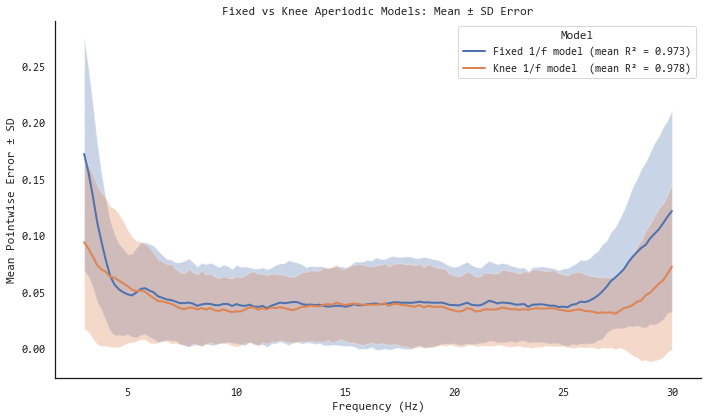

In [218]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF
from fooof.analysis import compute_pointwise_error_fm

# --- Styling ---
plt.rcParams['font.family']      = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize']   = 16
plt.rcParams['axes.labelsize']   = 14
plt.rcParams['xtick.labelsize']  = 12
plt.rcParams['ytick.labelsize']  = 12
sns.set_style('white')
sns.set(font="Consolas")

# --- Frequency selection ---
freqs = np.unique(combat_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Compute errors and R² ---
errors = []
r2_fixed = []
r2_knee = []

for _, row in all_combat.iterrows():
    psd_log10 = row[5:].values[freq_mask]
    psd_linear = np.power(10, psd_log10)


    # Fixed model
    fm_fixed = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1, 8],
                     min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    r2_fixed.append(fm_fixed.r_squared_)
    err_fixed = compute_pointwise_error_fm(fm_fixed, plot_errors=False, return_errors=True)

    # Knee model
    fm_knee = FOOOF(aperiodic_mode='knee', peak_width_limits=[1, 8],
                    min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    r2_knee.append(fm_knee.r_squared_)
    err_knee = compute_pointwise_error_fm(fm_knee, plot_errors=False, return_errors=True)

    for f, ef, ek in zip(freqs, err_fixed, err_knee):
        errors.append({'frequency': f,
                       'error_fixed': ef,
                       'error_knee': ek})

errors_df = pd.DataFrame(errors)

# Compute summary statistics
summary = (errors_df
           .groupby('frequency')
           .agg(mean_fixed=('error_fixed', 'mean'),
                std_fixed=('error_fixed', 'std'),
                mean_knee=('error_knee', 'mean'),
                std_knee=('error_knee', 'std'))
           .reset_index())

# Compute mean R² for legend
mean_r2_fixed = np.mean(r2_fixed)
mean_r2_knee  = np.mean(r2_knee)

# --- Plot ---
plt.figure(figsize=(10, 6))

label_fixed = f"Fixed 1/f model (mean R² = {mean_r2_fixed:.3f})"
label_knee  = f"Knee 1/f model  (mean R² = {mean_r2_knee:.3f})"

plt.plot(summary['frequency'], summary['mean_fixed'], label=label_fixed, linewidth=2)
plt.fill_between(summary['frequency'],
                 summary['mean_fixed'] - summary['std_fixed'],
                 summary['mean_fixed'] + summary['std_fixed'],
                 alpha=0.3)

plt.plot(summary['frequency'], summary['mean_knee'], label=label_knee, linewidth=2)
plt.fill_between(summary['frequency'],
                 summary['mean_knee'] - summary['std_knee'],
                 summary['mean_knee'] + summary['std_knee'],
                 alpha=0.3)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Mean Pointwise Error ± SD')
plt.title('Fixed vs Knee Aperiodic Models: Mean ± SD Error')
plt.legend(title='Model', facecolor='white')
#plt.axhline(0, color='grey', linestyle='--', linewidth=1)
plt.gca().set_facecolor('white')

# Clean up axes
for spine in plt.gca().spines.values():
    spine.set_edgecolor('k')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


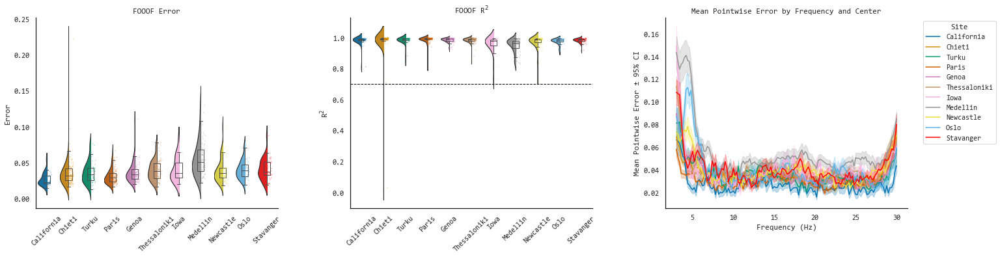

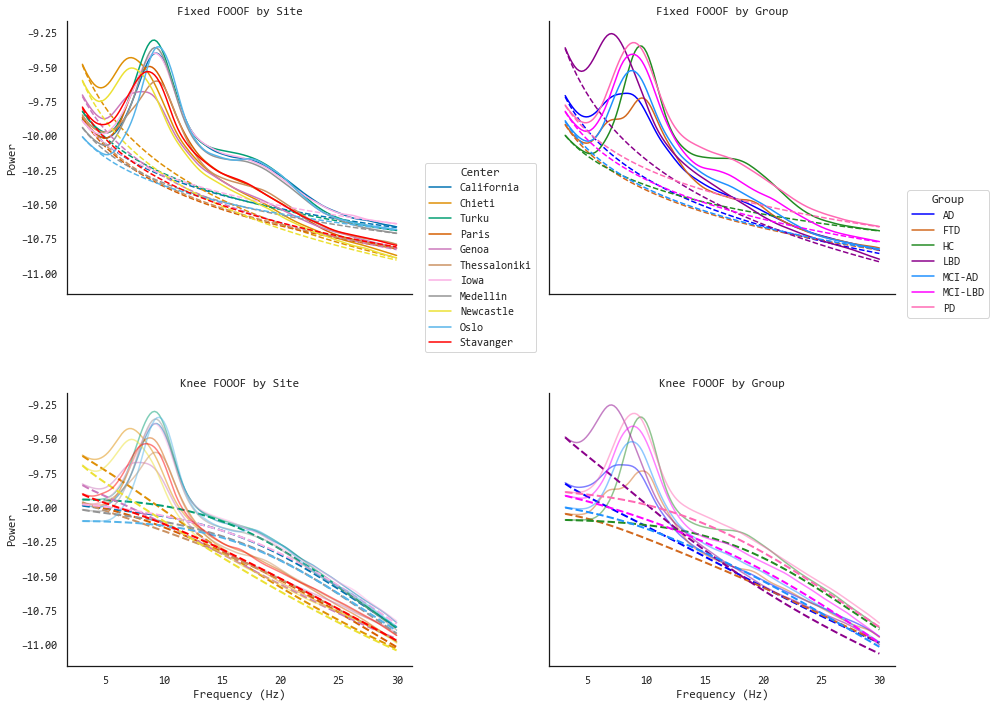

In [317]:
# --- ONE-CELL SCRIPT: reuse the exact 'center' order & colors across figures ---

# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF

# --------------------------------------------------------------------------------
# Assumptions:
#   - You already have the following DataFrames in memory:
#       features_df: columns include ['participant_id','center','frequency','error_fm']
#       fooof_params_df: columns include ['center','error','r_squared', ...]
#       combat_psd: columns include ['frequency', ...] (or at least frequency values accessible)
#       all_combat: rows with ['center','group', <power spectrum in log10 starting column index 5> ...]
#   - This script renders two figures:
#       Fig A: Error + R^2 violins (by center) + error-by-frequency lines (by center)
#       Fig B: FOOOF fits by site and by group (fixed & knee), using SAME center order & colors as Fig A
# --------------------------------------------------------------------------------

# --- Global styling ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')
sns.set(font="Consolas")

# --- Palette: colorblind + two reds (for >10 centers safeguard), reused everywhere ---
colorblind_palette = sns.color_palette("colorblind")
colorblind11_palette = colorblind_palette + [(1.0, 0.0, 0.0)] + [(1.0, 0.0, 0.0)]
palette = colorblind11_palette

# =========================
# Figure A: Recreate first multi-axes plot and CAPTURE center order + colors
# =========================

# Build errors_df required for subplot 3
errors_df = features_df[['participant_id', 'center', 'frequency', 'error_fm']].copy()

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))

# --- Subplot A1: Violin/box/strip for Error ---
ax1 = axes[0]
sns.violinplot(x="center", y="error", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax1)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

# Clip violins to half-width
for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="error", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)
sns.stripplot(x="center", y="error", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.25, size=2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
ax1.set_title("FOOOF Error")
ax1.set_xlabel("")
ax1.set_ylabel("Error")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.grid(False)
ax1.set_facecolor('white')
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# --- Subplot A2: Violin/box/strip for R^2 ---
ax2 = axes[1]
sns.violinplot(x="center", y="r_squared", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax2)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(x="center", y="r_squared", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax2)

old_len_collections = len(ax2.collections)
sns.stripplot(x="center", y="r_squared", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax2,
              alpha=0.25, size=2)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax2.set_xlim(xlim2)
ax2.set_ylim(ylim2)
ax2.set_title("FOOOF R$^2$")
ax2.set_xlabel("")
ax2.set_ylabel("R$^2$")
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.axhline(y=0.7, color='black', linestyle='--', linewidth=1)
ax2.grid(False)
ax2.set_facecolor('white')
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# --- Subplot A3: Mean ± CI of pointwise error by frequency and center ---
ax3 = axes[2]

# CRITICAL: Extract the EXACT order that seaborn used on subplot A1, and map to the SAME palette.
center_order = [tick.get_text().lower() for tick in ax1.get_xticklabels()]
center_color_map = dict(zip(center_order, palette[:len(center_order)]))

# Compute summary stats
summary_df = (
    errors_df
    .groupby(['center', 'frequency'])
    .agg(mean_error=('error_fm', 'mean'),
         std_error=('error_fm', 'std'),
         n=('error_fm', 'count'))
    .reset_index()
)
summary_df['sem']  = summary_df['std_error'] / np.sqrt(summary_df['n'].clip(lower=1))
summary_df['ci95'] = 1.96 * summary_df['sem']

# Plot one line per center with the SAME colors and order
for key in center_order:
    group_df = summary_df[summary_df['center'].str.lower() == key]
    if group_df.empty:
        continue
    color = center_color_map[key]
    ax3.plot(group_df['frequency'], group_df['mean_error'], label=key, color=color)
    ax3.fill_between(group_df['frequency'],
                     group_df['mean_error'] - group_df['sem'],
                     group_df['mean_error'] + group_df['sem'],
                     color=color, alpha=0.25)

ax3.set_title("Mean Pointwise Error by Frequency and Center")
ax3.set_xlabel("Frequency (Hz)")
ax3.set_ylabel("Mean Pointwise Error ± 95% CI")
ax3.grid(True)
ax3.set_facecolor('white')
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

legend = ax3.legend(title="Site", bbox_to_anchor=(1.05, 1), loc='upper left', facecolor='white')
for text in legend.get_texts():
    text.set_text(text.get_text().capitalize())

plt.subplots_adjust(wspace=0.3, bottom=0.2)
#plt.show()

# =========================
# Figure B: FOOOF fits, using EXACT same 'center' order & colors as above
# =========================

# --- Frequency selection for FOOOF fitting ---
freqs = np.unique(combat_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Collect psd_fit and ap_fit for fixed and knee models ---
fixed_rows = []
knee_rows  = []

for _, row in all_combat.iterrows():
    center = row['center']
    group  = row['group']
    psd_log10 = row[5:].values[freq_mask]   # assumes spectrum starts at column index 5
    psd_linear = 10 ** psd_log10

    # Fixed model
    fm_fixed = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1,8],
                     min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    psd_fit_fixed = fm_fixed.fooofed_spectrum_
    ap_fit_fixed  = fm_fixed._ap_fit

    # Knee model
    fm_knee = FOOOF(aperiodic_mode='knee', peak_width_limits=[1,8],
                    min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    psd_fit_knee = fm_knee.fooofed_spectrum_
    ap_fit_knee  = fm_knee._ap_fit

    # Store values per frequency
    for f, pff, aff, pfk, afk in zip(freqs, psd_fit_fixed, ap_fit_fixed, psd_fit_knee, ap_fit_knee):
        fixed_rows.append({'center': center, 'group': group,
                           'frequency': f, 'psd_fit': pff, 'ap_fit': aff})
        knee_rows .append({'center': center, 'group': group,
                           'frequency': f, 'psd_fit': pfk, 'ap_fit': afk})

fixed_df = pd.DataFrame(fixed_rows)
knee_df  = pd.DataFrame(knee_rows)

# --- Compute means ---
mean_fixed_center = fixed_df.groupby(['center','frequency'])[['psd_fit','ap_fit']].mean().reset_index()
mean_fixed_group  = fixed_df.groupby(['group','frequency']) [['psd_fit','ap_fit']].mean().reset_index()
mean_knee_center  = knee_df.groupby (['center','frequency'])[['psd_fit','ap_fit']].mean().reset_index()
mean_knee_group   = knee_df.groupby (['group','frequency']) [['psd_fit','ap_fit']].mean().reset_index()

# --- Normalize center labels and LOCK order to match Figure A ---
for df in [mean_fixed_center, mean_knee_center]:
    df['center_key'] = df['center'].str.lower()
    df['center_key'] = pd.Categorical(df['center_key'], categories=center_order, ordered=True)
    df.sort_values(['center_key', 'frequency'], inplace=True)

# --- Plotting ---
fig1, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)

# Colors for groups (unrelated to centers)
pal_g = ['blue', 'chocolate', 'forestgreen','darkmagenta','dodgerblue', 'fuchsia', 'hotpink']

# Row 0: Fixed model
ax0, ax1 = axes[0]

# By Site (use SAME colors & order)
for key in center_order:
    dfc = mean_fixed_center[mean_fixed_center['center_key'] == key]
    if dfc.empty:
        continue
    color = center_color_map[key]
    label = dfc['center'].iloc[0]  # original casing
    ax0.plot(dfc['frequency'], dfc['psd_fit'], label=label, color=color)
    ax0.plot(dfc['frequency'], dfc['ap_fit'],  linestyle='--', color=color)
ax0.set_title('Fixed FOOOF by Site')
ax0.set_ylabel('Power')
ax0.legend(title='Center', bbox_to_anchor=(1.02,0.5), loc='upper left', facecolor='white')
ax0.grid(False)
ax0.set_facecolor('white')
for s in ax0.spines.values(): s.set_edgecolor('k')
ax0.spines['top'].set_visible(False); ax0.spines['right'].set_visible(False)

# By Group (independent palette)
for i, grp in enumerate(mean_fixed_group['group'].unique()):
    dfg = mean_fixed_group[mean_fixed_group['group']==grp]
    ax1.plot(dfg['frequency'], dfg['psd_fit'], label=grp, color=pal_g[i % len(pal_g)])
    ax1.plot(dfg['frequency'], dfg['ap_fit'],  linestyle='--', color=pal_g[i % len(pal_g)])
ax1.set_title('Fixed FOOOF by Group')
ax1.legend(title='Group', bbox_to_anchor=(1.02,0.4), loc='upper left', facecolor='white')
ax1.grid(False)
ax1.set_facecolor('white')
for s in ax1.spines.values(): s.set_edgecolor('k')
ax1.spines['top'].set_visible(False); ax1.spines['right'].set_visible(False)

# Row 1: Knee model
ax2, ax3 = axes[1]

# By Site (use SAME colors & order)
for key in center_order:
    dfc = mean_knee_center[mean_knee_center['center_key'] == key]
    if dfc.empty:
        continue
    color = center_color_map[key]
    label = dfc['center'].iloc[0]
    ax2.plot(dfc['frequency'], dfc['psd_fit'], label=label, color=color, alpha=0.5)
    ax2.plot(dfc['frequency'], dfc['ap_fit'],  linestyle='--', color=color, alpha=1, lw=2)
ax2.set_title('Knee FOOOF by Site')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Power')
ax2.grid(False)
ax2.set_facecolor('white')
for s in ax2.spines.values(): s.set_edgecolor('k')
ax2.spines['top'].set_visible(False); ax2.spines['right'].set_visible(False)

# By Group (independent palette)
for i, grp in enumerate(mean_knee_group['group'].unique()):
    dfg = mean_knee_group[mean_knee_group['group']==grp]
    ax3.plot(dfg['frequency'], dfg['psd_fit'], label=grp, color=pal_g[i % len(pal_g)], alpha=0.5)
    ax3.plot(dfg['frequency'], dfg['ap_fit'],  linestyle='--', color=pal_g[i % len(pal_g)], alpha=1, lw=2)
ax3.set_title('Knee FOOOF by Group')
ax3.set_xlabel('Frequency (Hz)')
ax3.grid(False)
ax3.set_facecolor('white')
for s in ax3.spines.values(): s.set_edgecolor('k')
ax3.spines['top'].set_visible(False); ax3.spines['right'].set_visible(False)


plt.tight_layout()
plt.show()

# # Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/knee_vs_fixed_by_groups'
fig1.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig1.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')




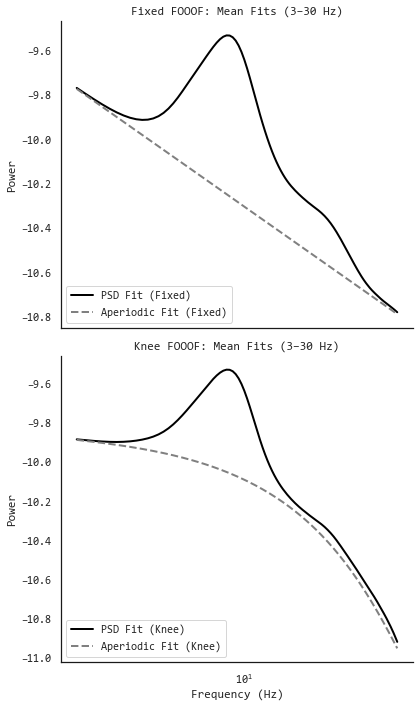

In [331]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF

# --- Styling ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')
sns.set(font="Consolas")


# --- Frequency selection ---
freqs = np.unique(unharm_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Collect psd_fit and ap_fit for fixed and knee models ---
fixed_rows = []
knee_rows  = []

for _, row in pivot_psd.iterrows():
    psd_log10   = row[5:].values[freq_mask]
    psd_linear  = 10 ** psd_log10

    # Fixed model
    fm_fixed    = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1,8],
                        min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    psd_fit_f   = fm_fixed.fooofed_spectrum_
    ap_fit_f    = fm_fixed._ap_fit

    # Knee model
    fm_knee     = FOOOF(aperiodic_mode='knee', peak_width_limits=[1,8],
                        min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    psd_fit_k   = fm_knee.fooofed_spectrum_
    ap_fit_k    = fm_knee._ap_fit

    # Store values
    fixed_rows.extend([{'frequency': f, 'psd_fit': pf, 'ap_fit': af}
                       for f, pf, af in zip(freqs, psd_fit_f, ap_fit_f)])
    knee_rows.extend ([{'frequency': f, 'psd_fit': pk, 'ap_fit': ak}
                       for f, pk, ak in zip(freqs, psd_fit_k, ap_fit_k)])

fixed_df = pd.DataFrame(fixed_rows)
knee_df  = pd.DataFrame(knee_rows)

# --- Compute overall mean psd_fit and ap_fit across all subjects ---
summary_fixed = fixed_df.groupby('frequency')[['psd_fit','ap_fit']].mean().reset_index()
summary_knee  = knee_df.groupby ('frequency')[['psd_fit','ap_fit']].mean().reset_index()

# --- Plotting ---
fig, axes = plt.subplots(2, 1, figsize=(6, 10), sharex=True)

# (1) Fixed FOOOF overall
ax = axes[0]
ax.plot(summary_fixed['frequency'], summary_fixed['psd_fit'],
        label='PSD Fit (Fixed)', linewidth=2, color='black')
ax.plot(summary_fixed['frequency'], summary_fixed['ap_fit'],
        label='Aperiodic Fit (Fixed)', linestyle='--', linewidth=2, color='gray')
ax.set_ylabel('Power')
ax.set_title('Fixed FOOOF: Mean Fits (3–30 Hz)')
ax.legend(loc = 'lower left', facecolor ='white')
ax.set_xscale('log')
ax.grid(False)
ax.set_facecolor('white')

# Clean up axes
for spine in ax.spines.values():
    spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# (2) Knee FOOOF overall
ax = axes[1]
ax.plot(summary_knee['frequency'], summary_knee['psd_fit'],
        label='PSD Fit (Knee)', linewidth=2, color='black')
ax.plot(summary_knee['frequency'], summary_knee['ap_fit'],
        label='Aperiodic Fit (Knee)', linestyle='--', linewidth=2, color='gray')
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('Power')
ax.set_title('Knee FOOOF: Mean Fits (3–30 Hz)')
ax.legend(loc = 'lower left', facecolor ='white')
ax.set_xscale('log')
ax.grid(False)
ax.set_facecolor('white')

# Clean up axes
for spine in ax.spines.values():
    spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# # Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/knee_vs_fixed_all'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


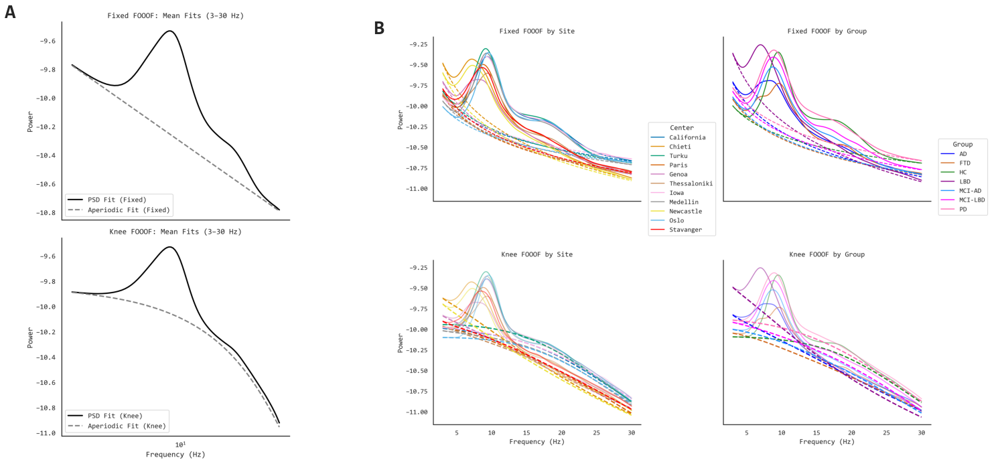

In [332]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/knee_vs_fixed_all.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/knee_vs_fixed_by_groups.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(1, 2, figsize=(24, 10))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.01, 1, annotations[i], transform=ax.transAxes,
            fontsize=30, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots

plt.tight_layout()
plt.subplots_adjust(hspace=0.001)
plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/knee_vs_fixed_psds'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')

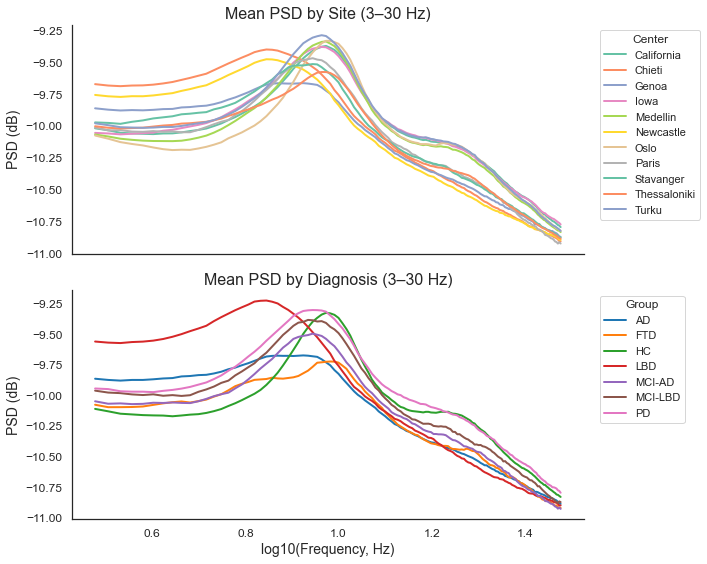

In [142]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Set Consolas (or fallback) font and style ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')

# --- Melt PSD data into long form ---
id_vars = ['participant_id', 'center', 'group']
feature_cols = [c for c in all_combat.columns if c.startswith('psd_freq')]
psd_long = all_combat.melt(
    id_vars=id_vars,
    value_vars=feature_cols,
    var_name='frequency',
    value_name='psd_db'
)
# Extract numeric frequency from column names and convert to float
psd_long['frequency'] = (
    psd_long['frequency']
    .str.extract(r'([0-9]*\.?[0-9]+)')
    .astype(float)
)

# --- Filter to 3–30 Hz BEFORE log transform ---
psd_long = psd_long[(psd_long['frequency'] >= 3) & (psd_long['frequency'] <= 30)].copy()

# Compute log10 frequency
psd_long['logf'] = np.log10(psd_long['frequency'])

# --- Compute mean PSD per frequency for each site and each group ---
mean_center = (
    psd_long
    .groupby(['center', 'logf'])['psd_db']
    .mean()
    .reset_index()
)
mean_group = (
    psd_long
    .groupby(['group', 'logf'])['psd_db']
    .mean()
    .reset_index()
)

# --- Plotting ---
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# (1) Mean PSD by site
centers = sorted(mean_center['center'].unique())
palette_c = sns.color_palette('Set2', n_colors=len(centers))
for i, ctr in enumerate(centers):
    dfc = mean_center[mean_center['center'] == ctr]
    ax0.plot(dfc['logf'], dfc['psd_db'], label=ctr, color=palette_c[i], linewidth=2)
ax0.set_ylabel('PSD (dB)')
ax0.set_title('Mean PSD by Site (3–30 Hz)')
ax0.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.legend(title='Center', bbox_to_anchor=(1.02, 1), loc='upper left')

# (2) Mean PSD by diagnosis group
groups = sorted(mean_group['group'].unique())
palette_g = sns.color_palette('tab10', n_colors=len(groups))
for i, grp in enumerate(groups):
    dfg = mean_group[mean_group['group'] == grp]
    ax1.plot(dfg['logf'], dfg['psd_db'], label=grp, color=palette_g[i], linewidth=2)
ax1.set_xlabel('log10(Frequency, Hz)')
ax1.set_ylabel('PSD (dB)')
ax1.set_title('Mean PSD by Diagnosis (3–30 Hz)')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.legend(title='Group', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [343]:
good_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] >= 0.7]
good_r_squared_df.shape

(638, 15)

In [344]:
# Count the number of NaNs in each column
nan_counts = good_r_squared_df[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].isna().sum()

# Display the result
print("Number of NaNs in each column before imputation:")
print(nan_counts)


Number of NaNs in each column before imputation:
extalphas_cf    2
extalphas_pw    2
extalphas_bw    2
dtype: int64


In [345]:
# Count the number of NaNs for each column grouped by 'group'
group_nan_counts = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].apply(lambda group: group.isna().sum())

# Display the result
print("Number of NaNs in each group and column:")
print(group_nan_counts)


Number of NaNs in each group and column:
         extalphas_cf  extalphas_pw  extalphas_bw
group                                            
AD                  1             1             1
FTD                 0             0             0
HC                  0             0             0
LBD                 0             0             0
MCI-AD              1             1             1
MCI-LBD             0             0             0
PD                  0             0             0


In [346]:
# Calculating the median of extalphas_cf, extalphas_pw, and extalphas_bw for each group
group_medians = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].median()

# Replacing missing values in the dataset with the corresponding group median
for col in ['extalphas_cf', 'extalphas_pw', 'extalphas_bw']:
    good_r_squared_df[col] = good_r_squared_df.groupby('group')[col].transform(lambda x: x.fillna(x.median()))


In [347]:
# Count the number of NaNs for each column grouped by 'group'
group_nan_counts = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].apply(lambda group: group.isna().sum())

# Display the result
print("Number of NaNs in each group and column:")
print(group_nan_counts)


Number of NaNs in each group and column:
         extalphas_cf  extalphas_pw  extalphas_bw
group                                            
AD                  0             0             0
FTD                 0             0             0
HC                  0             0             0
LBD                 0             0             0
MCI-AD              0             0             0
MCI-LBD             0             0             0
PD                  0             0             0


In [348]:
(638*100)/639

99.8435054773083

In [349]:
fooof_params_df# Filter the DataFrame to find participants with r_squared < 0.8
low_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] < 0.7]

# Display the filtered DataFrame
low_r_squared_df

,participant_id,center,group,age,gender,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
48,chi_019,Chieti,AD,74.0,F,NaN,NaN,NaN,NaN,NaN,NaN,0.000521,-9.225049,9.268390e-07,0.110958


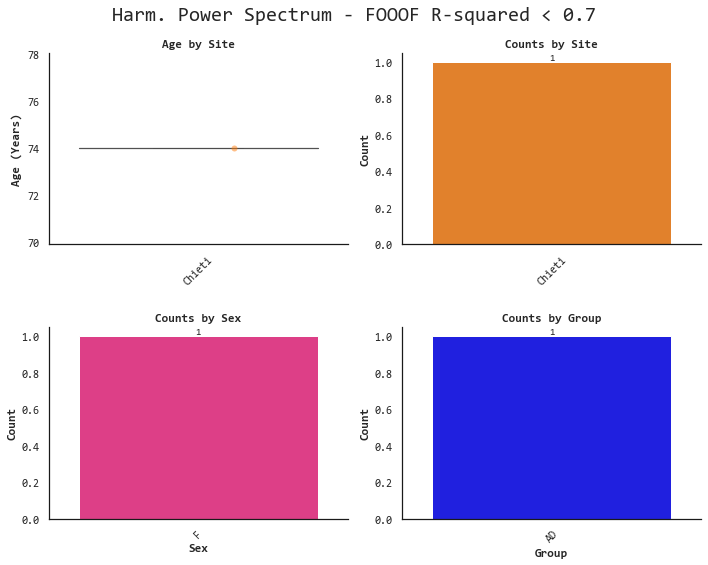

In [350]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

df = low_r_squared_df
# Assume df is the input dataset
palette = ['#ff7f0e', '#d62728', '#8c564b', '#7f7f7f', '#bcbd22', '#17becf', 'red']

# Create a 2x2 grid layout
fig = plt.figure(figsize=(10, 8))
gs = GridSpec(2, 2, figure=fig)


# Subplot 1: Raincloud plot for "age"
ax1 = fig.add_subplot(gs[0, 0])
sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
               palette=palette,
               scale="width", inner=None, ax=ax1)
xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.5, size=6)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
#ax1.legend_.remove()
ax1.set_title("Age by Site", fontweight='bold')
ax1.set_xlabel("")
ax1.set_ylabel("Age (Years)", fontweight= 'bold')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.grid(False)
ax1.set_facecolor('white')  # Set the background color
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)



# Subplot 2: Bar plot for absolute counts by center
ax2 = fig.add_subplot(gs[0, 1])
sns.countplot(x="center", data=df, palette=palette, ax=ax2)
for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax2.set_title("Counts by Site", fontweight='bold')
ax2.set_xlabel(" ", fontweight='bold')
ax2.set_ylabel("Count", fontweight='bold')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.grid(False)
ax2.set_facecolor('white')  # Set the background color
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)



# Subplot 3: Bar plot for absolute counts by sex
ax3 = fig.add_subplot(gs[1, 0])
sns.countplot(x="gender", data=df, palette=["#F72585", "#3A0CA3"], ax=ax3)
for p in ax3.patches:
    height = p.get_height()
    ax3.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax3.set_title("Counts by Sex", fontweight='bold')
ax3.set_xlabel("Sex", fontweight='bold')
ax3.set_ylabel("Count", fontweight='bold')
ax3.set_xticklabels([tick.get_text().capitalize() for tick in ax3.get_xticklabels()])
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45)
ax3.grid(False)
ax3.set_facecolor('white')  # Set the background color
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)



# Subplot 4: Bar plot for absolute counts by group
ax4 = fig.add_subplot(gs[1, 1])
sns.countplot(x="group", data=df, palette=['blue', 'darkmagenta','dodgerblue','forestgreen', 'chocolate','hotpink','fuchsia'], ax=ax4)
for p in ax4.patches:
    height = p.get_height()
    ax4.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax4.set_title("Counts by Group", fontweight='bold')
ax4.set_xlabel("Group", fontweight='bold')
ax4.set_ylabel("Count", fontweight='bold')
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=45)
ax4.set_xticklabels([tick.get_text().upper() for tick in ax4.get_xticklabels()])
ax4.grid(False)
ax4.set_facecolor('white')  # Set the background color
for spine in ax4.spines.values():
    spine.set_edgecolor('k')
    ax4.spines['top'].set_visible(False)
    ax4.spines['right'].set_visible(False)

fig.suptitle('Harm. Power Spectrum - FOOOF R-squared < 0.7')
# Adjust spacing between plots
fig.tight_layout()
plt.show()


In [230]:
good_r_squared_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/recombat_fooof_knee_multinomial.csv', index = False)

## Mass univariate permutation t-tests by NDDs

## NDDs PAIRWISE DIFFERENCES

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f
from statsmodels.stats.multitest import multipletests
import matplotlib.ticker as ticker
import numpy as np
from mne.stats import permutation_cluster_test
from scipy import stats
import pandas as pd

def prepare_data(psd_data, values = 'psd'):
    pivoted_data = psd_data.pivot(index=['participant_id', 'group'], columns='frequency', values=values)
    groups = np.unique(pivoted_data.index.get_level_values('group'))

    group_data_arrays = {}
    for group in groups:
        group_data = pivoted_data.xs(group, level='group').values
        n_subjects = group_data.shape[0]
        n_frequency_bins = group_data.shape[1]
        group_data_arrays[group] = group_data.reshape(n_subjects, n_frequency_bins, 1)

    data_arrays_list = [group_data_arrays[group] for group in groups]
    return data_arrays_list, n_frequency_bins

def run_permutation_test(data_arrays_list):
    n_conditions = len(data_arrays_list)
    n_observations = sum(len(group_data) for group_data in data_arrays_list)
    
    pval = 0.05  # arbitrary
    dfn = n_conditions - 1  # degrees of freedom numerator
    dfd = n_observations - n_conditions  # degrees of freedom denominator
    thresh = f.ppf(1 - pval, dfn=dfn, dfd=dfd)  # F distribution

    return permutation_cluster_test(
        data_arrays_list,
        n_permutations=2000,
        threshold=thresh,
        tail=0,
        n_jobs=-1,
        out_type='mask',
        adjacency=None, verbose=False, seed=42
    )

def plot_group_diffs(df, plot='psd', fig_title='', y_lim=(-11.5, -8.5), cmap='tab10'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()

    num_pairs = 0
    num_cols = 3
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    num_rows = -(-num_pairs // num_cols)

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows, sharey=True)
    axs = axs.flatten()

    plt.rcParams['font.family'] = 'Consolas'
    sns.set(font="Consolas")
    cmap = cmap
    palette = sns.color_palette(cmap, len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Prepare data for MNE permutation test
        combined_data = df[df['group'].isin([group1, group2])]
        data_arrays_list, n_frequency_bins = prepare_data(combined_data, values = plot)

        T_obs, clusters, cluster_p_vals, H0 = run_permutation_test(data_arrays_list)

        significant_clusters = np.zeros_like(T_obs, dtype=bool)
        for cluster, p_val in zip(clusters, cluster_p_vals):
            if p_val < 0.05:  # threshold for significance
                significant_clusters[cluster] = True

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=color_map[group1])
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=color_map[group2])

        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=color_map[group1])
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=color_map[group2])

        ax.set_xlabel('Frequency (Hz)', size = 14)
        ax.set_ylabel('Power (μV$^2$)', size = 14)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6, labelsize=12)

        ax.set_ylim(y_lim)

        times = np.linspace(1, 30, n_frequency_bins)  # Assuming frequency bins are uniform across datasets

        # Highlight significant clusters and apply legend to this
        for i_c, mask in enumerate(clusters):
            if cluster_p_vals[i_c] < 0.05:
                contiguous_regions = np.where(np.diff(np.concatenate(([False], mask.squeeze(), [False]))))[0].reshape(-1, 2)
                for start, stop in contiguous_regions:
                    if plot == 'osc_fit':
                        ax.fill_between(times[start:stop], np.min(y_lim), np.min(y_lim) + 0.09, alpha=0.3, color='green')
                    else:
                        ax.fill_between(times[start:stop], np.min(y_lim)-0.02, np.min(y_lim) + 0.22, alpha=0.3, color='green')

        ax.set_title(' ')
        # ax.legend(loc='upper center', ncol=1, bbox_to_anchor=(0.52, 1.3), frameon=False, fontsize=14)
        from matplotlib.lines import Line2D

        handles, labels = ax.get_legend_handles_labels()
        circle_handles = [
            Line2D([], [], linestyle='None', marker='o',
                markerfacecolor=h.get_color(), markeredgecolor=h.get_color(),
                markersize=8, label=lab)
            for h, lab in zip(handles, labels)
        ]
        ax.legend(circle_handles, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.45, 1.3), 
                  frameon=False, fontsize=14, columnspacing=0.5, handletextpad=0.1)


        ax.grid(False)
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    # plt.suptitle(fig_title, size=20)
    # plt.show()

# # Call the function with your data
# plot_group_diffs(unharm_psd, plot='psd', fig_title='Unharm. - Power Spectrum', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    fig.suptitle(fig_title, size=20)
    return fig

fig = plot_group_diffs(
    unharm_psd,
    plot='psd',
    fig_title='Unharm. - Power Spectrum',
    cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
)

# Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/full_psd_unharm_group_diff_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it




In [ ]:
# plot_group_diffs(combat_psd, plot='psd', fig_title='Harm. - Power Spectrum', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])

fig = plot_group_diffs(
    combat_psd,
    plot='psd',
    fig_title='Harm. - Power Spectrum',
    cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
)

# Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/full_psd_harm_group_diff_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it

# Unh. vs Harm Full PSD

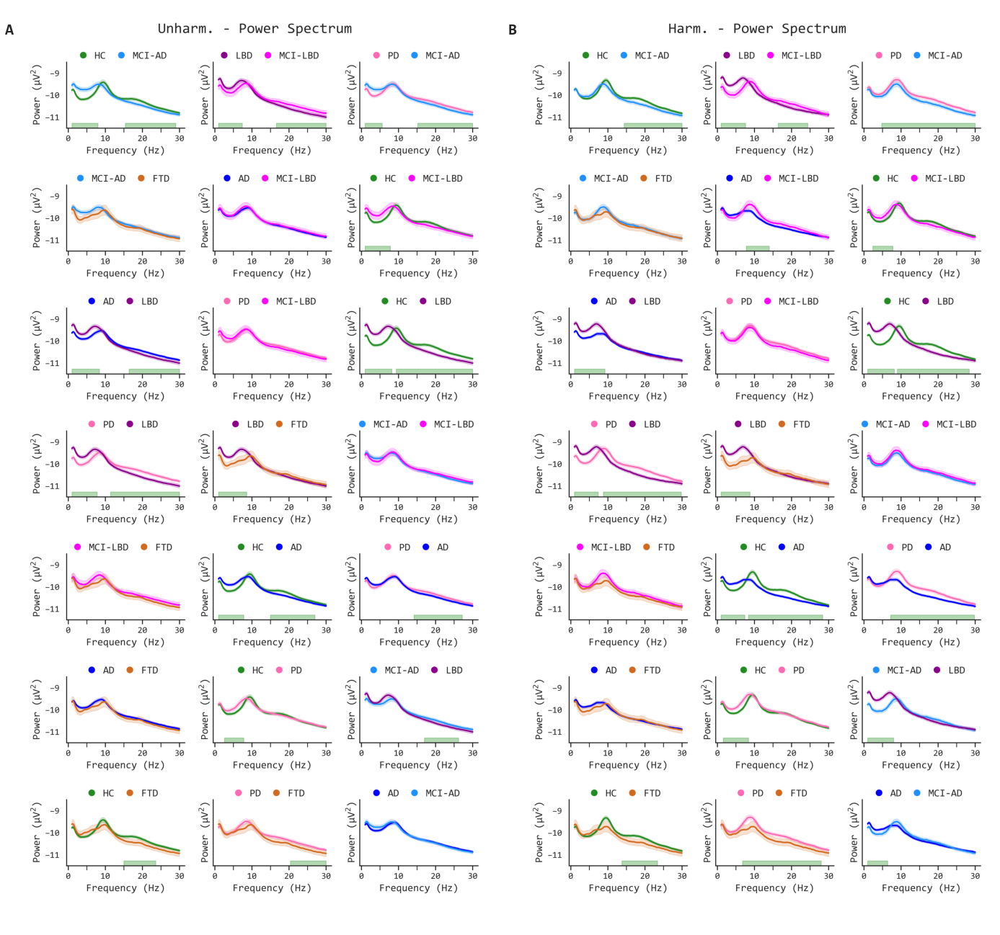

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.lines import Line2D
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/full_psd_unharm_group_diff.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/full_psd_harm_group_diff.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 1-row, 2-column figure
fig, axs = plt.subplots(1, 2, figsize=(20, 2.6*7))  # Adjust figsize if needed

# Annotations
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.005, 0.98, annotations[i], transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# # Add vertical dashed line in the middle (figure coordinates)
# line = Line2D([0.5, 0.5], [0.02, 0.98], color='black', linewidth=1.5, linestyle='--', transform=fig.transFigure)
# line.set_dashes([6, 10])  # Dash 8pt, gap 10pt
# fig.add_artist(line)

plt.subplots_adjust(wspace=0.005)  # Reduce space between columns
# Adjust spacing
plt.tight_layout()

# Show the figure
plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/full_psd_group_diff'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


## Oscillatory

In [ ]:
# # Example usage with a custom plot parameter
# plot_group_diffs(features_df, plot='osc_fit', fig_title='Oscillatory', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'], y_lim=(-0.2,1.4))

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f
from statsmodels.stats.multitest import multipletests
import matplotlib.ticker as ticker
import numpy as np
from mne.stats import permutation_cluster_test
from scipy import stats
import pandas as pd

def prepare_data(psd_data, values = 'psd'):
    pivoted_data = psd_data.pivot(index=['participant_id', 'group'], columns='frequency', values=values)
    groups = np.unique(pivoted_data.index.get_level_values('group'))

    group_data_arrays = {}
    for group in groups:
        group_data = pivoted_data.xs(group, level='group').values
        n_subjects = group_data.shape[0]
        n_frequency_bins = group_data.shape[1]
        group_data_arrays[group] = group_data.reshape(n_subjects, n_frequency_bins, 1)

    data_arrays_list = [group_data_arrays[group] for group in groups]
    return data_arrays_list, n_frequency_bins

def run_permutation_test(data_arrays_list):
    n_conditions = len(data_arrays_list)
    n_observations = sum(len(group_data) for group_data in data_arrays_list)
    
    pval = 0.05  # arbitrary
    dfn = n_conditions - 1  # degrees of freedom numerator
    dfd = n_observations - n_conditions  # degrees of freedom denominator
    thresh = f.ppf(1 - pval, dfn=dfn, dfd=dfd)  # F distribution

    return permutation_cluster_test(
        data_arrays_list,
        n_permutations=2000,
        threshold=thresh,
        tail=0,
        n_jobs=-1,
        out_type='mask',
        adjacency=None, verbose=False, seed=42
    )

def plot_group_diffs(df, plot='psd', fig_title='', y_lim=(-11.5, -8.5), cmap='tab10'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()

    num_pairs = 0
    num_cols = 3
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    num_rows = -(-num_pairs // num_cols)

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows, sharey=True)
    axs = axs.flatten()

    plt.rcParams['font.family'] = 'Consolas'
    sns.set(font="Consolas")
    cmap = cmap
    palette = sns.color_palette(cmap, len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Prepare data for MNE permutation test
        combined_data = df[df['group'].isin([group1, group2])]
        data_arrays_list, n_frequency_bins = prepare_data(combined_data, values = plot)

        T_obs, clusters, cluster_p_vals, H0 = run_permutation_test(data_arrays_list)

        significant_clusters = np.zeros_like(T_obs, dtype=bool)
        for cluster, p_val in zip(clusters, cluster_p_vals):
            if p_val < 0.05:  # threshold for significance
                significant_clusters[cluster] = True

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=color_map[group1])
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=color_map[group2])

        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=color_map[group1])
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=color_map[group2])

        ax.set_xlabel('Frequency (Hz)', size = 14)
        ax.set_ylabel('Power (μV$^2$)', size = 14)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6, labelsize=12)

        ax.set_ylim(y_lim)
        ax.set_xlim(0,30)

        times = np.linspace(3, 30, n_frequency_bins)  # Assuming frequency bins are uniform across datasets

        # Highlight significant clusters and apply legend to this
        for i_c, mask in enumerate(clusters):
            if cluster_p_vals[i_c] < 0.05:
                contiguous_regions = np.where(np.diff(np.concatenate(([False], mask.squeeze(), [False]))))[0].reshape(-1, 2)
                for start, stop in contiguous_regions:
                    if plot == 'osc_fit':
                        ax.fill_between(times[start:stop], np.min(y_lim), np.min(y_lim) + 0.09, alpha=0.3, color='green')
                    else:
                        ax.fill_between(times[start:stop], np.min(y_lim)-0.02, np.min(y_lim) + 0.22, alpha=0.3, color='green')

        ax.set_title(' ')
        # ax.legend(loc='upper center', ncol=1, bbox_to_anchor=(0.52, 1.3), frameon=False, fontsize=14)
        from matplotlib.lines import Line2D

        handles, labels = ax.get_legend_handles_labels()
        circle_handles = [
            Line2D([], [], linestyle='None', marker='o',
                markerfacecolor=h.get_color(), markeredgecolor=h.get_color(),
                markersize=8, label=lab)
            for h, lab in zip(handles, labels)
        ]
        ax.legend(circle_handles, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.45, 1.3), 
                  frameon=False, fontsize=14, columnspacing=0.5, handletextpad=0.1)
        
        ax.grid(False)
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    # plt.suptitle(fig_title, size=20)
    # plt.show()

# # Call the function with your data
# plot_group_diffs(unharm_psd, plot='psd', fig_title='Unharm. - Power Spectrum', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    fig.suptitle(fig_title, size=20)
    return fig



fig = plot_group_diffs(features_df, plot='osc_fit', fig_title='Oscillatory', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'], y_lim=(-0.2,1.4))



# Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_6a_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it

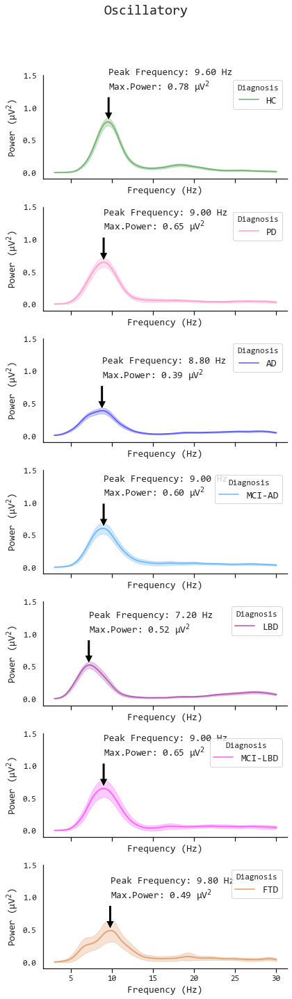

In [193]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

def plot_channel_power(df, fig_title= '', plot_variable = '', group_by = '', ylim = (-0.1, 1.5), legend_title = ''):
    sns.set_style("white")
    sns.set(font="Consolas")
    sns.set_style(rc={'axes.facecolor': 'white'})

    # Get unique groups and assign colors from the sns palette
    group_categories = df[group_by].unique()
    palette = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
    color_map = dict(zip(group_categories, palette))

    # Create subplots
    fig, axes = plt.subplots(len(group_categories), 1, figsize=(6, 3 * len(group_categories)), sharex=True)

    if len(group_categories) == 1:
        axes = [axes]  # Make axes iterable

    for ax, group in zip(axes, group_categories):
        group_df = df[df[group_by] == group]
        mean_group = group_df.groupby(['frequency'])[plot_variable].mean()
        std_group = group_df.groupby(['frequency'])[plot_variable].std()
        num_samples = group_df.groupby(['frequency'])[plot_variable].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        ax.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(), alpha=0.5, color=color)
        ax.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Annotate peak frequency and its corresponding power
        peak_freq = mean_group.idxmax()
        peak_value = mean_group.max()
        ax.annotate(f'Peak Frequency: {peak_freq:.2f} Hz\nMax.Power: {peak_value:.2f} μV$^2$', 
                    xy=(peak_freq, peak_value), 
                    xytext=(peak_freq, peak_value + 0.5),
                    arrowprops=dict(facecolor='black', shrink=0.05), fontsize=14)

        ax.set_xlabel('Frequency (Hz)', size = 14)
        ax.set_ylabel('Power (μV$^2$)', size = 14)
        ax.set_ylim(ylim)
        ax.grid(False)  # Turn off the grid

        ax.legend(loc='upper right', frameon=True, title=legend_title, fontsize=14)

        sns.despine(ax=ax)  # Remove the top and right spines
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6, labelsize=12)

    plt.suptitle(fig_title, size=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect parameter as needed

    plt.show()

# Example usage
plot_channel_power(features_df, fig_title='Oscillatory', plot_variable='osc_fit', group_by='group', legend_title='Diagnosis')


## Aperiodic

In [ ]:
# plot_group_diffs(features_df, plot='ap_fit', fig_title='Aperiodic', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])



fig = plot_group_diffs(features_df, plot='ap_fit', fig_title='Aperiodic', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])




# Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_6b_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it

# Figure 6

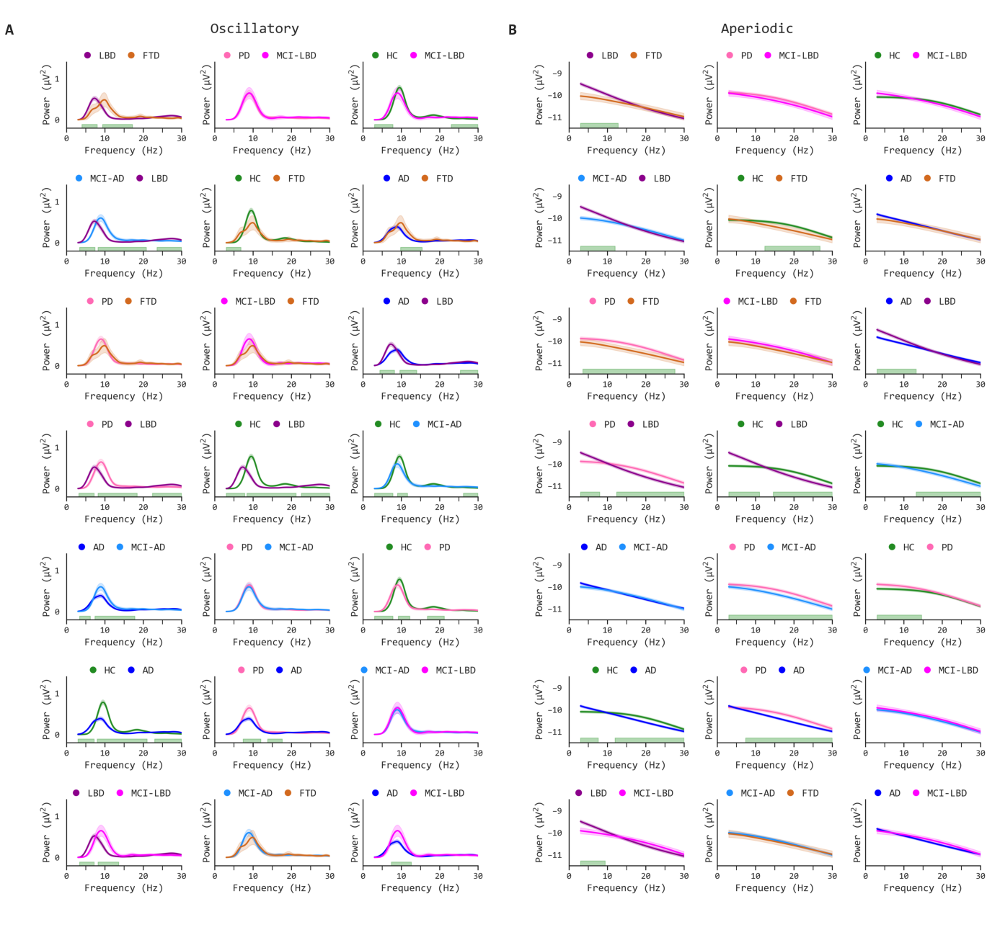

In [195]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.lines import Line2D
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_6a_knee.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_6b_knee.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 1-row, 2-column figure
fig, axs = plt.subplots(1, 2, figsize=(20, 2.6*7))  # Adjust figsize if needed

# Annotations
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.005, 0.98, annotations[i], transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# # Add vertical dashed line in the middle (figure coordinates)
# line = Line2D([0.5, 0.5], [0.02, 0.98], color='black', linewidth=1.5, linestyle='--', transform=fig.transFigure)
# line.set_dashes([6, 10])  # Dash 8pt, gap 10pt
# fig.add_artist(line)


# Adjust spacing
plt.subplots_adjust(wspace=0.005)  # Reduce space between columns
plt.tight_layout()

# Show the figure
plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_6_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


# Figure 7

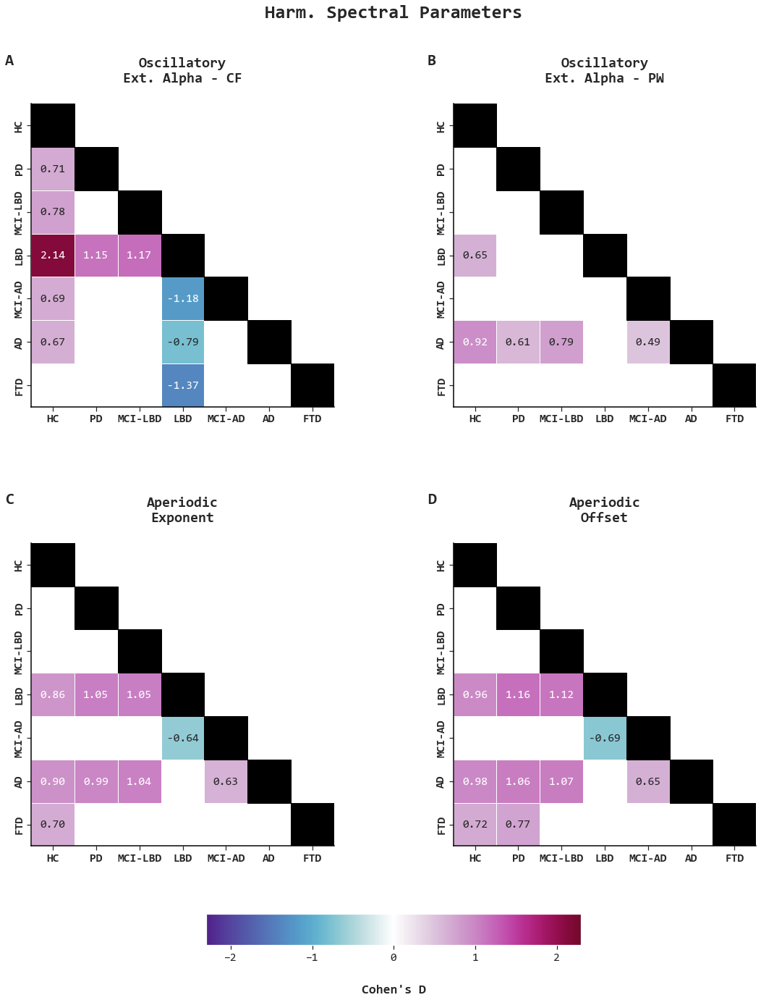

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature
0,group,HC,PD,False,True,4.261886,99.284452,two-sided,4.620113e-05,604.233,0.708006,0.38,1.08,4.421017e-04,extalphas_cf
1,group,HC,MCI-LBD,False,True,3.291650,40.441897,two-sided,2.072463e-03,24.501,0.780859,0.26,1.25,1.586523e-02,extalphas_cf
2,group,HC,LBD,False,True,15.137107,152.406149,two-sided,3.539741e-32,3.425e+33,2.138382,1.71,2.55,2.709761e-30,extalphas_cf
3,group,HC,MCI-AD,False,True,4.390545,112.677162,two-sided,2.563231e-05,990.721,0.692894,0.38,1.01,2.803169e-04,extalphas_cf
4,group,HC,AD,False,True,6.485326,282.548558,two-sided,3.944482e-10,2.659e+07,0.669843,0.44,0.90,6.039201e-09,extalphas_cf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-0.111577,242.761267,two-sided,9.112513e-01,0.139,-0.012830,-0.23,0.21,1.000000e+00,offset
80,group,LBD,FTD,False,True,-0.526459,25.070929,two-sided,6.031960e-01,0.271,-0.175566,-0.79,0.51,1.000000e+00,offset
81,group,MCI-AD,AD,False,True,4.180081,109.726368,two-sided,5.879454e-05,457.095,0.648666,0.33,0.94,7.501452e-04,offset
82,group,MCI-AD,FTD,False,True,1.761739,36.106168,two-sided,8.657960e-02,0.918,0.419137,-0.09,0.90,4.734205e-01,offset


In [231]:
import numpy as np
import pandas as pd
import pingouin as pg
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cmr




# Use only unharmonized data
harmonized_specparams = good_r_squared_df.copy()
harmonized_specparams['group'] = pd.Categorical(
    harmonized_specparams['group'],
    categories=['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD'],
    ordered=True
)

groups = harmonized_specparams['group'].cat.categories

# Example dictionary to store subplot titles
subplot_titles = {
    "extalphas_cf": "Oscillatory\nExt. Alpha - CF",
    "extalphas_pw": "Oscillatory\nExt. Alpha - PW",
    "exponent": "Aperiodic\nExponent",
    "offset": "Aperiodic\nOffset",
}


def pingouin_pairwise_with_bootstrap(data, feature, group, alpha=0.05, seed=42, n_boot=2000):
    groups = data[group].cat.categories

    # Use pairwise_tests from Pingouin to compute Cohen's D and uncorrected p-values
    pairwise_results = pg.pairwise_tests(dv=feature, between=group, data=data, padjust='none', effsize='cohen', parametric=True)

    # Initialize matrices to store results
    cohen_d_matrix = pd.DataFrame(np.nan, index=groups, columns=groups)

    # Compute bootstrapped CIs for Cohen's D
    ci_low = []
    ci_high = []
    for _, row in pairwise_results.iterrows():
        g1_data = data.loc[data[group] == row['A'], feature].values
        g2_data = data.loc[data[group] == row['B'], feature].values

        # Bootstrap CIs using Pingouin
        ci = pg.compute_bootci(
            x=g1_data,
            y=g2_data,
            func="cohen",
            paired=False,
            confidence=1 - alpha,
            n_boot=n_boot,
            seed=seed,
        )
        ci_low.append(ci[0])
        ci_high.append(ci[1])

        # Populate the matrix with Cohen's D values
        cohen_d_matrix.loc[row['A'], row['B']] = row['cohen']
        cohen_d_matrix.loc[row['B'], row['A']] = row['cohen']  # Symmetric

    # Add CIs to the DataFrame
    pairwise_results['ci_low'] = ci_low
    pairwise_results['ci_high'] = ci_high

    return cohen_d_matrix, pairwise_results

# Define features to plot
features = ["extalphas_cf", "extalphas_pw", "exponent", "offset"]
# Dictionary to store results for each feature
feature_results = {}

# Create a 2x2 grid for the subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
cmap = cmr.get_sub_cmap('cmr.viola', 0.1, 0.9)

# Store the mappable object for the shared colorbar
mappable = None

for i, feature in enumerate(features):
    ax = axes[i // 2, i % 2]
    
    # Generate bootstrap results
    cohen_d_matrix, pairwise_results = pingouin_pairwise_with_bootstrap(harmonized_specparams, feature, 'group', seed=42)

    # Apply Benjamini-Yekutieli correction for multiple comparisons
    pairwise_results['p-corr'] = pg.multicomp(pairwise_results['p-unc'].values, method='fdr_by')[1]

    # Store the results in the dictionary
    feature_results[feature] = pairwise_results

    # Masking for non-significant results
    non_significant_mask = np.zeros_like(cohen_d_matrix.values, dtype=bool)
    for _, row in pairwise_results.iterrows():
        g1, g2 = row['A'], row['B']
        idx_g1, idx_g2 = cohen_d_matrix.index.get_loc(g1), cohen_d_matrix.columns.get_loc(g2)
        non_significant_mask[idx_g2, idx_g1] = row['p-corr'] >= 0.05

    # Mask the upper triangle
    mask_upper = np.triu(np.ones_like(cohen_d_matrix, dtype=bool))
    combined_mask = mask_upper | non_significant_mask

    # Set diagonal to NaN and fill it with black color later
    np.fill_diagonal(cohen_d_matrix.values, np.nan)

    # Plot the matrix
    heatmap = sns.heatmap(
        cohen_d_matrix,
        mask=combined_mask,
        annot=True,
        annot_kws={"size": 16},
        fmt=".2f",
        center=0,
        vmin=-2.3,
        vmax=2.3,
        cmap=cmap,
        cbar=False,  # Disable individual colorbars
        square=True,
        linewidths=.5,
        linecolor='white',
        ax=ax,
    )
    
    # Save the heatmap mappable object for the shared colorbar
    if mappable is None:
        mappable = heatmap.get_children()[0]

    # Fill the diagonal with black
    for j in range(len(groups)):
        ax.add_patch(plt.Rectangle((j, j), 1, 1, fill=True, color='black', edgecolor='black'))

    # Annotate subplot as A), B), C), D)
    ax.text(-0.5, -1, f"{chr(65 + i)}", fontsize=22, fontweight="bold", va="center", ha="center")

    # Set subplot title
    ax.set_title(subplot_titles[feature], fontsize=20, fontweight="bold", pad=30)
    # Enable outer ticks on top and right
    ax.tick_params(axis='both', which='both', direction='out', top=True, right=True)
    ax.xaxis.tick_bottom()
    ax.yaxis.tick_left()
    # Customize x and y ticks
    ax.set_xticklabels([label.upper() for label in cohen_d_matrix.columns], fontsize=16, fontweight='bold')
    ax.set_yticklabels([label.upper() for label in cohen_d_matrix.index], fontsize=16, fontweight='bold')

    # Adjust spines
    ax.spines['left'].set_visible(True)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.set_facecolor('white')  # Set the background color

    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)


# Add shared colorbar
cbar = fig.colorbar(
    mappable,
    ax=axes,
    location='bottom',
    shrink=1.5,
    aspect=12,
    pad=0.2,
    label="Cohen's D")

# Make the title bigger
cbar.set_label("Cohen's D", fontsize=18, fontweight='bold', labelpad=30)
cbar.ax.tick_params(labelsize=16)
cbar.ax.set_position([0.3, -1.07, 0.4, 1])  # [x, y, width, height]

plt.suptitle('Harm. Spectral Parameters', fontsize=26, fontweight='bold', y=1.02)

# Tight layout to avoid overlap
plt.tight_layout(h_pad=6, w_pad=6)


plt.show()

output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_7_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', bbox_inches='tight', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')


# Combine all feature results into a single DataFrame with a "Feature" column for differentiation
combined_results = pd.concat(
    [df.assign(Feature=feature) for feature, df in feature_results.items()],
    ignore_index=True
)

combined_results#.round(3)



In [232]:
# Combine all feature results into a single DataFrame with a "Feature" column for differentiation
combined_results = pd.concat(
    [df.assign(Feature=feature) for feature, df in feature_results.items()],
    ignore_index=True
)
combined_results.round(3)

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature
0,group,HC,PD,False,True,4.262,99.284,two-sided,0.000,604.233,0.708,0.38,1.08,0.000,extalphas_cf
1,group,HC,MCI-LBD,False,True,3.292,40.442,two-sided,0.002,24.501,0.781,0.26,1.25,0.016,extalphas_cf
2,group,HC,LBD,False,True,15.137,152.406,two-sided,0.000,3.425e+33,2.138,1.71,2.55,0.000,extalphas_cf
3,group,HC,MCI-AD,False,True,4.391,112.677,two-sided,0.000,990.721,0.693,0.38,1.01,0.000,extalphas_cf
4,group,HC,AD,False,True,6.485,282.549,two-sided,0.000,2.659e+07,0.670,0.44,0.90,0.000,extalphas_cf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-0.112,242.761,two-sided,0.911,0.139,-0.013,-0.23,0.21,1.000,offset
80,group,LBD,FTD,False,True,-0.526,25.071,two-sided,0.603,0.271,-0.176,-0.79,0.51,1.000,offset
81,group,MCI-AD,AD,False,True,4.180,109.726,two-sided,0.000,457.095,0.649,0.33,0.94,0.001,offset
82,group,MCI-AD,FTD,False,True,1.762,36.106,two-sided,0.087,0.918,0.419,-0.09,0.90,0.473,offset


In [233]:
# Replace values in the 'Feature' column with the new names
combined_results["A"] = combined_results["A"].replace({
    "MCI-LBD": "MCI-LBD",
    "MCI-AD": "MCI-AD"})

# Replace values in the 'Feature' column with the new names
combined_results["B"] = combined_results["B"].replace({
    "MCI-LBD": "MCI-LBD",
    "MCI-AD": "MCI-AD"})

# Create a new column in combined_results with the format "A vs B"
combined_results['Comparison'] = combined_results['A'] + " vs " + combined_results['B']
combined_results.columns

# Create a formatted_p column based on the conditions
formatted_p = combined_results["p-corr"].round(3).apply(
    lambda p: "< 0.001 *" if p == 0 else (f"{p:.3f} *" if p < 0.05 else f"{p:.3f}")
)

# Add the new column to the dataframe
combined_results["formatted_p"] = formatted_p

# Replace values in the 'Feature' column with the new names
combined_results["Feature"] = combined_results["Feature"].replace({
    "extalphas_cf": "Ext. Alpha - CF",
    "extalphas_pw": "Ext. Alpha - PW",
    "offset": "Ap. Offset",
    "exponent": "Ap. Exponent"})

combined_results.round(3)

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature,Comparison,formatted_p
0,group,HC,PD,False,True,4.262,99.284,two-sided,0.000,604.233,0.708,0.38,1.08,0.000,Ext. Alpha - CF,HC vs PD,< 0.001 *
1,group,HC,MCI-LBD,False,True,3.292,40.442,two-sided,0.002,24.501,0.781,0.26,1.25,0.016,Ext. Alpha - CF,HC vs MCI-LBD,0.016 *
2,group,HC,LBD,False,True,15.137,152.406,two-sided,0.000,3.425e+33,2.138,1.71,2.55,0.000,Ext. Alpha - CF,HC vs LBD,< 0.001 *
3,group,HC,MCI-AD,False,True,4.391,112.677,two-sided,0.000,990.721,0.693,0.38,1.01,0.000,Ext. Alpha - CF,HC vs MCI-AD,< 0.001 *
4,group,HC,AD,False,True,6.485,282.549,two-sided,0.000,2.659e+07,0.670,0.44,0.90,0.000,Ext. Alpha - CF,HC vs AD,< 0.001 *
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-0.112,242.761,two-sided,0.911,0.139,-0.013,-0.23,0.21,1.000,Ap. Offset,LBD vs AD,1.000
80,group,LBD,FTD,False,True,-0.526,25.071,two-sided,0.603,0.271,-0.176,-0.79,0.51,1.000,Ap. Offset,LBD vs FTD,1.000
81,group,MCI-AD,AD,False,True,4.180,109.726,two-sided,0.000,457.095,0.649,0.33,0.94,0.001,Ap. Offset,MCI-AD vs AD,0.001 *
82,group,MCI-AD,FTD,False,True,1.762,36.106,two-sided,0.087,0.918,0.419,-0.09,0.90,0.473,Ap. Offset,MCI-AD vs FTD,0.473


<Axes: xlabel="Cohen's D">

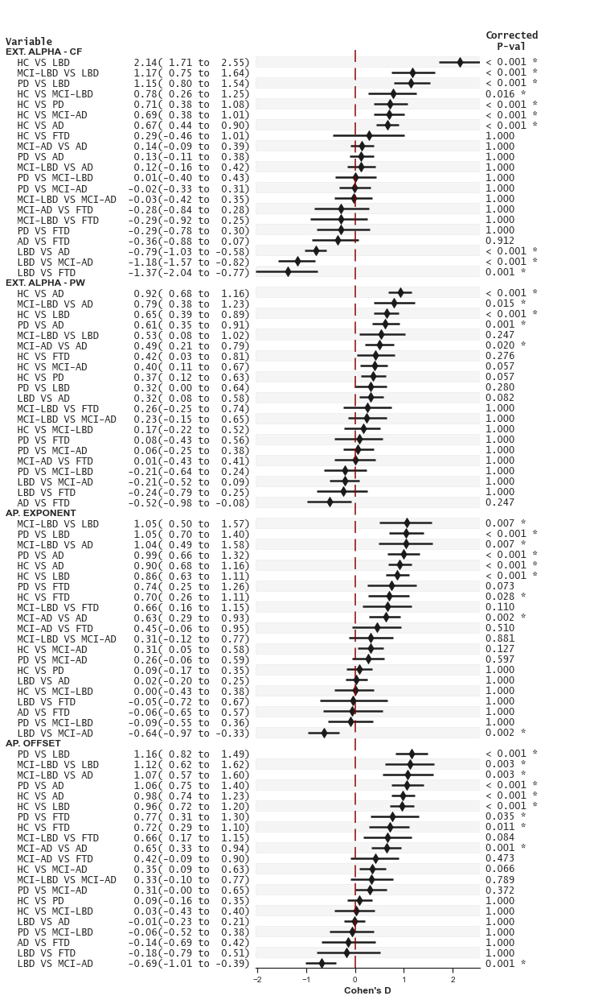

In [234]:
import forestplot as fp
sns.set_style('white')

fp.forestplot(combined_results.round(3),  # the dataframe with results data
            estimate="cohen",  # col containing estimated effect size 
            ll="ci_low", hl="ci_high",  # columns containing conf. int. lower and higher limits
            varlabel="Comparison",  # column containing variable label
            capitalize="upper",  # Capitalize labels
            groupvar="Feature",  # Add variable groupings 
            # group ordering
            group_order= ["Ext. Alpha - CF","Ext. Alpha - PW", "Ap. Exponent", "Ap. Offset"],
            sort=True,  # sort in ascending order (sorts within group if group is specified)               
            #pval="p-corr",  # Column of p-value to be reported on right
            decimal_precision = 2,
            color_alt_rows=True,  # Gray alternate rows
            figsize=(5,22),
            xlabel="Cohen's D",  # x-label title
            yticker2="p-corr",
            rightannote=["formatted_p"],  # columns to report on right of plot 
            right_annoteheaders=["Corrected\n  P-val"],  # ^corresponding headers
            **{"marker": "d",  # set maker symbol as diamond
                "markersize": 70,  # adjust marker size
                "markeralpha": 1,  # adjust marker size
                "markercolor": 'k',  # adjust marker size
                "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                "xlinecolor": "darkred",
                "xlinewidth": 1.5,
                "lw": 2.5,                
                "linecolor": "k", "despine":True}
            )

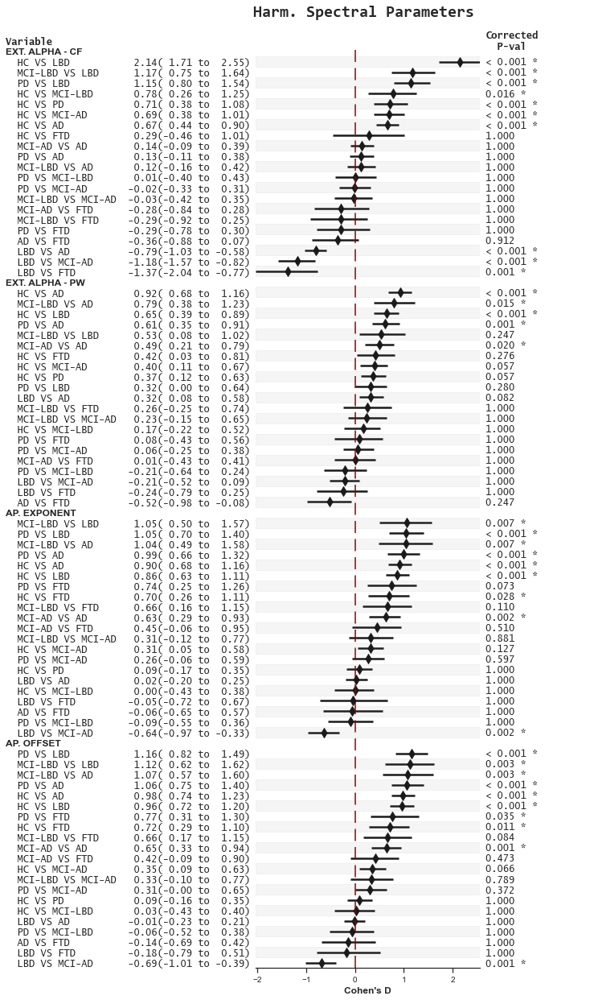

In [236]:
import forestplot as fp
import seaborn as sns

sns.set_style('white')

ax = fp.forestplot(
    combined_results.round(3),
    estimate="cohen",
    ll="ci_low", hl="ci_high",
    varlabel="Comparison",
    capitalize="upper",
    groupvar="Feature",
    group_order=["Ext. Alpha - CF", "Ext. Alpha - PW", "Ap. Exponent", "Ap. Offset"],
    sort=True,
    decimal_precision=2,
    color_alt_rows=True,
    figsize=(5, 22),
    xlabel="Cohen's D",
    yticker2="p-corr",
    rightannote=["formatted_p"],
    right_annoteheaders=["Corrected\n  P-val"],
    **{
        "marker": "d",
        "markersize": 70,
        "markeralpha": 1,
        "markercolor": 'k',
        "xlinestyle": (0, (10, 5)),
        "xlinecolor": "darkred",
        "xlinewidth": 1.5,
        "lw": 2.5,
        "linecolor": "k",
        "despine": True
    }
)

# Get the figure from the axes
fig = ax.figure
fig.suptitle('Harm. Spectral Parameters', fontsize=20, fontweight='bold', y=0.88, fontname='Consolas')

# Save the figure
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/forestplot_harm_specparams_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight' )

# Show it (optional)
plt.show()

In [ ]:
# FULL SINGLE-CELL: OVR logistic + bootstrap ROC CIs + 6x2 (ROC, legend)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from scipy import interpolate

# --------------------------
# CONFIG
# --------------------------
B = 2000                      # bootstrap resamples (reduce if slow; e.g., 200)
ALPHA = 0.05                 # 95% CI
FPR_GRID = np.linspace(0, 1, 201)
RANDOM_SEED = 2025
rng = np.random.default_rng(RANDOM_SEED)

colors = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
suptitles = ['Baseline', 'Ext. Alpha - CF', 'Ext. Alpha - PW', 'Ext. Alpha - BW', 'Aperiodic Exponent', 'Aperiodic Offset']

target = 'group'
classes = good_r_squared_df[target].unique()

sns.set(font="Consolas")
plt.rcParams["font.family"] = "Consolas"

# --------------------------
# Helper: fit your exact model and return scores
# --------------------------
def _fit_and_score(feature, y_true, data):
    """Fit your exact model and return predicted probabilities (scores)."""
    scaler = StandardScaler()
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})
        Xs = scaler.fit_transform(X)
    else:
        X = data[[feature]].copy()
        Xs = scaler.fit_transform(X)
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(Xs, y_true)
    return model.predict_proba(Xs)[:, 1]

# --------------------------
# Bootstrap ROC (refit per bootstrap)
# --------------------------
def calculate_adjusted_metrics_with_boot(feature, y_true, data, B=B, alpha=ALPHA):
    # Fit on full data
    scores = _fit_and_score(feature, y_true, data)
    fpr, tpr, _ = roc_curve(y_true, scores)
    auc_val = auc(fpr, tpr)

    # Bootstrap with refit
    n = len(y_true)
    tprs = []
    aucs = []
    for _ in range(B):
        idx = rng.integers(0, n, n)  # resample rows
        y_b = y_true.iloc[idx] if isinstance(y_true, pd.Series) else y_true[idx]
        d_b = data.iloc[idx]
        s_b = _fit_and_score(feature, y_b, d_b)
        fpr_b, tpr_b, _ = roc_curve(y_b, s_b)

        # Interpolate onto common FPR grid
        interp_fun = interpolate.interp1d(
            fpr_b, tpr_b, kind='linear', bounds_error=False, fill_value=(0, 1)
        )
        tprs.append(interp_fun(FPR_GRID))
        aucs.append(auc(fpr_b, tpr_b))

    tprs = np.asarray(tprs)
    lo = np.percentile(tprs, 100*alpha/2, axis=0)
    hi = np.percentile(tprs, 100*(1 - alpha/2), axis=0)
    auc_lo = np.percentile(aucs, 100*alpha/2)
    auc_hi = np.percentile(aucs, 100*(1 - alpha/2))

    return {
        'auc_roc': auc_val,
        'auc_ci': (auc_lo, auc_hi),
        'fpr': fpr,
        'tpr': tpr,
        'fpr_grid': FPR_GRID,
        'tpr_lo': lo,
        'tpr_hi': hi,
    }

# --------------------------
# Compute metrics for all (feature, class)
# --------------------------
harmonized_results = {}
for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics_with_boot(feature, y_true, good_r_squared_df, B=B, alpha=ALPHA)
        harmonized_results[feature][cls] = metrics

# --------------------------
# PLOT: 6x2 grid (ROC in col 1, legend in col 2)
# --------------------------
fig, axes = plt.subplots(len(features), 2, figsize=(10, 28), sharey='row',
                         gridspec_kw={'width_ratios':[1.5, 0.5]})

for i, (feature, title) in enumerate(zip(features, suptitles)):
    ax_roc = axes[i, 0]
    ax_leg = axes[i, 1]
    handles, labels = [], []

    for cls, color in zip(classes, colors):
        m = harmonized_results[feature][cls]
        h, = ax_roc.plot(
            m['fpr'], m['tpr'],
            label=f"{cls.upper()} (AUC={m['auc_roc']:.2f} [{m['auc_ci'][0]:.2f},{m['auc_ci'][1]:.2f}])",
            color=color, lw=2
        )
        ax_roc.fill_between(m['fpr_grid'], m['tpr_lo'], m['tpr_hi'], alpha=0.15, color=color)
        handles.append(h)
        labels.append(h.get_label())

    # Diagonal
    ax_roc.plot([0, 1], [0, 1], color='lightgray', linestyle='--', lw=2)
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.set_xlabel('1 - Specificity', fontsize=12)
    ax_roc.set_ylabel('Sensitivity', fontsize=12)
    ax_roc.set_title(title, fontsize=16, fontweight='bold')

    for spine in ax_roc.spines.values():
        spine.set_edgecolor('k')
    ax_roc.spines['top'].set_visible(False)
    ax_roc.spines['right'].set_visible(False)
    ax_roc.xaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.yaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.tick_params(direction="out", which='both', bottom=True, left=True, color='k', length=6)
    ax_roc.set_facecolor('white')

    # Legend (right column)
    ax_leg.axis('off')
    ax_leg.legend(handles, labels, loc='center', frameon=False, fontsize=16)

fig.text(0.5, 0.995, "Harm. Spectral Parameters (unadjusted)",
         ha='center', va='top', fontsize=20, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.98])

plt.show()

output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_8a_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')

In [ ]:
# FULL SINGLE-CELL: OVR logistic + bootstrap ROC CIs + 6x2 (ROC, legend)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from scipy import interpolate

# --------------------------
# CONFIG
# --------------------------
B = 2000                      # bootstrap resamples (reduce if slow; e.g., 200)
ALPHA = 0.05                 # 95% CI
FPR_GRID = np.linspace(0, 1, 201)
RANDOM_SEED = 2025
rng = np.random.default_rng(RANDOM_SEED)

colors = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
suptitles = ['Baseline', 'Ext. Alpha - CF', 'Ext. Alpha - PW', 'Ext. Alpha - BW', 'Aperiodic Exponent', 'Aperiodic Offset']

target = 'group'
classes = good_r_squared_df[target].unique()

sns.set(font="Consolas")
plt.rcParams["font.family"] = "Consolas"

# --------------------------
# Helper: fit your exact model and return scores
# --------------------------
def _fit_and_score(feature, y_true, data):
    """Fit your exact model and return predicted probabilities (scores)."""
    scaler = StandardScaler()
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})
        Xs = scaler.fit_transform(X)
    else:
        X = data[['age', 'gender', feature]].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        Xs = scaler.fit_transform(X)
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(Xs, y_true)
    return model.predict_proba(Xs)[:, 1]

# --------------------------
# Bootstrap ROC (refit per bootstrap)
# --------------------------
def calculate_adjusted_metrics_with_boot(feature, y_true, data, B=B, alpha=ALPHA):
    # Fit on full data
    scores = _fit_and_score(feature, y_true, data)
    fpr, tpr, _ = roc_curve(y_true, scores)
    auc_val = auc(fpr, tpr)

    # Bootstrap with refit
    n = len(y_true)
    tprs = []
    aucs = []
    for _ in range(B):
        idx = rng.integers(0, n, n)  # resample rows
        y_b = y_true.iloc[idx] if isinstance(y_true, pd.Series) else y_true[idx]
        d_b = data.iloc[idx]
        s_b = _fit_and_score(feature, y_b, d_b)
        fpr_b, tpr_b, _ = roc_curve(y_b, s_b)

        # Interpolate onto common FPR grid
        interp_fun = interpolate.interp1d(
            fpr_b, tpr_b, kind='linear', bounds_error=False, fill_value=(0, 1)
        )
        tprs.append(interp_fun(FPR_GRID))
        aucs.append(auc(fpr_b, tpr_b))

    tprs = np.asarray(tprs)
    lo = np.percentile(tprs, 100*alpha/2, axis=0)
    hi = np.percentile(tprs, 100*(1 - alpha/2), axis=0)
    auc_lo = np.percentile(aucs, 100*alpha/2)
    auc_hi = np.percentile(aucs, 100*(1 - alpha/2))

    return {
        'auc_roc': auc_val,
        'auc_ci': (auc_lo, auc_hi),
        'fpr': fpr,
        'tpr': tpr,
        'fpr_grid': FPR_GRID,
        'tpr_lo': lo,
        'tpr_hi': hi,
    }

# --------------------------
# Compute metrics for all (feature, class)
# --------------------------
harmonized_results = {}
for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics_with_boot(feature, y_true, good_r_squared_df, B=B, alpha=ALPHA)
        harmonized_results[feature][cls] = metrics

# --------------------------
# PLOT: 6x2 grid (ROC in col 1, legend in col 2)
# --------------------------
fig, axes = plt.subplots(len(features), 2, figsize=(10, 28), sharey='row',
                         gridspec_kw={'width_ratios':[1.5, 0.5]})

for i, (feature, title) in enumerate(zip(features, suptitles)):
    ax_roc = axes[i, 0]
    ax_leg = axes[i, 1]
    handles, labels = [], []

    for cls, color in zip(classes, colors):
        m = harmonized_results[feature][cls]
        h, = ax_roc.plot(
            m['fpr'], m['tpr'],
            label=f"{cls.upper()} (AUC={m['auc_roc']:.2f} [{m['auc_ci'][0]:.2f},{m['auc_ci'][1]:.2f}])",
            color=color, lw=2
        )
        ax_roc.fill_between(m['fpr_grid'], m['tpr_lo'], m['tpr_hi'], alpha=0.15, color=color)
        handles.append(h)
        labels.append(h.get_label())

    # Diagonal
    ax_roc.plot([0, 1], [0, 1], color='lightgray', linestyle='--', lw=2)
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.set_xlabel('1 - Specificity', fontsize=12)
    ax_roc.set_ylabel('Sensitivity', fontsize=12)
    ax_roc.set_title(title, fontsize=16, fontweight='bold')

    for spine in ax_roc.spines.values():
        spine.set_edgecolor('k')
    ax_roc.spines['top'].set_visible(False)
    ax_roc.spines['right'].set_visible(False)
    ax_roc.xaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.yaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.tick_params(direction="out", which='both', bottom=True, left=True, color='k', length=6)
    ax_roc.set_facecolor('white')

    # Legend (right column)
    ax_leg.axis('off')
    ax_leg.legend(handles, labels, loc='center', frameon=False, fontsize=16)

fig.text(0.5, 0.995, "Harm. Spectral Parameters (age + sex adjusted)",
         ha='center', va='top', fontsize=20, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.98])
plt.show()


output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_8b_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')



# Figure 8

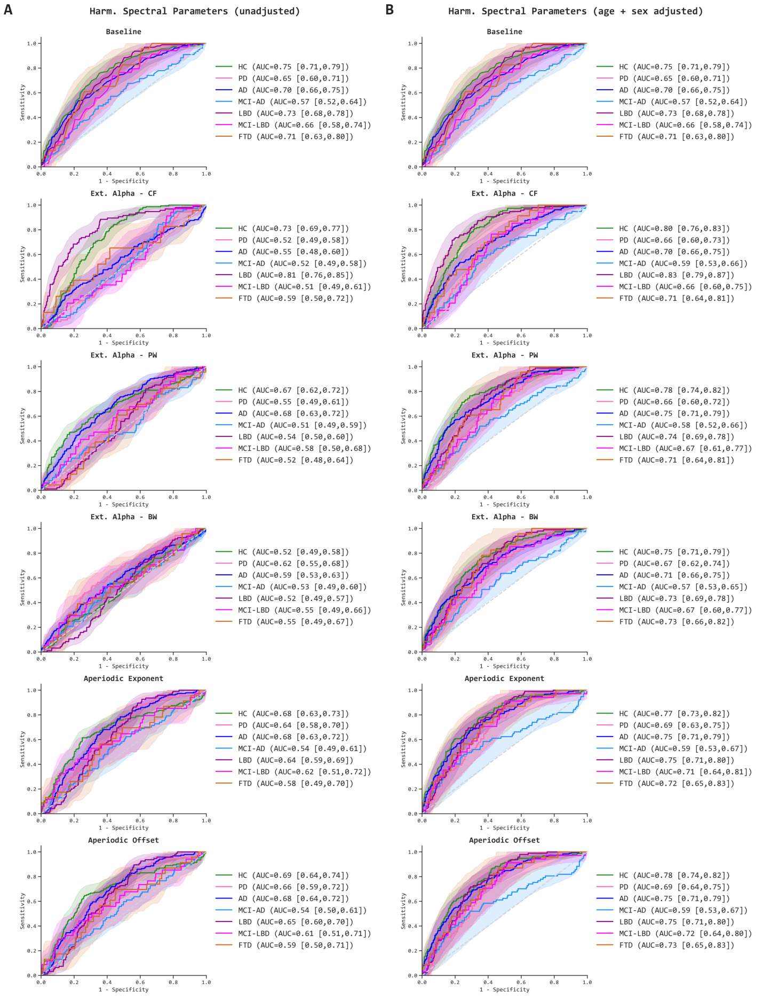

In [239]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_8a_knee.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_8b_knee.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(1, 2, figsize=(20, 28.5))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.01, 1, annotations[i], transform=ax.transAxes,
            fontsize=30, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots

plt.tight_layout()
plt.subplots_adjust(hspace=0.001)

plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/fig_8_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')



In [240]:
import seaborn as sns
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Define the features and target
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
target = 'group'
classes = good_r_squared_df[target].unique()  # Use unharmonized data for classes

# Function to calculate metrics at the Youden index with adjustment for age, gender, and center
def calculate_adjusted_metrics(feature, y_true, data):
    scaler = StandardScaler()  # Initialize the scaler
    
    # Fit logistic regression model with age, gender, and center as covariates
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling

    else:
        X = data[['age', 'gender', feature]].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling

    # Fit the model
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X, y_true)
    y_scores = model.predict_proba(X)[:, 1]
    
    # Calculate ROC metrics
    feature_values = data[feature].values if feature != 'Baseline' else data['age'].values
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_roc = auc(fpr, tpr)
    youden_index = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[youden_index]
    cutoff = feature_values[youden_index]

    # Predict using the optimal threshold
    y_pred = (y_scores >= optimal_threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    lr_pos = sensitivity / (1 - specificity)
    lr_neg = (1 - sensitivity) / specificity
    
    return {
        'auc_roc': auc_roc,
        'cutoff': cutoff,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'ppv': ppv,
        'npv': npv,
        'accuracy': accuracy,
        'lr_pos': lr_pos,
        'lr_neg': lr_neg,
        'fpr': fpr,
        'tpr': tpr
    }

# Calculate the adjusted ROC curves for unharmonized results
harmonized_results_adjusted = {}

for feature in features:
    harmonized_results_adjusted[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics(feature, y_true, good_r_squared_df)
        harmonized_results_adjusted[feature][cls] = metrics



import seaborn as sns
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.preprocessing import StandardScaler


# Define the features and target
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
target = 'group'
classes = good_r_squared_df[target].unique()  # Use unharmonized data for classes

# Function to calculate metrics at the Youden index with adjustment for age, gender, and center
def calculate_adjusted_metrics(feature, y_true, data):
    scaler = StandardScaler()  # Initialize the scaler
    
    # Fit logistic regression model with age, gender, and center as covariates
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling
    else:
        X = data[[feature]].copy()
        X = scaler.fit_transform(X)  # Apply scaling

    # Fit the model
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X, y_true)
    y_scores = model.predict_proba(X)[:, 1]
    
    # Calculate ROC metrics
    feature_values = data[feature].values if feature != 'Baseline' else data['age'].values
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_roc = auc(fpr, tpr)
    youden_index = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[youden_index]
    cutoff = feature_values[youden_index]

    # Predict using the optimal threshold
    y_pred = (y_scores >= optimal_threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    lr_pos = sensitivity / (1 - specificity)
    lr_neg = (1 - sensitivity) / specificity
    
    return {
        'auc_roc': auc_roc,
        'cutoff': cutoff,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'ppv': ppv,
        'npv': npv,
        'accuracy': accuracy,
        'lr_pos': lr_pos,
        'lr_neg': lr_neg,
        'fpr': fpr,
        'tpr': tpr
    }

# Calculate the adjusted ROC curves for unharmonized results
harmonized_results = {}

for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics(feature, y_true, good_r_squared_df)
        harmonized_results[feature][cls] = metrics

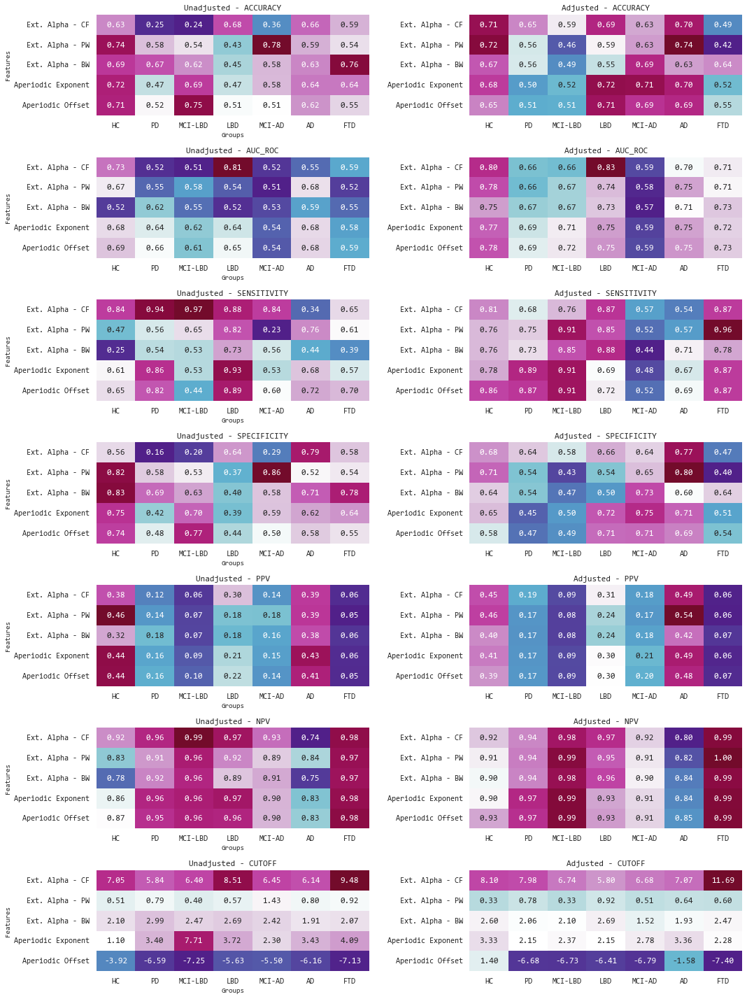

In [241]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define features and groups
features = ['extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
groups = ['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD']
metrics_to_plot = ['accuracy', 'auc_roc', 'sensitivity', 'specificity', 'ppv', 'npv', 'cutoff']

# Prettify feature and group labels
feature_labels = {
    'extalphas_cf': 'Ext. Alpha - CF',
    'extalphas_pw': 'Ext. Alpha - PW',
    'extalphas_bw': 'Ext. Alpha - BW',
    'exponent': 'Aperiodic Exponent',
    'offset': 'Aperiodic Offset',
}
group_labels = {group: group.upper() for group in groups}

# Create a function to aggregate results for heatmap
def aggregate_metrics(results, features, groups, metrics):
    heatmap_data = {metric: pd.DataFrame(index=features, columns=groups) for metric in metrics}
    for feature in features:
        for group in groups:
            metrics_dict = results[feature][group]
            for metric in metrics:
                heatmap_data[metric].loc[feature, group] = metrics_dict[metric]
    return heatmap_data

# Aggregate results for unadjusted and adjusted
unadjusted_heatmap_data = aggregate_metrics(harmonized_results, features, groups, metrics_to_plot)
adjusted_heatmap_data = aggregate_metrics(harmonized_results_adjusted, features, groups, metrics_to_plot)

# Plot the heatmaps
fig, axes = plt.subplots(len(metrics_to_plot), 2, figsize=(15, 20))#, sharex=True)

for i, metric in enumerate(metrics_to_plot):
    # Unadjusted heatmap
    sns.heatmap(
        unadjusted_heatmap_data[metric].astype(float).rename(index=feature_labels, columns=group_labels),
        annot=True,
        fmt=".2f",
        cmap=cmap,
        cbar=False,
        ax=axes[i, 0]
    )
    axes[i, 0].set_title(f"Unadjusted - {metric.upper()}", fontsize=12)
    axes[i, 0].set_ylabel("Features", fontsize=10)
    axes[i, 0].set_xlabel("Groups", fontsize=10)

    # Adjusted heatmap
    sns.heatmap(
        adjusted_heatmap_data[metric].astype(float).rename(index=feature_labels, columns=group_labels),
        annot=True,
        fmt=".2f",
        cmap=cmap,
        cbar=False,
        ax=axes[i, 1]
    )
    axes[i, 1].set_title(f"Adjusted - {metric.upper()}", fontsize=12)
    axes[i, 1].set_ylabel(" ", fontsize=10)
    axes[i, 1].set_xlabel(" ", fontsize=10)
    axes[i, 1].grid('off')

plt.tight_layout()
plt.show()

# Mean Differences Specparams

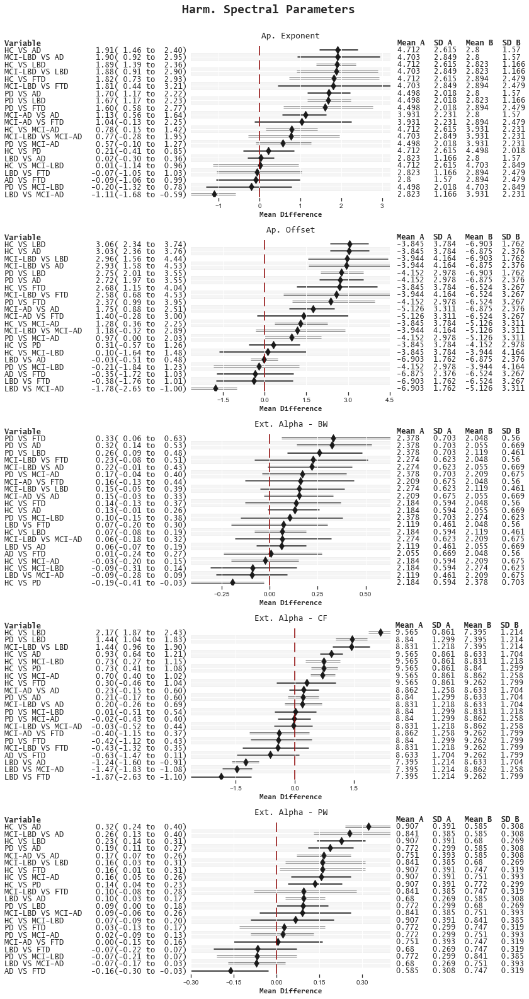

In [242]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pingouin as pg
import forestplot as fp

# Define features and groups
features = ["extalphas_cf", "extalphas_pw", "extalphas_bw", "exponent", "offset"]
groups = ['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD']

# Define the weighted mean difference function
def mean_difference(x, y):
    return np.mean(x) - np.mean(y)

# Function to calculate pairwise comparisons with bootstrapped confidence intervals
def calculate_mean_difference_with_bootstrap(data, feature, group, alpha=0.05, seed=42, n_boot=2000):
    groups = data[group].cat.categories
    results = []

    for i, g1 in enumerate(groups):
        for g2 in groups[i + 1:]:
            x = data.loc[data[group] == g1, feature].dropna().values.round(3)
            y = data.loc[data[group] == g2, feature].dropna().values.round(3)

            # Compute weighted mean difference
            mean_diff = mean_difference(x, y)

            # Compute bootstrapped confidence intervals
            ci = pg.compute_bootci(
                x=x, y=y, func=mean_difference, n_boot=n_boot,
                confidence=1 - alpha, seed=seed
            )

            # Collect mean and standard deviation for both groups
            results.append({
                "A": g1,
                "B": g2,
                "mean_diff": mean_diff,
                "mean_ci_low": ci[0],
                "mean_ci_high": ci[1],
                "mean_A": np.mean(x),
                "sd_A": np.std(x),
                "mean_B": np.mean(y),
                "sd_B": np.std(y)
            })

    return pd.DataFrame(results)

# Prepare the dataset
good_r_squared_df['group'] = pd.Categorical(good_r_squared_df['group'], categories=groups, ordered=True)

# Collect results for all features
results = []
for feature in features:
    feature_results = calculate_mean_difference_with_bootstrap(good_r_squared_df, feature, "group")
    feature_results["Feature"] = feature
    results.append(feature_results)

# Combine all feature results
combined_results = pd.concat(results, ignore_index=True)

# Rename Features for the Forest Plot
combined_results["Feature"] = combined_results["Feature"].replace({
    "extalphas_cf": "Ext. Alpha - CF",
    "extalphas_pw": "Ext. Alpha - PW",
    "extalphas_bw": "Ext. Alpha - BW",
    "exponent": "Ap. Exponent",
    "offset": "Ap. Offset"
})

# Create Comparison Column
combined_results["Comparison"] = combined_results["A"] + " vs " + combined_results["B"]

# Subdivide results by feature
feature_dfs = {feature: df for feature, df in combined_results.groupby("Feature")}

# Create a 2x2 grid for forest plots
fig, axes = plt.subplots(5, 1, figsize=(12, 22))
axes = axes.flatten()
sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"

for ax, (feature, feature_df) in zip(axes, feature_dfs.items()):
    fp.forestplot(
        feature_df.round(3),
        estimate="mean_diff",
        ll="mean_ci_low",
        hl="mean_ci_high",
        decimal_precision=2,
        color_alt_rows=True,
        varlabel="Comparison",
        sort=True,
        rightannote=["mean_A", "sd_A", "mean_B", "sd_B"],
        right_annoteheaders=["Mean A", "SD A", "Mean B", "SD B"],
        ax=ax,
        xlabel="Mean Difference",
        capitalize="upper",  # Capitalize labels
        title = feature,
        **{
            "marker": "d",
            "markersize": 70,
            "markeralpha": 1,
            "markercolor": 'k',
            
            "xlinestyle": (0, (10, 5)),
            "xlinecolor": "darkred",
            "xlinewidth": 1.5,
            "lw": 2.5,
            "linecolor": "k" }
    )
    ax.set_title(feature, fontsize=14)
    ax.set_facecolor('white')
# Remove unused axes if fewer features than grid slots
for ax in axes[len(feature_dfs):]:
    ax.axis('off')
    ax.grid(False)  # Turn off the grid


fig.suptitle('Harm. Spectral Parameters', fontsize=20, fontweight='bold', y=1, fontname='Consolas')

plt.tight_layout()
plt.show()


# Sensitivity Analysis

# FOOOF on unharmonized psd

In [257]:
import pandas as pd
import numpy as np
from fooof import FOOOF
from fooof.bands import Bands
from fooof.analysis import get_band_peak_fm, compute_pointwise_error_fm

# Initialize lists to store the data
features_list = []
fooof_params_list = []

# Define frequency range and bands
freqs = np.unique(unharm_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)  # Boolean mask for desired frequency range
freqs = freqs[freq_mask]  # Reindex freqs to keep only 3-30 Hz

freq_range = [3, 30]
bands = Bands({'extalpha': [5, 14], 'beta': [13, 30]})

# Iterate over each row in the pivoted DataFrame
for idx, row in pivot_psd.iterrows():
    participant_id = row['participant_id']
    center = row['center']
    group = row['group']
    age = row['age']
    gender = row['gender']
    
    # Retrieve PSD and frequency values
    psd_log10 = row[5:].values  # Assuming PSD values start from the 6th column
    psd_log10 = psd_log10[freq_mask]  # Apply mask to psds 
    # Convert log10 scaled PSD back to linear space for FOOOF
    psd_linear = np.power(10, psd_log10)
    psd_linear = psd_linear  # Apply mask to psds 


    # Check and handle any NaNs or Infs in the linear PSD data
    #psd_linear = np.nan_to_num(psd_linear, nan=1e-10, posinf=1e-10, neginf=1e-10)

    # Initialize and fit the FOOOF model
    fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6, aperiodic_mode = 'knee')
    fm.fit(freqs, psd_linear, freq_range)


    psd_fit = fm.fooofed_spectrum_
    ap_fit = fm._ap_fit
    spect_flat = fm._spectrum_flat
    aperiodic = fm._spectrum_peak_rm

    if psd_fit is not None:
        errs_fm = compute_pointwise_error_fm(fm, plot_errors=False, return_errors=True)

        for i, freq in enumerate(freqs):  # Iterate over reindexed freqs
            features_dict = {
                'participant_id': participant_id,
                'center': center,
                'group': group,
                'age': age,
                'gender': gender,
                'frequency': freq,
                'psd': np.log10(psd_linear[i]),
                'psd_fit': psd_fit[i],
                'osc': spect_flat[i],
                'osc_fit': fm._peak_fit[i],
                'ap': aperiodic[i],
                'ap_fit': ap_fit[i],
                'error_fm': errs_fm[i]  # <- ADDING pointwise error here
            }
            features_list.append(features_dict)
        
        # Extract specific parameters
        betas = get_band_peak_fm(fm, bands.beta)
        extalphas = get_band_peak_fm(fm, bands.extalpha)
        aperiodic_params = fm.get_params('aperiodic_params')
        fit_params = [fm.get_params('r_squared'), fm.get_params('error')]

        fooof_params_dict = {
            'participant_id': participant_id,
            'center': center,
            'group': group,
            'age': age,
            'gender': gender,
            'beta_cf': betas[0],
            'beta_pw': betas[1],
            'beta_bw': betas[2],
            'extalphas_cf': extalphas[0],
            'extalphas_pw': extalphas[1],
            'extalphas_bw': extalphas[2],
            'exponent': aperiodic_params[2],
            'offset': aperiodic_params[0],
            'r_squared': fit_params[0],
            'error': fit_params[1]}
        fooof_params_list.append(fooof_params_dict)

# Create DataFrames from the lists
features_df = pd.DataFrame(features_list)
fooof_params_df = pd.DataFrame(fooof_params_list)

# PLOT FOOOF ERROR AND R-SQUARED

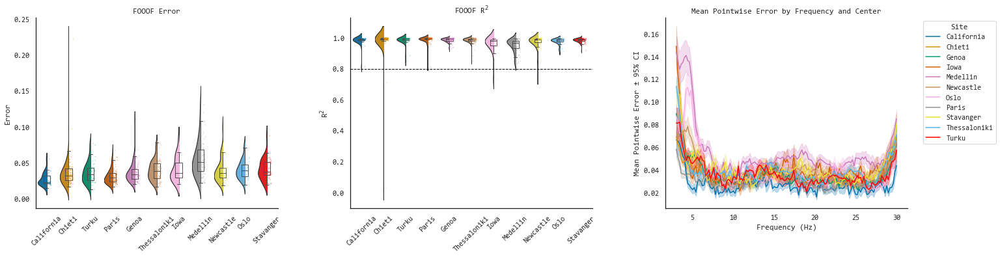

In [250]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style('white')
sns.set(font="Consolas")

# Color palette
colorblind_palette = sns.color_palette("colorblind")
colorblind11_palette = colorblind_palette + [(1.0, 0.0, 0.0)] + [(1.0, 0.0, 0.0)]  # Add reds for > 10 centers
palette = colorblind11_palette

# Create frequency-wise error DataFrame from features_df
errors_df = features_df[['participant_id', 'center', 'frequency', 'error_fm']].copy()

# Start figure with 3 subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))

### === Subplot 1: Violin plot for "error" === ###
ax1 = axes[0]
sns.violinplot(x="center", y="error", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax1)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="error", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)
sns.stripplot(x="center", y="error", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.25, size=2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
ax1.set_title("FOOOF Error")
ax1.set_xlabel("")
ax1.set_ylabel("Error")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.grid(False)
ax1.set_facecolor('white')
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

### === Subplot 2: Violin plot for "r_squared" === ###
ax2 = axes[1]
sns.violinplot(x="center", y="r_squared", data=fooof_params_df, hue="center", dodge=False,
               palette=palette, scale="width", inner=None, ax=ax2)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(x="center", y="r_squared", data=fooof_params_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax2)

old_len_collections = len(ax2.collections)
sns.stripplot(x="center", y="r_squared", data=fooof_params_df, hue="center", palette=palette, dodge=False, ax=ax2,
              alpha=0.25, size=2)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax2.set_xlim(xlim2)
ax2.set_ylim(ylim2)
ax2.set_title("FOOOF R$^2$")
ax2.set_xlabel("")
ax2.set_ylabel("R$^2$")
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.axhline(y=0.8, color='black', linestyle='--', linewidth=1)
ax2.grid(False)
ax2.set_facecolor('white')
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

### === Subplot 3: Lineplot of freq-by-freq error per participant === ###
# ax3 = axes[2]

# # Plot one line per participant colored by "center"
# for pid, grp in errors_df.groupby("participant_id"):
#     center = grp["center"].iloc[0]
#     center_idx = sorted(errors_df["center"].unique()).index(center)
#     color = palette[center_idx % len(palette)]
#     ax3.plot(grp["frequency"], grp["error_fm"], alpha=0.1, linewidth=0.5, color=color)

# ax3.set_title("FOOOF Pointwise Error by Frequency")
# ax3.set_xlabel("Frequency (Hz)")
# ax3.set_ylabel("Pointwise Error")
# ax3.grid(True)
# ax3.set_facecolor('white')
# for spine in ax3.spines.values():
#     spine.set_edgecolor('k')
#     ax3.spines['top'].set_visible(False)
#     ax3.spines['right'].set_visible(False)

# === Subplot 3: Mean + Dispersion of freq-by-freq error per center ===
ax3 = axes[2]

# Compute mean and standard deviation of error per center and frequency
summary_df = (
    errors_df
    .groupby(['center', 'frequency'])
    .agg(mean_error=('error_fm', 'mean'),
         std_error=('error_fm', 'std'),
         n=('error_fm', 'count'))
    .reset_index()
)
summary_df['sem'] = summary_df['std_error'] / np.sqrt(summary_df['n'])  # Standard Error of Mean
summary_df['ci95'] = 1.96 * summary_df['sem']  # 95% confidence interval

# Plot one line per center with shaded CI
for i, (center, group_df) in enumerate(summary_df.groupby('center')):
    color = palette[i % len(palette)]
    ax3.plot(group_df['frequency'], group_df['mean_error'], label=center, color=color)
    ax3.fill_between(group_df['frequency'],
                     group_df['mean_error'] - group_df['sem'],
                     group_df['mean_error'] + group_df['sem'],
                     color=color, alpha=0.25)

ax3.set_title("Mean Pointwise Error by Frequency and Center")
ax3.set_xlabel("Frequency (Hz)")
ax3.set_ylabel("Mean Pointwise Error ± 95% CI")
ax3.grid(True)
ax3.set_facecolor('white')

# Clean up axes
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)

# Optional: add legend
ax3.legend(title="Site", bbox_to_anchor=(1.05, 1), loc='upper left', facecolor='white')


### === Final touch === ###
plt.subplots_adjust(wspace=0.3, bottom=0.2)
plt.show()


# Compare knee vs. fixed Errors

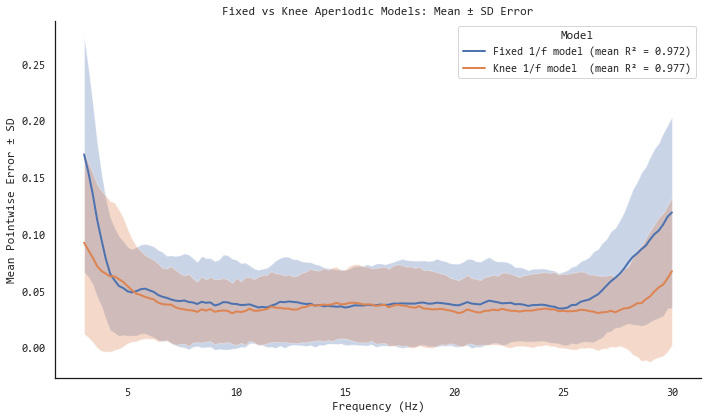

In [251]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF
from fooof.analysis import compute_pointwise_error_fm

# --- Styling ---
plt.rcParams['font.family']      = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize']   = 16
plt.rcParams['axes.labelsize']   = 14
plt.rcParams['xtick.labelsize']  = 12
plt.rcParams['ytick.labelsize']  = 12
sns.set_style('white')
sns.set(font="Consolas")

# --- Frequency selection ---
freqs = np.unique(unharm_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Compute errors and R² ---
errors = []
r2_fixed = []
r2_knee = []

for _, row in pivot_psd.iterrows():
    psd_log10 = row[5:].values[freq_mask]
    psd_linear = np.power(10, psd_log10)


    # Fixed model
    fm_fixed = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1, 8],
                     min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    r2_fixed.append(fm_fixed.r_squared_)
    err_fixed = compute_pointwise_error_fm(fm_fixed, plot_errors=False, return_errors=True)

    # Knee model
    fm_knee = FOOOF(aperiodic_mode='knee', peak_width_limits=[1, 8],
                    min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    r2_knee.append(fm_knee.r_squared_)
    err_knee = compute_pointwise_error_fm(fm_knee, plot_errors=False, return_errors=True)

    for f, ef, ek in zip(freqs, err_fixed, err_knee):
        errors.append({'frequency': f,
                       'error_fixed': ef,
                       'error_knee': ek})

errors_df = pd.DataFrame(errors)

# Compute summary statistics
summary = (errors_df
           .groupby('frequency')
           .agg(mean_fixed=('error_fixed', 'mean'),
                std_fixed=('error_fixed', 'std'),
                mean_knee=('error_knee', 'mean'),
                std_knee=('error_knee', 'std'))
           .reset_index())

# Compute mean R² for legend
mean_r2_fixed = np.mean(r2_fixed)
mean_r2_knee  = np.mean(r2_knee)

# --- Plot ---
plt.figure(figsize=(10, 6))

label_fixed = f"Fixed 1/f model (mean R² = {mean_r2_fixed:.3f})"
label_knee  = f"Knee 1/f model  (mean R² = {mean_r2_knee:.3f})"

plt.plot(summary['frequency'], summary['mean_fixed'], label=label_fixed, linewidth=2)
plt.fill_between(summary['frequency'],
                 summary['mean_fixed'] - summary['std_fixed'],
                 summary['mean_fixed'] + summary['std_fixed'],
                 alpha=0.3)

plt.plot(summary['frequency'], summary['mean_knee'], label=label_knee, linewidth=2)
plt.fill_between(summary['frequency'],
                 summary['mean_knee'] - summary['std_knee'],
                 summary['mean_knee'] + summary['std_knee'],
                 alpha=0.3)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Mean Pointwise Error ± SD')
plt.title('Fixed vs Knee Aperiodic Models: Mean ± SD Error')
plt.legend(title='Model', facecolor='white')
#plt.axhline(0, color='grey', linestyle='--', linewidth=1)
plt.gca().set_facecolor('white')

# Clean up axes
for spine in plt.gca().spines.values():
    spine.set_edgecolor('k')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


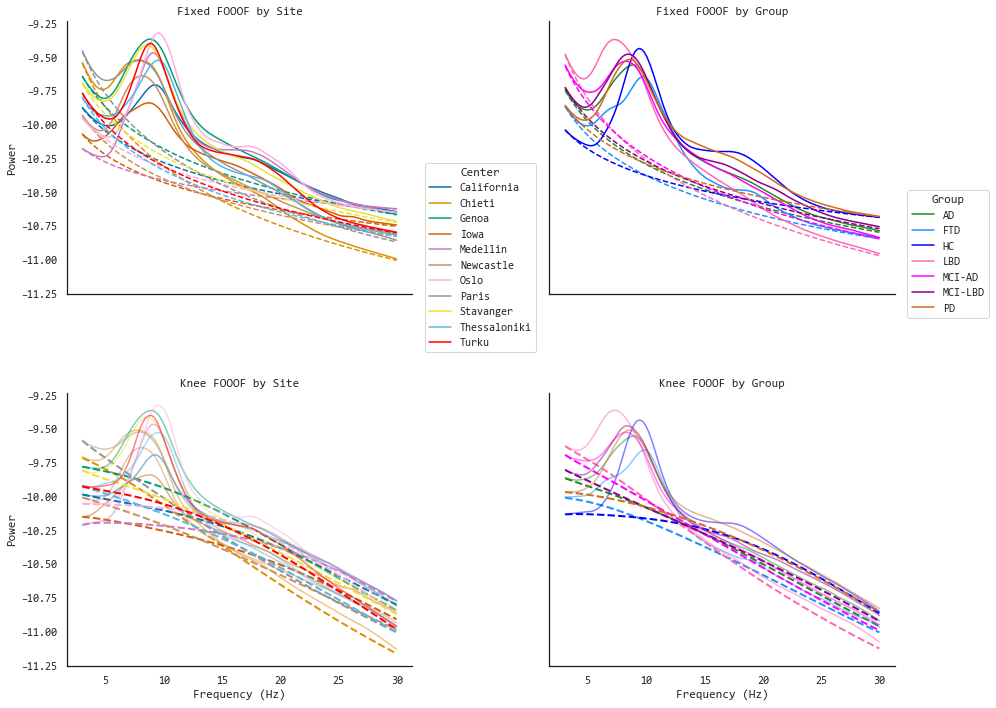

In [252]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF

# --- Styling ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')
sns.set(font="Consolas")

# --- Frequency selection ---
freqs = np.unique(unharm_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Collect psd_fit and ap_fit for fixed and knee models ---
fixed_rows = []
knee_rows  = []

for _, row in pivot_psd.iterrows():
    center = row['center']
    group  = row['group']
    psd_log10 = row[5:].values[freq_mask]
    psd_linear = 10 ** psd_log10

    # Fixed model
    fm_fixed = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1,8],
                     min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    psd_fit_fixed = fm_fixed.fooofed_spectrum_
    ap_fit_fixed  = fm_fixed._ap_fit

    # Knee model
    fm_knee = FOOOF(aperiodic_mode='knee', peak_width_limits=[1,8],
                    min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    psd_fit_knee = fm_knee.fooofed_spectrum_
    ap_fit_knee  = fm_knee._ap_fit

    # Store values per frequency
    for f, pff, aff, pfk, afk in zip(freqs, psd_fit_fixed, ap_fit_fixed,
                                     psd_fit_knee,  ap_fit_knee):
        fixed_rows.append({'center': center, 'group': group,
                           'frequency': f, 'psd_fit': pff, 'ap_fit': aff})
        knee_rows .append({'center': center, 'group': group,
                           'frequency': f, 'psd_fit': pfk, 'ap_fit': afk})

fixed_df = pd.DataFrame(fixed_rows)
knee_df  = pd.DataFrame(knee_rows)

# --- Compute mean per center and per group ---
mean_fixed_center = fixed_df.groupby(['center','frequency'])[['psd_fit','ap_fit']].mean().reset_index()
mean_fixed_group  = fixed_df.groupby(['group','frequency']) [['psd_fit','ap_fit']].mean().reset_index()
mean_knee_center  = knee_df.groupby (['center','frequency'])[['psd_fit','ap_fit']].mean().reset_index()
mean_knee_group   = knee_df.groupby (['group','frequency']) [['psd_fit','ap_fit']].mean().reset_index()

# --- Plotting ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
pal_c = colorblind11_palette #sns.color_palette('colorblind', n_colors=mean_fixed_center['center'].nunique())
pal_g = ['forestgreen', 'dodgerblue', 'blue', 'hotpink', 'fuchsia', 'darkmagenta', 'chocolate']#sns.color_palette('colorblind11', n_colors=mean_fixed_group['group'] .nunique())

# Row 0: Fixed model
ax0, ax1 = axes[0]
for i, ctr in enumerate(mean_fixed_center['center'].unique()):
    dfc = mean_fixed_center[mean_fixed_center['center']==ctr]
    ax0.plot(dfc['frequency'], dfc['psd_fit'], label=ctr, color=pal_c[i])
    ax0.plot(dfc['frequency'], dfc['ap_fit'],  linestyle='--', color=pal_c[i])
ax0.set_title('Fixed FOOOF by Site')
ax0.set_ylabel('Power')
ax0.legend(title='Center', bbox_to_anchor=(1.02,0.5), loc='upper left', facecolor='white')
ax0.grid(False)
ax0.set_facecolor('white')
# Clean up axes
for spine in ax0.spines.values():
    spine.set_edgecolor('k')
    ax0.spines['top'].set_visible(False)
    ax0.spines['right'].set_visible(False)

for i, grp in enumerate(mean_fixed_group['group'].unique()):
    dfg = mean_fixed_group[mean_fixed_group['group']==grp]
    ax1.plot(dfg['frequency'], dfg['psd_fit'], label=grp, color=pal_g[i])
    ax1.plot(dfg['frequency'], dfg['ap_fit'],  linestyle='--', color=pal_g[i])
ax1.set_title('Fixed FOOOF by Group')
ax1.legend(title='Group', bbox_to_anchor=(1.02,0.4), loc='upper left', facecolor='white')
ax1.grid(False)
ax1.set_facecolor('white')
# Clean up axes
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)



# Row 1: Knee model
ax2, ax3 = axes[1]
for i, ctr in enumerate(mean_knee_center['center'].unique()):
    dfc = mean_knee_center[mean_knee_center['center']==ctr]
    ax2.plot(dfc['frequency'], dfc['psd_fit'], label=ctr, color=pal_c[i], alpha = 0.5)
    ax2.plot(dfc['frequency'], dfc['ap_fit'],  linestyle='--', color=pal_c[i], alpha = 1, lw = 2)
ax2.set_title('Knee FOOOF by Site')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Power')
ax2.grid(False)
ax2.set_facecolor('white')
# Clean up axes
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)



for i, grp in enumerate(mean_knee_group['group'].unique()):
    dfg = mean_knee_group[mean_knee_group['group']==grp]
    ax3.plot(dfg['frequency'], dfg['psd_fit'], label=grp, color=pal_g[i], alpha = 0.5)
    ax3.plot(dfg['frequency'], dfg['ap_fit'],  linestyle='--', color=pal_g[i], alpha = 1, lw = 2)
ax3.set_title('Knee FOOOF by Group')
ax3.set_xlabel('Frequency (Hz)')
ax3.grid(False)
ax3.set_facecolor('white')

# Clean up axes
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

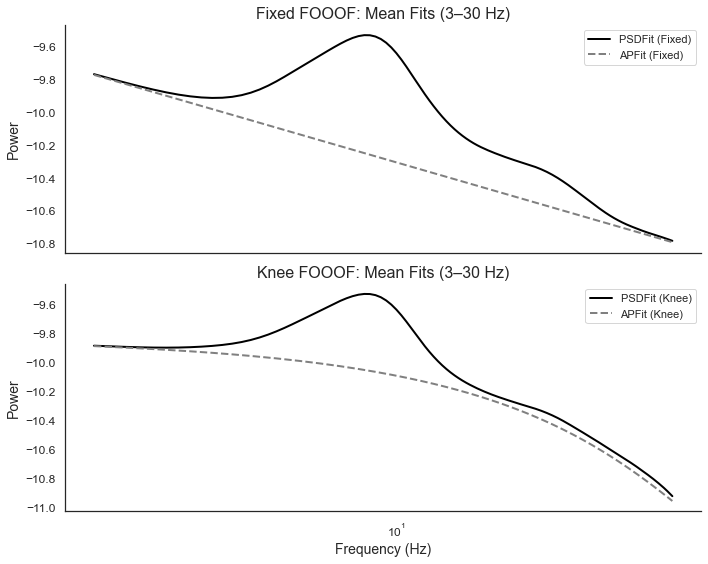

In [253]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF

# --- Styling ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')

# --- Frequency selection ---
freqs = np.unique(unharm_psd['frequency'])
freq_mask = (freqs >= 3) & (freqs <= 30)
freqs = freqs[freq_mask]
freq_range = [3, 30]

# --- Collect psd_fit and ap_fit for fixed and knee models ---
fixed_rows = []
knee_rows  = []

for _, row in pivot_psd.iterrows():
    psd_log10   = row[5:].values[freq_mask]
    psd_linear  = 10 ** psd_log10

    # Fixed model
    fm_fixed    = FOOOF(aperiodic_mode='fixed', peak_width_limits=[1,8],
                        min_peak_height=0.05, max_n_peaks=6)
    fm_fixed.fit(freqs, psd_linear, freq_range)
    psd_fit_f   = fm_fixed.fooofed_spectrum_
    ap_fit_f    = fm_fixed._ap_fit

    # Knee model
    fm_knee     = FOOOF(aperiodic_mode='knee', peak_width_limits=[1,8],
                        min_peak_height=0.05, max_n_peaks=6)
    fm_knee.fit(freqs, psd_linear, freq_range)
    psd_fit_k   = fm_knee.fooofed_spectrum_
    ap_fit_k    = fm_knee._ap_fit

    # Store values
    fixed_rows.extend([{'frequency': f, 'psd_fit': pf, 'ap_fit': af}
                       for f, pf, af in zip(freqs, psd_fit_f, ap_fit_f)])
    knee_rows.extend ([{'frequency': f, 'psd_fit': pk, 'ap_fit': ak}
                       for f, pk, ak in zip(freqs, psd_fit_k, ap_fit_k)])

fixed_df = pd.DataFrame(fixed_rows)
knee_df  = pd.DataFrame(knee_rows)

# --- Compute overall mean psd_fit and ap_fit across all subjects ---
summary_fixed = fixed_df.groupby('frequency')[['psd_fit','ap_fit']].mean().reset_index()
summary_knee  = knee_df.groupby ('frequency')[['psd_fit','ap_fit']].mean().reset_index()

# --- Plotting ---
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# (1) Fixed FOOOF overall
ax = axes[0]
ax.plot(summary_fixed['frequency'], summary_fixed['psd_fit'],
        label='PSDFit (Fixed)', linewidth=2, color='black')
ax.plot(summary_fixed['frequency'], summary_fixed['ap_fit'],
        label='APFit (Fixed)', linestyle='--', linewidth=2, color='gray')
ax.set_ylabel('Power')
ax.set_title('Fixed FOOOF: Mean Fits (3–30 Hz)')
ax.legend()
sns.despine(ax=ax)

# (2) Knee FOOOF overall
ax = axes[1]
ax.plot(summary_knee['frequency'], summary_knee['psd_fit'],
        label='PSDFit (Knee)', linewidth=2, color='black')
ax.plot(summary_knee['frequency'], summary_knee['ap_fit'],
        label='APFit (Knee)', linestyle='--', linewidth=2, color='gray')
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('Power')
ax.set_title('Knee FOOOF: Mean Fits (3–30 Hz)')
ax.legend()
ax.set_xscale('log')

sns.despine(ax=ax)

plt.tight_layout()
plt.show()


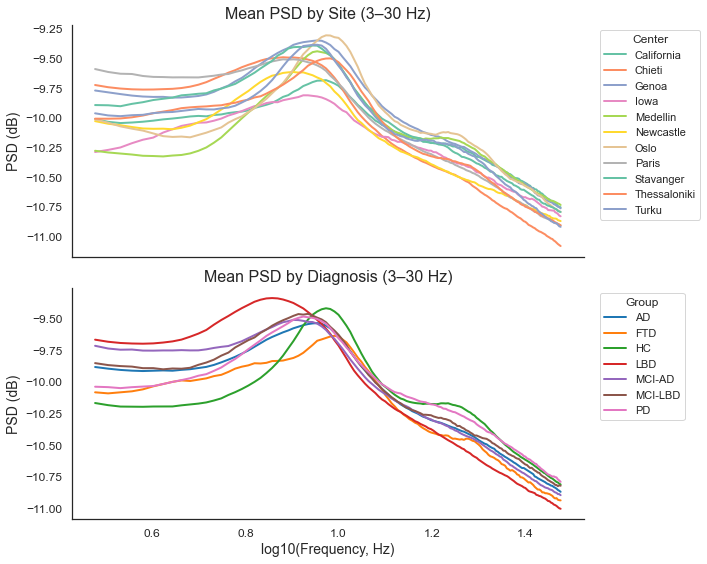

In [254]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Set Consolas (or fallback) font and style ---
plt.rcParams['font.family']    = ['Consolas', 'Courier New', 'monospace']
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style('white')

# --- Melt PSD data into long form ---
id_vars = ['participant_id', 'center', 'group']
feature_cols = [c for c in pivot_psd.columns if c.startswith('psd_freq')]
psd_long = pivot_psd.melt(
    id_vars=id_vars,
    value_vars=feature_cols,
    var_name='frequency',
    value_name='psd_db'
)
# Extract numeric frequency from column names and convert to float
psd_long['frequency'] = (
    psd_long['frequency']
    .str.extract(r'([0-9]*\.?[0-9]+)')
    .astype(float)
)

# --- Filter to 3–30 Hz BEFORE log transform ---
psd_long = psd_long[(psd_long['frequency'] >= 3) & (psd_long['frequency'] <= 30)].copy()

# Compute log10 frequency
psd_long['logf'] = np.log10(psd_long['frequency'])

# --- Compute mean PSD per frequency for each site and each group ---
mean_center = (
    psd_long
    .groupby(['center', 'logf'])['psd_db']
    .mean()
    .reset_index()
)
mean_group = (
    psd_long
    .groupby(['group', 'logf'])['psd_db']
    .mean()
    .reset_index()
)

# --- Plotting ---
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# (1) Mean PSD by site
centers = sorted(mean_center['center'].unique())
palette_c = sns.color_palette('Set2', n_colors=len(centers))
for i, ctr in enumerate(centers):
    dfc = mean_center[mean_center['center'] == ctr]
    ax0.plot(dfc['logf'], dfc['psd_db'], label=ctr, color=palette_c[i], linewidth=2)
ax0.set_ylabel('PSD (dB)')
ax0.set_title('Mean PSD by Site (3–30 Hz)')
ax0.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.legend(title='Center', bbox_to_anchor=(1.02, 1), loc='upper left')

# (2) Mean PSD by diagnosis group
groups = sorted(mean_group['group'].unique())
palette_g = sns.color_palette('tab10', n_colors=len(groups))
for i, grp in enumerate(groups):
    dfg = mean_group[mean_group['group'] == grp]
    ax1.plot(dfg['logf'], dfg['psd_db'], label=grp, color=palette_g[i], linewidth=2)
ax1.set_xlabel('log10(Frequency, Hz)')
ax1.set_ylabel('PSD (dB)')
ax1.set_title('Mean PSD by Diagnosis (3–30 Hz)')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.legend(title='Group', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [259]:
good_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] >= 0.7]
good_r_squared_df.shape

(638, 15)

In [260]:
# Count the number of NaNs in each column
nan_counts = good_r_squared_df[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].isna().sum()

# Display the result
print("Number of NaNs in each column before imputation:")
print(nan_counts)


Number of NaNs in each column before imputation:
extalphas_cf    2
extalphas_pw    2
extalphas_bw    2
dtype: int64


In [261]:
# Count the number of NaNs for each column grouped by 'group'
group_nan_counts = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].apply(lambda group: group.isna().sum())

# Display the result
print("Number of NaNs in each group and column:")
print(group_nan_counts)


Number of NaNs in each group and column:
         extalphas_cf  extalphas_pw  extalphas_bw
group                                            
AD                  0             0             0
FTD                 0             0             0
HC                  0             0             0
LBD                 1             1             1
MCI-AD              1             1             1
MCI-LBD             0             0             0
PD                  0             0             0


In [262]:
# Calculating the median of extalphas_cf, extalphas_pw, and extalphas_bw for each group
group_medians = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].median()

# Replacing missing values in the dataset with the corresponding group median
for col in ['extalphas_cf', 'extalphas_pw', 'extalphas_bw']:
    good_r_squared_df[col] = good_r_squared_df.groupby('group')[col].transform(lambda x: x.fillna(x.median()))


In [263]:
# Count the number of NaNs for each column grouped by 'group'
group_nan_counts = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].apply(lambda group: group.isna().sum())

# Display the result
print("Number of NaNs in each group and column:")
print(group_nan_counts)


Number of NaNs in each group and column:
         extalphas_cf  extalphas_pw  extalphas_bw
group                                            
AD                  0             0             0
FTD                 0             0             0
HC                  0             0             0
LBD                 0             0             0
MCI-AD              0             0             0
MCI-LBD             0             0             0
PD                  0             0             0


In [264]:
(638*100)/639

99.8435054773083

In [265]:
fooof_params_df# Filter the DataFrame to find participants with r_squared < 0.8
low_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] < 0.7]

# Display the filtered DataFrame
low_r_squared_df

,participant_id,center,group,age,gender,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
48,chi_019,Chieti,AD,74.0,F,NaN,NaN,NaN,NaN,NaN,NaN,-0.001455,-11.052309,0.03188,0.09719


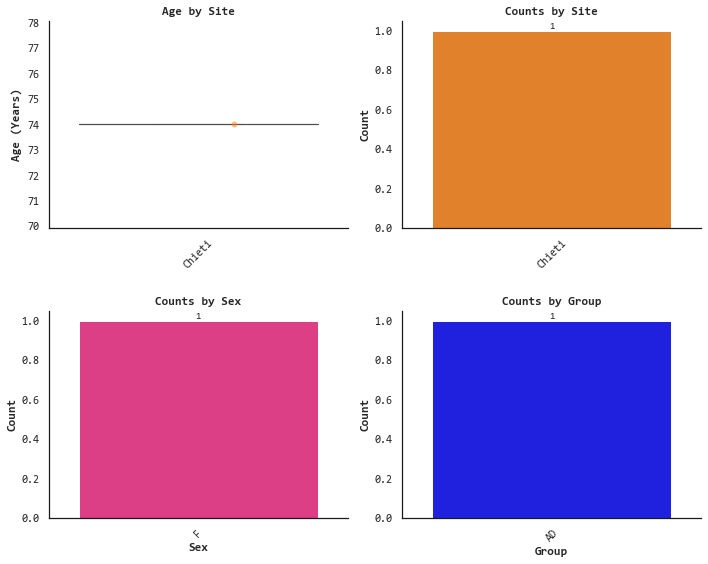

In [266]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

df = low_r_squared_df
# Assume df is the input dataset
palette = ['#ff7f0e', '#d62728', '#8c564b', '#7f7f7f', '#bcbd22', '#17becf', 'red']

# Create a 2x2 grid layout
fig = plt.figure(figsize=(10, 8))
gs = GridSpec(2, 2, figure=fig)


# Subplot 1: Raincloud plot for "age"
ax1 = fig.add_subplot(gs[0, 0])
sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
               palette=palette,
               scale="width", inner=None, ax=ax1)
xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.5, size=6)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
#ax1.legend_.remove()
ax1.set_title("Age by Site", fontweight='bold')
ax1.set_xlabel("")
ax1.set_ylabel("Age (Years)", fontweight= 'bold')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.grid(False)
ax1.set_facecolor('white')  # Set the background color
for spine in ax1.spines.values():
    spine.set_edgecolor('k')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)



# Subplot 2: Bar plot for absolute counts by center
ax2 = fig.add_subplot(gs[0, 1])
sns.countplot(x="center", data=df, palette=palette, ax=ax2)
for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax2.set_title("Counts by Site", fontweight='bold')
ax2.set_xlabel(" ", fontweight='bold')
ax2.set_ylabel("Count", fontweight='bold')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.grid(False)
ax2.set_facecolor('white')  # Set the background color
for spine in ax2.spines.values():
    spine.set_edgecolor('k')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)



# Subplot 3: Bar plot for absolute counts by sex
ax3 = fig.add_subplot(gs[1, 0])
sns.countplot(x="gender", data=df, palette=["#F72585", "#3A0CA3"], ax=ax3)
for p in ax3.patches:
    height = p.get_height()
    ax3.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax3.set_title("Counts by Sex", fontweight='bold')
ax3.set_xlabel("Sex", fontweight='bold')
ax3.set_ylabel("Count", fontweight='bold')
ax3.set_xticklabels([tick.get_text().capitalize() for tick in ax3.get_xticklabels()])
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45)
ax3.grid(False)
ax3.set_facecolor('white')  # Set the background color
for spine in ax3.spines.values():
    spine.set_edgecolor('k')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)



# Subplot 4: Bar plot for absolute counts by group
ax4 = fig.add_subplot(gs[1, 1])
sns.countplot(x="group", data=df, palette=['blue', 'darkmagenta','dodgerblue','forestgreen', 'chocolate','hotpink','fuchsia'], ax=ax4)
for p in ax4.patches:
    height = p.get_height()
    ax4.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom', size=10)
ax4.set_title("Counts by Group", fontweight='bold')
ax4.set_xlabel("Group", fontweight='bold')
ax4.set_ylabel("Count", fontweight='bold')
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=45)
ax4.set_xticklabels([tick.get_text().upper() for tick in ax4.get_xticklabels()])
ax4.grid(False)
ax4.set_facecolor('white')  # Set the background color
for spine in ax4.spines.values():
    spine.set_edgecolor('k')
    ax4.spines['top'].set_visible(False)
    ax4.spines['right'].set_visible(False)


# Adjust spacing between plots
fig.tight_layout()
plt.show()


In [ ]:
good_r_squared_df.to_csv('D:/papers_alberto/edlb_combat_psd/data/recombat_fooof_knee_multinomial.csv', index = False)

## Mass univariate permutation t-tests by NDDs

## NDDs PAIRWISE DIFFERENCES

## Oscillatory

In [ ]:
# # Example usage with a custom plot parameter
# plot_group_diffs(features_df, plot='osc_fit', fig_title='Oscillatory', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'], y_lim=(-0.2,1.4))

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f
from statsmodels.stats.multitest import multipletests
import matplotlib.ticker as ticker
import numpy as np
from mne.stats import permutation_cluster_test
from scipy import stats
import pandas as pd

def prepare_data(psd_data, values = 'psd'):
    pivoted_data = psd_data.pivot(index=['participant_id', 'group'], columns='frequency', values=values)
    groups = np.unique(pivoted_data.index.get_level_values('group'))

    group_data_arrays = {}
    for group in groups:
        group_data = pivoted_data.xs(group, level='group').values
        n_subjects = group_data.shape[0]
        n_frequency_bins = group_data.shape[1]
        group_data_arrays[group] = group_data.reshape(n_subjects, n_frequency_bins, 1)

    data_arrays_list = [group_data_arrays[group] for group in groups]
    return data_arrays_list, n_frequency_bins

def run_permutation_test(data_arrays_list):
    n_conditions = len(data_arrays_list)
    n_observations = sum(len(group_data) for group_data in data_arrays_list)
    
    pval = 0.05  # arbitrary
    dfn = n_conditions - 1  # degrees of freedom numerator
    dfd = n_observations - n_conditions  # degrees of freedom denominator
    thresh = f.ppf(1 - pval, dfn=dfn, dfd=dfd)  # F distribution

    return permutation_cluster_test(
        data_arrays_list,
        n_permutations=2000,
        threshold=thresh,
        tail=0,
        n_jobs=-1,
        out_type='mask',
        adjacency=None, verbose=False, seed=42
    )

def plot_group_diffs(df, plot='psd', fig_title='', y_lim=(-11.5, -8.5), cmap='tab10'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()

    num_pairs = 0
    num_cols = 3
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    num_rows = -(-num_pairs // num_cols)

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows, sharey=True)
    axs = axs.flatten()

    plt.rcParams['font.family'] = 'Consolas'
    sns.set(font="Consolas")
    cmap = cmap
    palette = sns.color_palette(cmap, len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Prepare data for MNE permutation test
        combined_data = df[df['group'].isin([group1, group2])]
        data_arrays_list, n_frequency_bins = prepare_data(combined_data, values = plot)

        T_obs, clusters, cluster_p_vals, H0 = run_permutation_test(data_arrays_list)

        significant_clusters = np.zeros_like(T_obs, dtype=bool)
        for cluster, p_val in zip(clusters, cluster_p_vals):
            if p_val < 0.05:  # threshold for significance
                significant_clusters[cluster] = True

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=color_map[group1])
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=color_map[group2])

        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=color_map[group1])
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=color_map[group2])

        ax.set_xlabel('Frequency (Hz)', size = 14)
        ax.set_ylabel('Power (μV$^2$)', size = 14)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6, labelsize=12)

        ax.set_ylim(y_lim)
        ax.set_xlim(0,30)

        times = np.linspace(3, 30, n_frequency_bins)  # Assuming frequency bins are uniform across datasets

        # Highlight significant clusters and apply legend to this
        for i_c, mask in enumerate(clusters):
            if cluster_p_vals[i_c] < 0.05:
                contiguous_regions = np.where(np.diff(np.concatenate(([False], mask.squeeze(), [False]))))[0].reshape(-1, 2)
                for start, stop in contiguous_regions:
                    if plot == 'osc_fit':
                        ax.fill_between(times[start:stop], np.min(y_lim), np.min(y_lim) + 0.09, alpha=0.3, color='green')
                    else:
                        ax.fill_between(times[start:stop], np.min(y_lim)-0.02, np.min(y_lim) + 0.22, alpha=0.3, color='green')

        ax.set_title(' ')
        # ax.legend(loc='upper center', ncol=1, bbox_to_anchor=(0.52, 1.3), frameon=False, fontsize=14)
        from matplotlib.lines import Line2D

        handles, labels = ax.get_legend_handles_labels()
        circle_handles = [
            Line2D([], [], linestyle='None', marker='o',
                markerfacecolor=h.get_color(), markeredgecolor=h.get_color(),
                markersize=8, label=lab)
            for h, lab in zip(handles, labels)
        ]
        ax.legend(circle_handles, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.45, 1.3), 
                  frameon=False, fontsize=14, columnspacing=0.5, handletextpad=0.1)
        
        ax.grid(False)
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    # plt.suptitle(fig_title, size=20)
    # plt.show()

# # Call the function with your data
# plot_group_diffs(unharm_psd, plot='psd', fig_title='Unharm. - Power Spectrum', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    fig.suptitle(fig_title, size=20)
    return fig



fig = plot_group_diffs(features_df, plot='osc_fit', fig_title='Unharm. Oscillatory', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'], y_lim=(-0.2,1.4))



# # Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_6a_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it

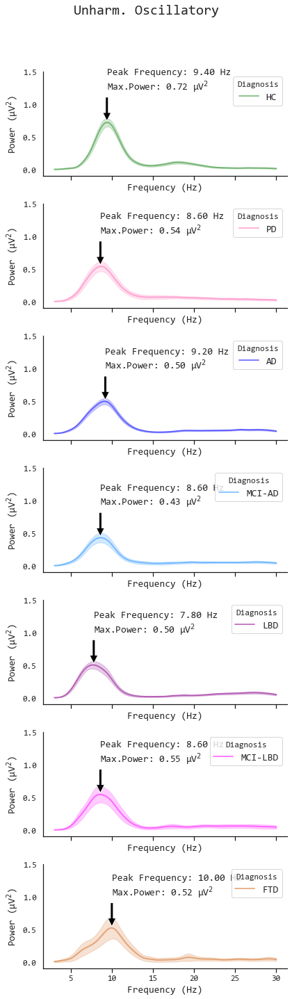

In [274]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

def plot_channel_power(df, fig_title= '', plot_variable = '', group_by = '', ylim = (-0.1, 1.5), legend_title = ''):
    sns.set_style("white")
    sns.set(font="Consolas")
    sns.set_style(rc={'axes.facecolor': 'white'})

    # Get unique groups and assign colors from the sns palette
    group_categories = df[group_by].unique()
    palette = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
    color_map = dict(zip(group_categories, palette))

    # Create subplots
    fig, axes = plt.subplots(len(group_categories), 1, figsize=(6, 3 * len(group_categories)), sharex=True)

    if len(group_categories) == 1:
        axes = [axes]  # Make axes iterable

    for ax, group in zip(axes, group_categories):
        group_df = df[df[group_by] == group]
        mean_group = group_df.groupby(['frequency'])[plot_variable].mean()
        std_group = group_df.groupby(['frequency'])[plot_variable].std()
        num_samples = group_df.groupby(['frequency'])[plot_variable].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        ax.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(), alpha=0.5, color=color)
        ax.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Annotate peak frequency and its corresponding power
        peak_freq = mean_group.idxmax()
        peak_value = mean_group.max()
        ax.annotate(f'Peak Frequency: {peak_freq:.2f} Hz\nMax.Power: {peak_value:.2f} μV$^2$', 
                    xy=(peak_freq, peak_value), 
                    xytext=(peak_freq, peak_value + 0.5),
                    arrowprops=dict(facecolor='black', shrink=0.05), fontsize=14)

        ax.set_xlabel('Frequency (Hz)', size = 14)
        ax.set_ylabel('Power (μV$^2$)', size = 14)
        ax.set_ylim(ylim)
        ax.grid(False)  # Turn off the grid

        ax.legend(loc='upper right', frameon=True, title=legend_title, fontsize=14)

        sns.despine(ax=ax)  # Remove the top and right spines
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6, labelsize=12)

    plt.suptitle(fig_title, size=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect parameter as needed

    plt.show()

# Example usage
plot_channel_power(features_df, fig_title='Unharm. Oscillatory', plot_variable='osc_fit', group_by='group', legend_title='Diagnosis')


## Aperiodic

In [ ]:
# plot_group_diffs(features_df, plot='ap_fit', fig_title='Aperiodic', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])



fig = plot_group_diffs(features_df, plot='ap_fit', fig_title='Unharm. Aperiodic', cmap=['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate'])




# # Save as high-res TIFF and JPG
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_6b_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')

plt.show()  # Close the figure if you don't want to display it

# Figure 6

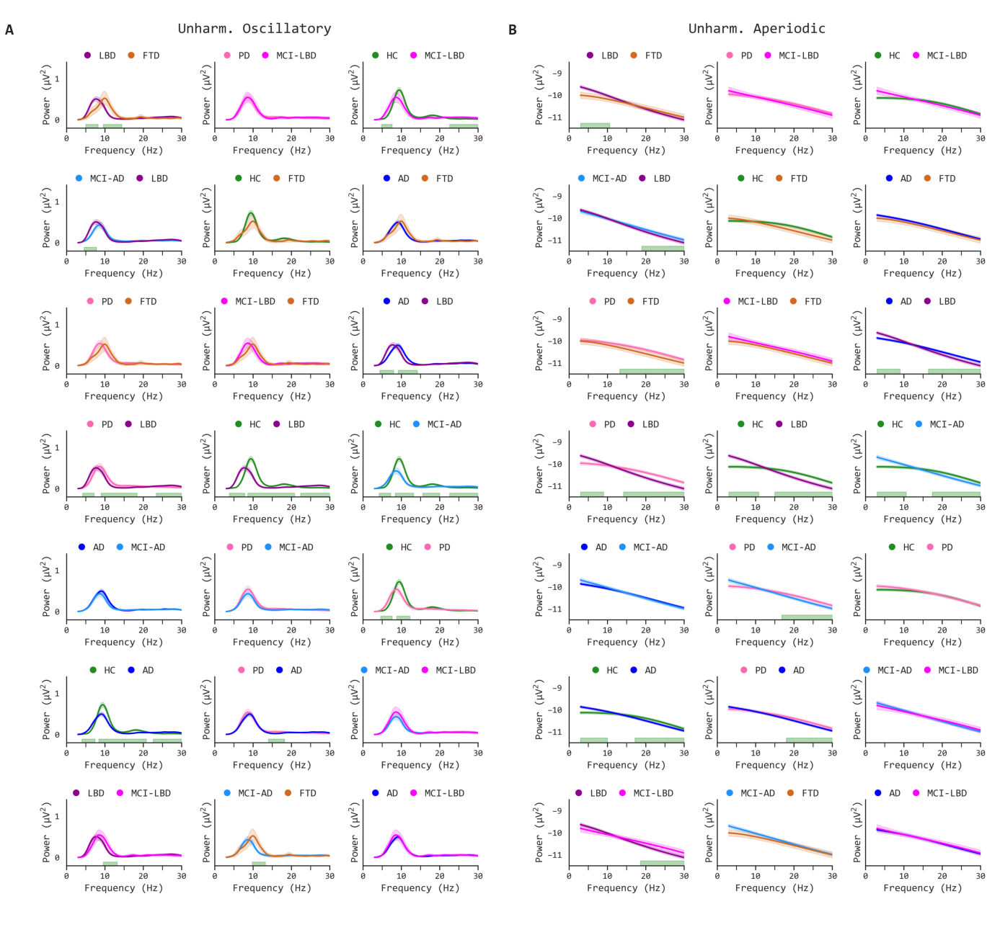

In [276]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.lines import Line2D
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_6a_knee.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_6b_knee.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 1-row, 2-column figure
fig, axs = plt.subplots(1, 2, figsize=(20, 2.6*7))  # Adjust figsize if needed

# Annotations
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.005, 0.98, annotations[i], transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# # Add vertical dashed line in the middle (figure coordinates)
# line = Line2D([0.5, 0.5], [0.02, 0.98], color='black', linewidth=1.5, linestyle='--', transform=fig.transFigure)
# line.set_dashes([6, 10])  # Dash 8pt, gap 10pt
# fig.add_artist(line)


# Adjust spacing
plt.subplots_adjust(wspace=0.005)  # Reduce space between columns
plt.tight_layout()

# Show the figure
plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_6_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg')


# Figure 7

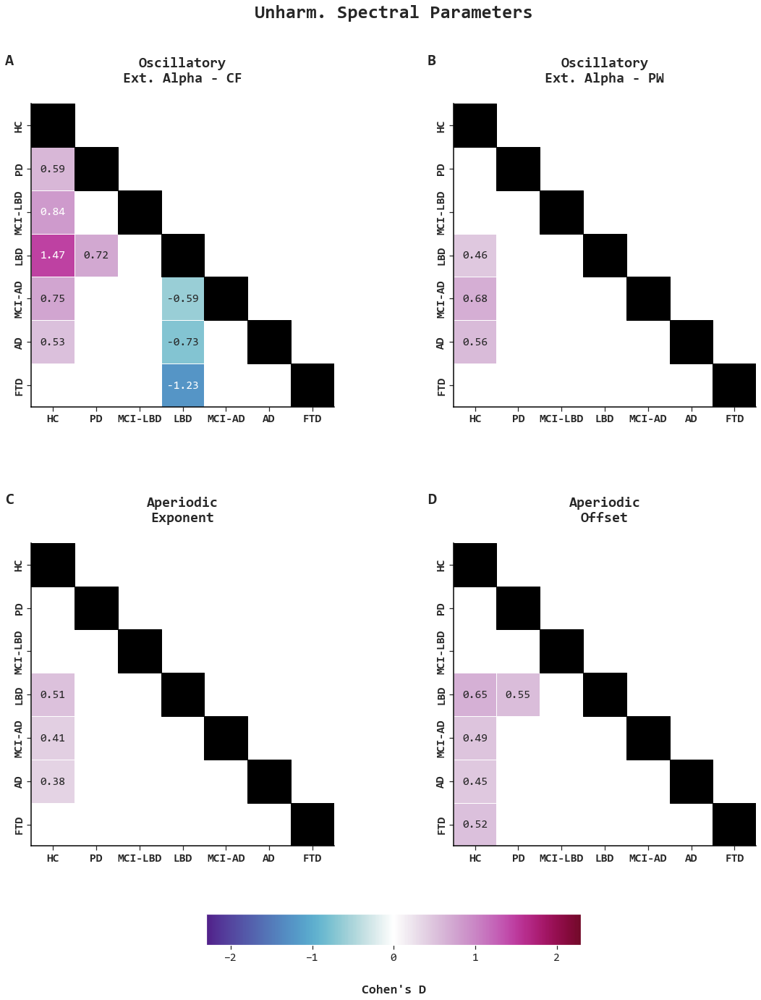

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature
0,group,HC,PD,False,True,3.675461,104.959645,two-sided,3.759785e-04,76.103,0.593359,0.26,0.95,3.597763e-03,extalphas_cf
1,group,HC,MCI-LBD,False,True,3.588653,40.920513,two-sided,8.802405e-04,59.736,0.836147,0.32,1.30,7.487182e-03,extalphas_cf
2,group,HC,LBD,False,True,10.747036,169.674919,two-sided,7.062561e-21,1.342e+19,1.471986,1.09,1.83,5.406570e-19,extalphas_cf
3,group,HC,MCI-AD,False,True,4.865614,119.150209,two-sided,3.529706e-06,6812.118,0.749335,0.44,1.09,6.755198e-05,extalphas_cf
4,group,HC,AD,False,True,5.000990,331.425736,two-sided,9.265215e-07,1.394e+04,0.531098,0.32,0.75,2.364252e-05,extalphas_cf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-2.678241,241.784382,two-sided,7.908542e-03,4.018,-0.308501,-0.53,-0.09,1.009032e-01,offset
80,group,LBD,FTD,False,True,-0.353854,29.893213,two-sided,7.259319e-01,0.253,-0.091696,-0.59,0.43,1.000000e+00,offset
81,group,MCI-AD,AD,False,True,-0.804572,152.004211,two-sided,4.223235e-01,0.201,-0.105948,-0.36,0.14,1.000000e+00,offset
82,group,MCI-AD,FTD,False,True,0.510382,37.454909,two-sided,6.127789e-01,0.274,0.118567,-0.36,0.54,1.000000e+00,offset


In [295]:
import numpy as np
import pandas as pd
import pingouin as pg
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cmr




# Use only unharmonized data
harmonized_specparams = good_r_squared_df.copy()
harmonized_specparams['group'] = pd.Categorical(
    harmonized_specparams['group'],
    categories=['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD'],
    ordered=True
)

groups = harmonized_specparams['group'].cat.categories

# Example dictionary to store subplot titles
subplot_titles = {
    "extalphas_cf": "Oscillatory\nExt. Alpha - CF",
    "extalphas_pw": "Oscillatory\nExt. Alpha - PW",
    "exponent": "Aperiodic\nExponent",
    "offset": "Aperiodic\nOffset",
}


def pingouin_pairwise_with_bootstrap(data, feature, group, alpha=0.05, seed=42, n_boot=2000):
    groups = data[group].cat.categories

    # Use pairwise_tests from Pingouin to compute Cohen's D and uncorrected p-values
    pairwise_results = pg.pairwise_tests(dv=feature, between=group, data=data, padjust='none', effsize='cohen', parametric=True)

    # Initialize matrices to store results
    cohen_d_matrix = pd.DataFrame(np.nan, index=groups, columns=groups)

    # Compute bootstrapped CIs for Cohen's D
    ci_low = []
    ci_high = []
    for _, row in pairwise_results.iterrows():
        g1_data = data.loc[data[group] == row['A'], feature].values
        g2_data = data.loc[data[group] == row['B'], feature].values

        # Bootstrap CIs using Pingouin
        ci = pg.compute_bootci(
            x=g1_data,
            y=g2_data,
            func="cohen",
            paired=False,
            confidence=1 - alpha,
            n_boot=n_boot,
            seed=seed,
        )
        ci_low.append(ci[0])
        ci_high.append(ci[1])

        # Populate the matrix with Cohen's D values
        cohen_d_matrix.loc[row['A'], row['B']] = row['cohen']
        cohen_d_matrix.loc[row['B'], row['A']] = row['cohen']  # Symmetric

    # Add CIs to the DataFrame
    pairwise_results['ci_low'] = ci_low
    pairwise_results['ci_high'] = ci_high

    return cohen_d_matrix, pairwise_results

# Define features to plot
features = ["extalphas_cf", "extalphas_pw", "exponent", "offset"]
# Dictionary to store results for each feature
feature_results = {}

# Create a 2x2 grid for the subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
cmap = cmr.get_sub_cmap('cmr.viola', 0.1, 0.9)

# Store the mappable object for the shared colorbar
mappable = None

for i, feature in enumerate(features):
    ax = axes[i // 2, i % 2]
    
    # Generate bootstrap results
    cohen_d_matrix, pairwise_results = pingouin_pairwise_with_bootstrap(harmonized_specparams, feature, 'group', seed=42)

    # Apply Benjamini-Yekutieli correction for multiple comparisons
    pairwise_results['p-corr'] = pg.multicomp(pairwise_results['p-unc'].values, method='fdr_by')[1]

    # Store the results in the dictionary
    feature_results[feature] = pairwise_results

    # Masking for non-significant results
    non_significant_mask = np.zeros_like(cohen_d_matrix.values, dtype=bool)
    for _, row in pairwise_results.iterrows():
        g1, g2 = row['A'], row['B']
        idx_g1, idx_g2 = cohen_d_matrix.index.get_loc(g1), cohen_d_matrix.columns.get_loc(g2)
        non_significant_mask[idx_g2, idx_g1] = row['p-corr'] >= 0.05

    # Mask the upper triangle
    mask_upper = np.triu(np.ones_like(cohen_d_matrix, dtype=bool))
    combined_mask = mask_upper | non_significant_mask

    # Set diagonal to NaN and fill it with black color later
    np.fill_diagonal(cohen_d_matrix.values, np.nan)

    # Plot the matrix
    heatmap = sns.heatmap(
        cohen_d_matrix,
        mask=combined_mask,
        annot=True,
        annot_kws={"size": 16},
        fmt=".2f",
        center=0,
        vmin=-2.3,
        vmax=2.3,
        cmap=cmap,
        cbar=False,  # Disable individual colorbars
        square=True,
        linewidths=.5,
        linecolor='white',
        ax=ax,
    )
    
    # Save the heatmap mappable object for the shared colorbar
    if mappable is None:
        mappable = heatmap.get_children()[0]

    # Fill the diagonal with black
    for j in range(len(groups)):
        ax.add_patch(plt.Rectangle((j, j), 1, 1, fill=True, color='black', edgecolor='black'))

    # Annotate subplot as A), B), C), D)
    ax.text(-0.5, -1, f"{chr(65 + i)}", fontsize=22, fontweight="bold", va="center", ha="center")

    # Set subplot title
    ax.set_title(subplot_titles[feature], fontsize=20, fontweight="bold", pad=30)
    # Enable outer ticks on top and right
    ax.tick_params(axis='both', which='both', direction='out', top=True, right=True)
    ax.xaxis.tick_bottom()
    ax.yaxis.tick_left()
    # Customize x and y ticks
    ax.set_xticklabels([label.upper() for label in cohen_d_matrix.columns], fontsize=16, fontweight='bold')
    ax.set_yticklabels([label.upper() for label in cohen_d_matrix.index], fontsize=16, fontweight='bold')

    # Adjust spines
    ax.spines['left'].set_visible(True)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.set_facecolor('white')  # Set the background color

    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)


# Add shared colorbar
cbar = fig.colorbar(
    mappable,
    ax=axes,
    location='bottom',
    shrink=1.5,
    aspect=12,
    pad=0.2,
    label="Cohen's D")

# Make the title bigger
cbar.set_label("Cohen's D", fontsize=18, fontweight='bold', labelpad=30)
cbar.ax.tick_params(labelsize=16)
cbar.ax.set_position([0.3, -1.07, 0.4, 1])  # [x, y, width, height]

plt.suptitle('Unharm. Spectral Parameters', fontsize=26, fontweight='bold', y=1.02)

# Tight layout to avoid overlap
plt.tight_layout(h_pad=6, w_pad=6)


plt.show()

output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_7_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', bbox_inches='tight', pil_kwargs={"compression": "tiff_lzw"})
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')


# Combine all feature results into a single DataFrame with a "Feature" column for differentiation
combined_results = pd.concat(
    [df.assign(Feature=feature) for feature, df in feature_results.items()],
    ignore_index=True
)

combined_results#.round(3)



In [296]:
# Combine all feature results into a single DataFrame with a "Feature" column for differentiation
combined_results = pd.concat(
    [df.assign(Feature=feature) for feature, df in feature_results.items()],
    ignore_index=True
)
combined_results.round(3)

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature
0,group,HC,PD,False,True,3.675,104.960,two-sided,0.000,76.103,0.593,0.26,0.95,0.004,extalphas_cf
1,group,HC,MCI-LBD,False,True,3.589,40.921,two-sided,0.001,59.736,0.836,0.32,1.30,0.007,extalphas_cf
2,group,HC,LBD,False,True,10.747,169.675,two-sided,0.000,1.342e+19,1.472,1.09,1.83,0.000,extalphas_cf
3,group,HC,MCI-AD,False,True,4.866,119.150,two-sided,0.000,6812.118,0.749,0.44,1.09,0.000,extalphas_cf
4,group,HC,AD,False,True,5.001,331.426,two-sided,0.000,1.394e+04,0.531,0.32,0.75,0.000,extalphas_cf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-2.678,241.784,two-sided,0.008,4.018,-0.309,-0.53,-0.09,0.101,offset
80,group,LBD,FTD,False,True,-0.354,29.893,two-sided,0.726,0.253,-0.092,-0.59,0.43,1.000,offset
81,group,MCI-AD,AD,False,True,-0.805,152.004,two-sided,0.422,0.201,-0.106,-0.36,0.14,1.000,offset
82,group,MCI-AD,FTD,False,True,0.510,37.455,two-sided,0.613,0.274,0.119,-0.36,0.54,1.000,offset


In [297]:
# Replace values in the 'Feature' column with the new names
combined_results["A"] = combined_results["A"].replace({
    "MCI-LBD": "MCI-LBD",
    "MCI-AD": "MCI-AD"})

# Replace values in the 'Feature' column with the new names
combined_results["B"] = combined_results["B"].replace({
    "MCI-LBD": "MCI-LBD",
    "MCI-AD": "MCI-AD"})

# Create a new column in combined_results with the format "A vs B"
combined_results['Comparison'] = combined_results['A'] + " vs " + combined_results['B']
combined_results.columns

# Create a formatted_p column based on the conditions
formatted_p = combined_results["p-corr"].round(3).apply(
    lambda p: "< 0.001 *" if p == 0 else (f"{p:.3f} *" if p < 0.05 else f"{p:.3f}")
)

# Add the new column to the dataframe
combined_results["formatted_p"] = formatted_p

# Replace values in the 'Feature' column with the new names
combined_results["Feature"] = combined_results["Feature"].replace({
    "extalphas_cf": "Ext. Alpha - CF",
    "extalphas_pw": "Ext. Alpha - PW",
    "offset": "Ap. Offset",
    "exponent": "Ap. Exponent"})

combined_results.round(3)

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,cohen,ci_low,ci_high,p-corr,Feature,Comparison,formatted_p
0,group,HC,PD,False,True,3.675,104.960,two-sided,0.000,76.103,0.593,0.26,0.95,0.004,Ext. Alpha - CF,HC vs PD,0.004 *
1,group,HC,MCI-LBD,False,True,3.589,40.921,two-sided,0.001,59.736,0.836,0.32,1.30,0.007,Ext. Alpha - CF,HC vs MCI-LBD,0.007 *
2,group,HC,LBD,False,True,10.747,169.675,two-sided,0.000,1.342e+19,1.472,1.09,1.83,0.000,Ext. Alpha - CF,HC vs LBD,< 0.001 *
3,group,HC,MCI-AD,False,True,4.866,119.150,two-sided,0.000,6812.118,0.749,0.44,1.09,0.000,Ext. Alpha - CF,HC vs MCI-AD,< 0.001 *
4,group,HC,AD,False,True,5.001,331.426,two-sided,0.000,1.394e+04,0.531,0.32,0.75,0.000,Ext. Alpha - CF,HC vs AD,< 0.001 *
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,group,LBD,AD,False,True,-2.678,241.784,two-sided,0.008,4.018,-0.309,-0.53,-0.09,0.101,Ap. Offset,LBD vs AD,0.101
80,group,LBD,FTD,False,True,-0.354,29.893,two-sided,0.726,0.253,-0.092,-0.59,0.43,1.000,Ap. Offset,LBD vs FTD,1.000
81,group,MCI-AD,AD,False,True,-0.805,152.004,two-sided,0.422,0.201,-0.106,-0.36,0.14,1.000,Ap. Offset,MCI-AD vs AD,1.000
82,group,MCI-AD,FTD,False,True,0.510,37.455,two-sided,0.613,0.274,0.119,-0.36,0.54,1.000,Ap. Offset,MCI-AD vs FTD,1.000


<Axes: xlabel="Cohen's D">

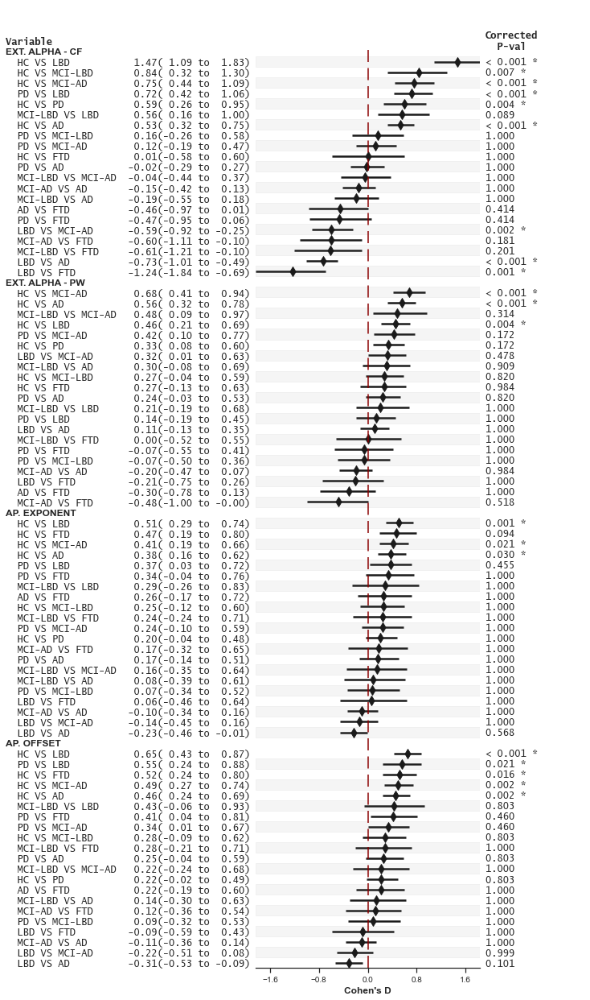

In [298]:
import forestplot as fp
sns.set_style('white')

fp.forestplot(combined_results.round(3),  # the dataframe with results data
            estimate="cohen",  # col containing estimated effect size 
            ll="ci_low", hl="ci_high",  # columns containing conf. int. lower and higher limits
            varlabel="Comparison",  # column containing variable label
            capitalize="upper",  # Capitalize labels
            groupvar="Feature",  # Add variable groupings 
            # group ordering
            group_order= ["Ext. Alpha - CF","Ext. Alpha - PW", "Ap. Exponent", "Ap. Offset"],
            sort=True,  # sort in ascending order (sorts within group if group is specified)               
            #pval="p-corr",  # Column of p-value to be reported on right
            decimal_precision = 2,
            color_alt_rows=True,  # Gray alternate rows
            figsize=(5,22),
            xlabel="Cohen's D",  # x-label title
            yticker2="p-corr",
            rightannote=["formatted_p"],  # columns to report on right of plot 
            right_annoteheaders=["Corrected\n  P-val"],  # ^corresponding headers
            **{"marker": "d",  # set maker symbol as diamond
                "markersize": 70,  # adjust marker size
                "markeralpha": 1,  # adjust marker size
                "markercolor": 'k',  # adjust marker size
                "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                "xlinecolor": "darkred",
                "xlinewidth": 1.5,
                "lw": 2.5,                
                "linecolor": "k", "despine":True}
            )

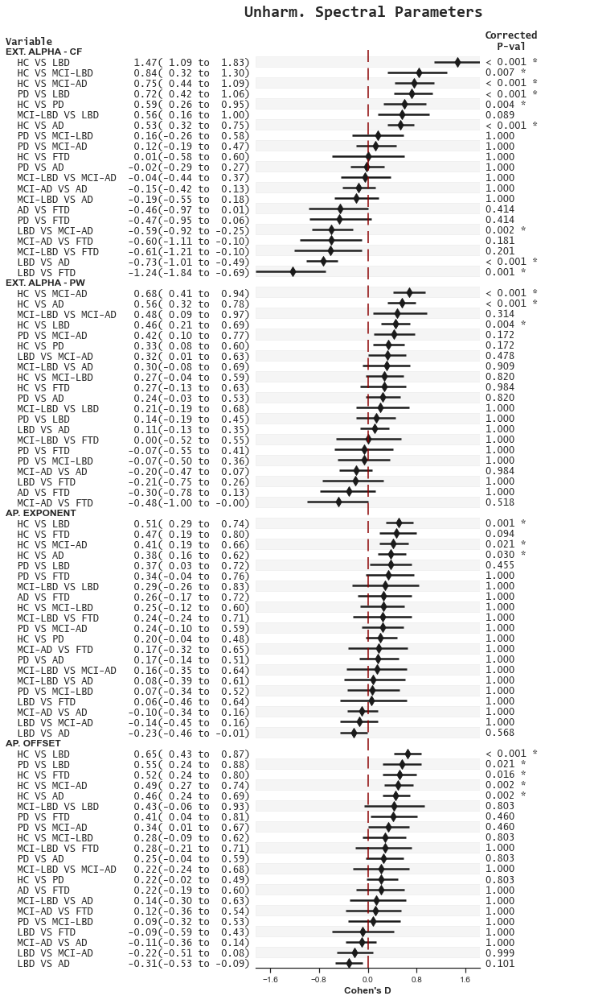

In [300]:
import forestplot as fp
import seaborn as sns

sns.set_style('white')

ax = fp.forestplot(
    combined_results.round(3),
    estimate="cohen",
    ll="ci_low", hl="ci_high",
    varlabel="Comparison",
    capitalize="upper",
    groupvar="Feature",
    group_order=["Ext. Alpha - CF", "Ext. Alpha - PW", "Ap. Exponent", "Ap. Offset"],
    sort=True,
    decimal_precision=2,
    color_alt_rows=True,
    figsize=(5, 22),
    xlabel="Cohen's D",
    yticker2="p-corr",
    rightannote=["formatted_p"],
    right_annoteheaders=["Corrected\n  P-val"],
    **{
        "marker": "d",
        "markersize": 70,
        "markeralpha": 1,
        "markercolor": 'k',
        "xlinestyle": (0, (10, 5)),
        "xlinecolor": "darkred",
        "xlinewidth": 1.5,
        "lw": 2.5,
        "linecolor": "k",
        "despine": True
    }
)

# Get the figure from the axes
fig = ax.figure
fig.suptitle('Unharm. Spectral Parameters', fontsize=20, fontweight='bold', y=0.88, fontname='Consolas')

# Save the figure
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_forestplot_specparams_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight' )

# Show it (optional)
plt.show()

In [ ]:
# FULL SINGLE-CELL: OVR logistic + bootstrap ROC CIs + 6x2 (ROC, legend)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from scipy import interpolate

# --------------------------
# CONFIG
# --------------------------
B = 2000                      # bootstrap resamples (reduce if slow; e.g., 200)
ALPHA = 0.05                 # 95% CI
FPR_GRID = np.linspace(0, 1, 201)
RANDOM_SEED = 2025
rng = np.random.default_rng(RANDOM_SEED)

colors = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
suptitles = ['Baseline', 'Ext. Alpha - CF', 'Ext. Alpha - PW', 'Ext. Alpha - BW', 'Aperiodic Exponent', 'Aperiodic Offset']

target = 'group'
classes = good_r_squared_df[target].unique()

sns.set(font="Consolas")
plt.rcParams["font.family"] = "Consolas"

# --------------------------
# Helper: fit your exact model and return scores
# --------------------------
def _fit_and_score(feature, y_true, data):
    """Fit your exact model and return predicted probabilities (scores)."""
    scaler = StandardScaler()
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})
        Xs = scaler.fit_transform(X)
    else:
        X = data[[feature]].copy()
        Xs = scaler.fit_transform(X)
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(Xs, y_true)
    return model.predict_proba(Xs)[:, 1]

# --------------------------
# Bootstrap ROC (refit per bootstrap)
# --------------------------
def calculate_adjusted_metrics_with_boot(feature, y_true, data, B=B, alpha=ALPHA):
    # Fit on full data
    scores = _fit_and_score(feature, y_true, data)
    fpr, tpr, _ = roc_curve(y_true, scores)
    auc_val = auc(fpr, tpr)

    # Bootstrap with refit
    n = len(y_true)
    tprs = []
    aucs = []
    for _ in range(B):
        idx = rng.integers(0, n, n)  # resample rows
        y_b = y_true.iloc[idx] if isinstance(y_true, pd.Series) else y_true[idx]
        d_b = data.iloc[idx]
        s_b = _fit_and_score(feature, y_b, d_b)
        fpr_b, tpr_b, _ = roc_curve(y_b, s_b)

        # Interpolate onto common FPR grid
        interp_fun = interpolate.interp1d(
            fpr_b, tpr_b, kind='linear', bounds_error=False, fill_value=(0, 1)
        )
        tprs.append(interp_fun(FPR_GRID))
        aucs.append(auc(fpr_b, tpr_b))

    tprs = np.asarray(tprs)
    lo = np.percentile(tprs, 100*alpha/2, axis=0)
    hi = np.percentile(tprs, 100*(1 - alpha/2), axis=0)
    auc_lo = np.percentile(aucs, 100*alpha/2)
    auc_hi = np.percentile(aucs, 100*(1 - alpha/2))

    return {
        'auc_roc': auc_val,
        'auc_ci': (auc_lo, auc_hi),
        'fpr': fpr,
        'tpr': tpr,
        'fpr_grid': FPR_GRID,
        'tpr_lo': lo,
        'tpr_hi': hi,
    }

# --------------------------
# Compute metrics for all (feature, class)
# --------------------------
harmonized_results = {}
for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics_with_boot(feature, y_true, good_r_squared_df, B=B, alpha=ALPHA)
        harmonized_results[feature][cls] = metrics

# --------------------------
# PLOT: 6x2 grid (ROC in col 1, legend in col 2)
# --------------------------
fig, axes = plt.subplots(len(features), 2, figsize=(10, 28), sharey='row',
                         gridspec_kw={'width_ratios':[1.5, 0.5]})

for i, (feature, title) in enumerate(zip(features, suptitles)):
    ax_roc = axes[i, 0]
    ax_leg = axes[i, 1]
    handles, labels = [], []

    for cls, color in zip(classes, colors):
        m = harmonized_results[feature][cls]
        h, = ax_roc.plot(
            m['fpr'], m['tpr'],
            label=f"{cls.upper()} (AUC={m['auc_roc']:.2f} [{m['auc_ci'][0]:.2f},{m['auc_ci'][1]:.2f}])",
            color=color, lw=2
        )
        ax_roc.fill_between(m['fpr_grid'], m['tpr_lo'], m['tpr_hi'], alpha=0.15, color=color)
        handles.append(h)
        labels.append(h.get_label())

    # Diagonal
    ax_roc.plot([0, 1], [0, 1], color='lightgray', linestyle='--', lw=2)
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.set_xlabel('1 - Specificity', fontsize=12)
    ax_roc.set_ylabel('Sensitivity', fontsize=12)
    ax_roc.set_title(title, fontsize=16, fontweight='bold')

    for spine in ax_roc.spines.values():
        spine.set_edgecolor('k')
    ax_roc.spines['top'].set_visible(False)
    ax_roc.spines['right'].set_visible(False)
    ax_roc.xaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.yaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.tick_params(direction="out", which='both', bottom=True, left=True, color='k', length=6)
    ax_roc.set_facecolor('white')

    # Legend (right column)
    ax_leg.axis('off')
    ax_leg.legend(handles, labels, loc='center', frameon=False, fontsize=16)

fig.text(0.5, 0.995, "Unharm. Spectral Parameters (unadjusted)",
         ha='center', va='top', fontsize=20, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.98])

plt.show()

output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_8a_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')

In [ ]:
# FULL SINGLE-CELL: OVR logistic + bootstrap ROC CIs + 6x2 (ROC, legend)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from scipy import interpolate

# --------------------------
# CONFIG
# --------------------------
B = 2000                      # bootstrap resamples (reduce if slow; e.g., 200)
ALPHA = 0.05                 # 95% CI
FPR_GRID = np.linspace(0, 1, 201)
RANDOM_SEED = 2025
rng = np.random.default_rng(RANDOM_SEED)

colors = ['forestgreen', 'hotpink', 'blue', 'dodgerblue', 'darkmagenta', 'fuchsia', 'chocolate']
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
suptitles = ['Baseline', 'Ext. Alpha - CF', 'Ext. Alpha - PW', 'Ext. Alpha - BW', 'Aperiodic Exponent', 'Aperiodic Offset']

target = 'group'
classes = good_r_squared_df[target].unique()

sns.set(font="Consolas")
plt.rcParams["font.family"] = "Consolas"

# --------------------------
# Helper: fit your exact model and return scores
# --------------------------
def _fit_and_score(feature, y_true, data):
    """Fit your exact model and return predicted probabilities (scores)."""
    scaler = StandardScaler()
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})
        Xs = scaler.fit_transform(X)
    else:
        X = data[['age', 'gender', feature]].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        Xs = scaler.fit_transform(X)
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(Xs, y_true)
    return model.predict_proba(Xs)[:, 1]

# --------------------------
# Bootstrap ROC (refit per bootstrap)
# --------------------------
def calculate_adjusted_metrics_with_boot(feature, y_true, data, B=B, alpha=ALPHA):
    # Fit on full data
    scores = _fit_and_score(feature, y_true, data)
    fpr, tpr, _ = roc_curve(y_true, scores)
    auc_val = auc(fpr, tpr)

    # Bootstrap with refit
    n = len(y_true)
    tprs = []
    aucs = []
    for _ in range(B):
        idx = rng.integers(0, n, n)  # resample rows
        y_b = y_true.iloc[idx] if isinstance(y_true, pd.Series) else y_true[idx]
        d_b = data.iloc[idx]
        s_b = _fit_and_score(feature, y_b, d_b)
        fpr_b, tpr_b, _ = roc_curve(y_b, s_b)

        # Interpolate onto common FPR grid
        interp_fun = interpolate.interp1d(
            fpr_b, tpr_b, kind='linear', bounds_error=False, fill_value=(0, 1)
        )
        tprs.append(interp_fun(FPR_GRID))
        aucs.append(auc(fpr_b, tpr_b))

    tprs = np.asarray(tprs)
    lo = np.percentile(tprs, 100*alpha/2, axis=0)
    hi = np.percentile(tprs, 100*(1 - alpha/2), axis=0)
    auc_lo = np.percentile(aucs, 100*alpha/2)
    auc_hi = np.percentile(aucs, 100*(1 - alpha/2))

    return {
        'auc_roc': auc_val,
        'auc_ci': (auc_lo, auc_hi),
        'fpr': fpr,
        'tpr': tpr,
        'fpr_grid': FPR_GRID,
        'tpr_lo': lo,
        'tpr_hi': hi,
    }

# --------------------------
# Compute metrics for all (feature, class)
# --------------------------
harmonized_results = {}
for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics_with_boot(feature, y_true, good_r_squared_df, B=B, alpha=ALPHA)
        harmonized_results[feature][cls] = metrics

# --------------------------
# PLOT: 6x2 grid (ROC in col 1, legend in col 2)
# --------------------------
fig, axes = plt.subplots(len(features), 2, figsize=(10, 28), sharey='row',
                         gridspec_kw={'width_ratios':[1.5, 0.5]})

for i, (feature, title) in enumerate(zip(features, suptitles)):
    ax_roc = axes[i, 0]
    ax_leg = axes[i, 1]
    handles, labels = [], []

    for cls, color in zip(classes, colors):
        m = harmonized_results[feature][cls]
        h, = ax_roc.plot(
            m['fpr'], m['tpr'],
            label=f"{cls.upper()} (AUC={m['auc_roc']:.2f} [{m['auc_ci'][0]:.2f},{m['auc_ci'][1]:.2f}])",
            color=color, lw=2
        )
        ax_roc.fill_between(m['fpr_grid'], m['tpr_lo'], m['tpr_hi'], alpha=0.15, color=color)
        handles.append(h)
        labels.append(h.get_label())

    # Diagonal
    ax_roc.plot([0, 1], [0, 1], color='lightgray', linestyle='--', lw=2)
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.set_xlabel('1 - Specificity', fontsize=12)
    ax_roc.set_ylabel('Sensitivity', fontsize=12)
    ax_roc.set_title(title, fontsize=16, fontweight='bold')

    for spine in ax_roc.spines.values():
        spine.set_edgecolor('k')
    ax_roc.spines['top'].set_visible(False)
    ax_roc.spines['right'].set_visible(False)
    ax_roc.xaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.yaxis.set_minor_locator(ticker.FixedLocator(np.arange(0, 1.1, 0.2)))
    ax_roc.tick_params(direction="out", which='both', bottom=True, left=True, color='k', length=6)
    ax_roc.set_facecolor('white')

    # Legend (right column)
    ax_leg.axis('off')
    ax_leg.legend(handles, labels, loc='center', frameon=False, fontsize=16)

fig.text(0.5, 0.995, "Unharm. Spectral Parameters (age + sex adjusted)",
         ha='center', va='top', fontsize=20, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.98])
plt.show()


output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_8b_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')



# Figure 8

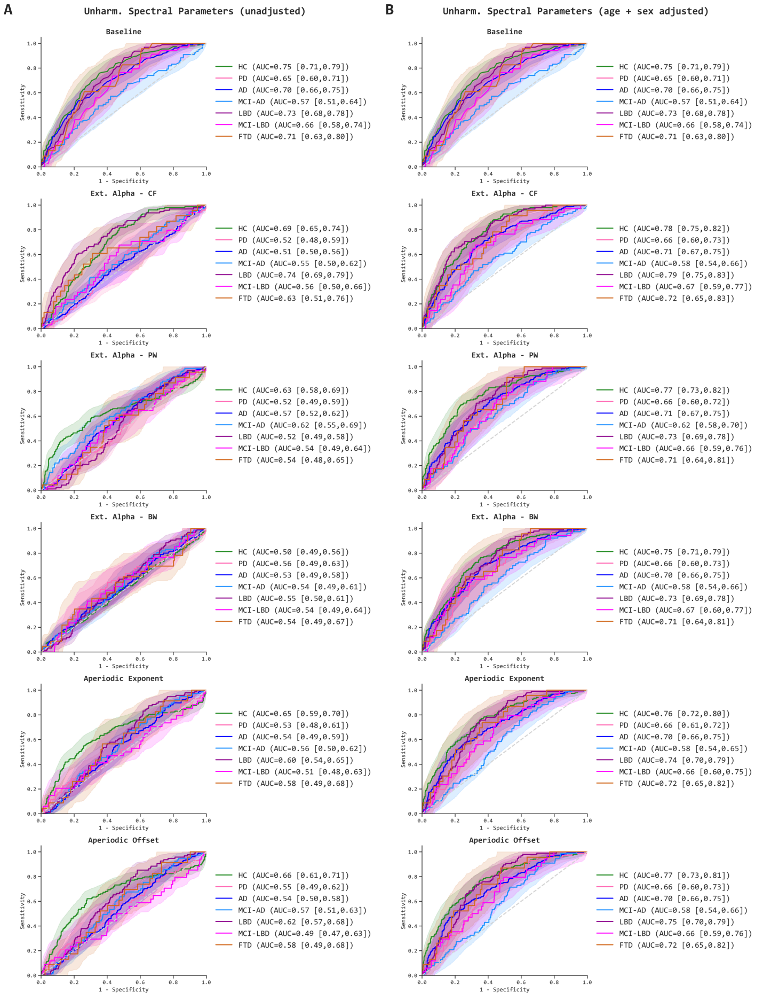

In [285]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

# Load the images
fig_paths = [
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_8a_knee.tiff',
    'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_8b_knee.tiff'
]

images = [mpimg.imread(p) for p in fig_paths]

# Create a 3-row figure (3,1)
fig, axs = plt.subplots(1, 2, figsize=(20, 28.5))  # Make figure slightly shorter

# Plot and annotate
annotations = ['A', 'B']
for i, (ax, img) in enumerate(zip(axs, images)):
    ax.imshow(img)
    ax.axis('off')
    ax.text(-0.01, 1, annotations[i], transform=ax.transAxes,
            fontsize=30, fontweight='bold', va='top', ha='right',
            fontfamily='Consolas')

# Reduce vertical spacing between subplots

plt.tight_layout()
plt.subplots_adjust(hspace=0.001)

plt.show()

# Save
output_base = 'D:/papers_alberto/edlb_combat_psd/submission/neurobiol_disease/figures/unh_fig_8_knee'
fig.savefig(f'{output_base}.tiff', dpi=500, format='tiff', pil_kwargs={"compression": "tiff_lzw"}, bbox_inches='tight')
fig.savefig(f'{output_base}.jpg', dpi=1000, format='jpg', bbox_inches='tight')



In [286]:
import seaborn as sns
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Define the features and target
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
target = 'group'
classes = good_r_squared_df[target].unique()  # Use unharmonized data for classes

# Function to calculate metrics at the Youden index with adjustment for age, gender, and center
def calculate_adjusted_metrics(feature, y_true, data):
    scaler = StandardScaler()  # Initialize the scaler
    
    # Fit logistic regression model with age, gender, and center as covariates
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling

    else:
        X = data[['age', 'gender', feature]].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling

    # Fit the model
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X, y_true)
    y_scores = model.predict_proba(X)[:, 1]
    
    # Calculate ROC metrics
    feature_values = data[feature].values if feature != 'Baseline' else data['age'].values
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_roc = auc(fpr, tpr)
    youden_index = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[youden_index]
    cutoff = feature_values[youden_index]

    # Predict using the optimal threshold
    y_pred = (y_scores >= optimal_threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    lr_pos = sensitivity / (1 - specificity)
    lr_neg = (1 - sensitivity) / specificity
    
    return {
        'auc_roc': auc_roc,
        'cutoff': cutoff,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'ppv': ppv,
        'npv': npv,
        'accuracy': accuracy,
        'lr_pos': lr_pos,
        'lr_neg': lr_neg,
        'fpr': fpr,
        'tpr': tpr
    }

# Calculate the adjusted ROC curves for unharmonized results
harmonized_results_adjusted = {}

for feature in features:
    harmonized_results_adjusted[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics(feature, y_true, good_r_squared_df)
        harmonized_results_adjusted[feature][cls] = metrics



import seaborn as sns
import pandas as pd
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.preprocessing import StandardScaler


# Define the features and target
features = ['Baseline', 'extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
target = 'group'
classes = good_r_squared_df[target].unique()  # Use unharmonized data for classes

# Function to calculate metrics at the Youden index with adjustment for age, gender, and center
def calculate_adjusted_metrics(feature, y_true, data):
    scaler = StandardScaler()  # Initialize the scaler
    
    # Fit logistic regression model with age, gender, and center as covariates
    if feature == 'Baseline':
        X = data[['age', 'gender']].copy()
        X['gender'] = X['gender'].map({'M': 1, 'F': 0})  # Encode gender
        X = scaler.fit_transform(X)  # Apply scaling
    else:
        X = data[[feature]].copy()
        X = scaler.fit_transform(X)  # Apply scaling

    # Fit the model
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X, y_true)
    y_scores = model.predict_proba(X)[:, 1]
    
    # Calculate ROC metrics
    feature_values = data[feature].values if feature != 'Baseline' else data['age'].values
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_roc = auc(fpr, tpr)
    youden_index = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[youden_index]
    cutoff = feature_values[youden_index]

    # Predict using the optimal threshold
    y_pred = (y_scores >= optimal_threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    lr_pos = sensitivity / (1 - specificity)
    lr_neg = (1 - sensitivity) / specificity
    
    return {
        'auc_roc': auc_roc,
        'cutoff': cutoff,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'ppv': ppv,
        'npv': npv,
        'accuracy': accuracy,
        'lr_pos': lr_pos,
        'lr_neg': lr_neg,
        'fpr': fpr,
        'tpr': tpr
    }

# Calculate the adjusted ROC curves for unharmonized results
harmonized_results = {}

for feature in features:
    harmonized_results[feature] = {}
    for cls in classes:
        y_true = (good_r_squared_df[target] == cls).astype(int)
        metrics = calculate_adjusted_metrics(feature, y_true, good_r_squared_df)
        harmonized_results[feature][cls] = metrics

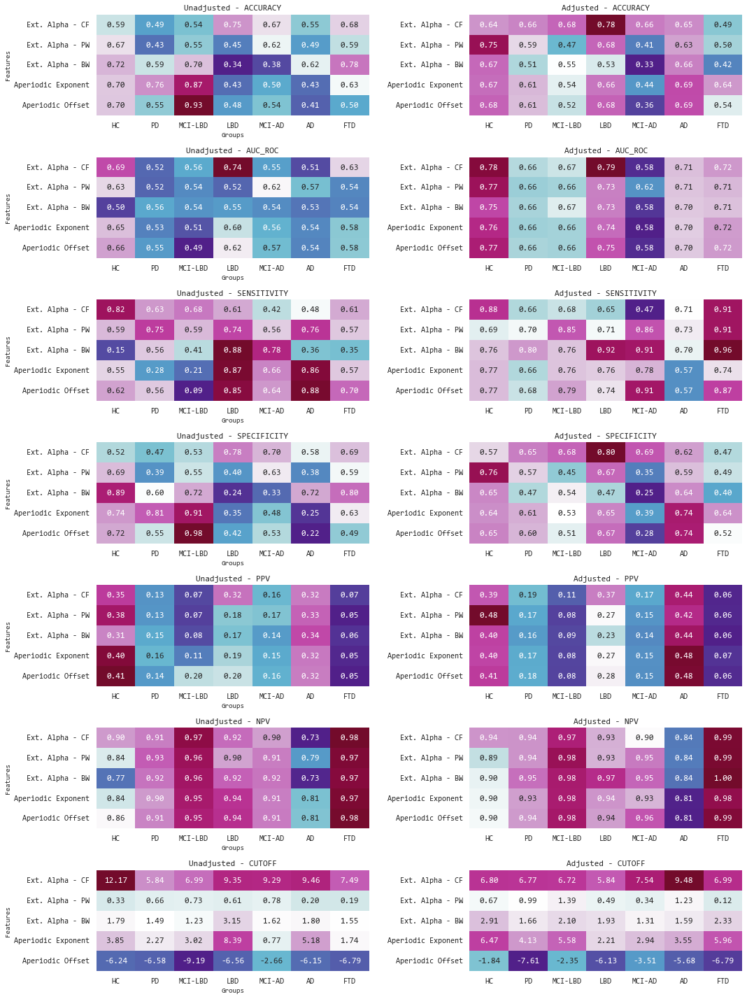

In [287]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define features and groups
features = ['extalphas_cf', 'extalphas_pw', 'extalphas_bw', 'exponent', 'offset']
groups = ['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD']
metrics_to_plot = ['accuracy', 'auc_roc', 'sensitivity', 'specificity', 'ppv', 'npv', 'cutoff']

# Prettify feature and group labels
feature_labels = {
    'extalphas_cf': 'Ext. Alpha - CF',
    'extalphas_pw': 'Ext. Alpha - PW',
    'extalphas_bw': 'Ext. Alpha - BW',
    'exponent': 'Aperiodic Exponent',
    'offset': 'Aperiodic Offset',
}
group_labels = {group: group.upper() for group in groups}

# Create a function to aggregate results for heatmap
def aggregate_metrics(results, features, groups, metrics):
    heatmap_data = {metric: pd.DataFrame(index=features, columns=groups) for metric in metrics}
    for feature in features:
        for group in groups:
            metrics_dict = results[feature][group]
            for metric in metrics:
                heatmap_data[metric].loc[feature, group] = metrics_dict[metric]
    return heatmap_data

# Aggregate results for unadjusted and adjusted
unadjusted_heatmap_data = aggregate_metrics(harmonized_results, features, groups, metrics_to_plot)
adjusted_heatmap_data = aggregate_metrics(harmonized_results_adjusted, features, groups, metrics_to_plot)

# Plot the heatmaps
fig, axes = plt.subplots(len(metrics_to_plot), 2, figsize=(15, 20))#, sharex=True)

for i, metric in enumerate(metrics_to_plot):
    # Unadjusted heatmap
    sns.heatmap(
        unadjusted_heatmap_data[metric].astype(float).rename(index=feature_labels, columns=group_labels),
        annot=True,
        fmt=".2f",
        cmap=cmap,
        cbar=False,
        ax=axes[i, 0]
    )
    axes[i, 0].set_title(f"Unadjusted - {metric.upper()}", fontsize=12)
    axes[i, 0].set_ylabel("Features", fontsize=10)
    axes[i, 0].set_xlabel("Groups", fontsize=10)

    # Adjusted heatmap
    sns.heatmap(
        adjusted_heatmap_data[metric].astype(float).rename(index=feature_labels, columns=group_labels),
        annot=True,
        fmt=".2f",
        cmap=cmap,
        cbar=False,
        ax=axes[i, 1]
    )
    axes[i, 1].set_title(f"Adjusted - {metric.upper()}", fontsize=12)
    axes[i, 1].set_ylabel(" ", fontsize=10)
    axes[i, 1].set_xlabel(" ", fontsize=10)
    axes[i, 1].grid('off')

plt.tight_layout()
plt.show()

# Mean Differences Specparams

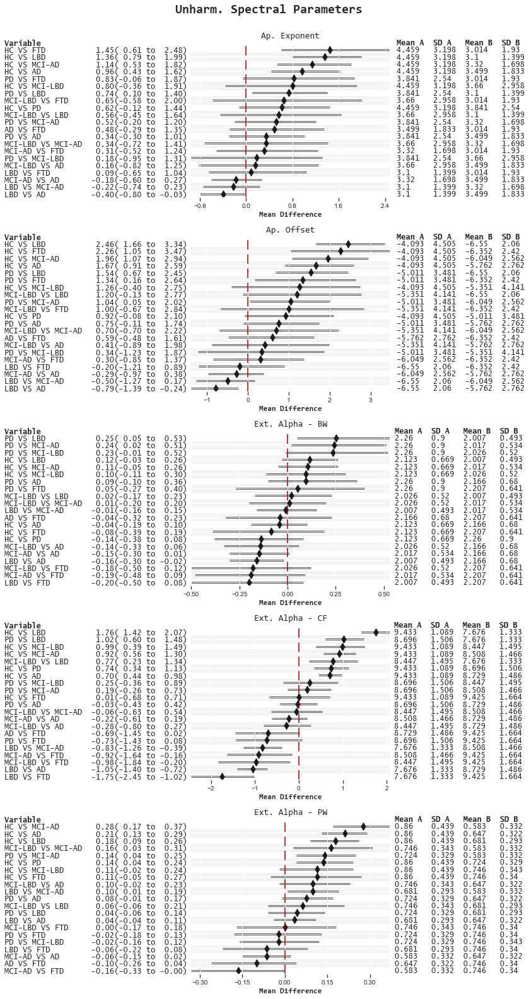

In [288]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pingouin as pg
import forestplot as fp

# Define features and groups
features = ["extalphas_cf", "extalphas_pw", "extalphas_bw", "exponent", "offset"]
groups = ['HC', 'PD', 'MCI-LBD', 'LBD', 'MCI-AD', 'AD', 'FTD']

# Define the weighted mean difference function
def mean_difference(x, y):
    return np.mean(x) - np.mean(y)

# Function to calculate pairwise comparisons with bootstrapped confidence intervals
def calculate_mean_difference_with_bootstrap(data, feature, group, alpha=0.05, seed=42, n_boot=2000):
    groups = data[group].cat.categories
    results = []

    for i, g1 in enumerate(groups):
        for g2 in groups[i + 1:]:
            x = data.loc[data[group] == g1, feature].dropna().values.round(3)
            y = data.loc[data[group] == g2, feature].dropna().values.round(3)

            # Compute weighted mean difference
            mean_diff = mean_difference(x, y)

            # Compute bootstrapped confidence intervals
            ci = pg.compute_bootci(
                x=x, y=y, func=mean_difference, n_boot=n_boot,
                confidence=1 - alpha, seed=seed
            )

            # Collect mean and standard deviation for both groups
            results.append({
                "A": g1,
                "B": g2,
                "mean_diff": mean_diff,
                "mean_ci_low": ci[0],
                "mean_ci_high": ci[1],
                "mean_A": np.mean(x),
                "sd_A": np.std(x),
                "mean_B": np.mean(y),
                "sd_B": np.std(y)
            })

    return pd.DataFrame(results)

# Prepare the dataset
good_r_squared_df['group'] = pd.Categorical(good_r_squared_df['group'], categories=groups, ordered=True)

# Collect results for all features
results = []
for feature in features:
    feature_results = calculate_mean_difference_with_bootstrap(good_r_squared_df, feature, "group")
    feature_results["Feature"] = feature
    results.append(feature_results)

# Combine all feature results
combined_results = pd.concat(results, ignore_index=True)

# Rename Features for the Forest Plot
combined_results["Feature"] = combined_results["Feature"].replace({
    "extalphas_cf": "Ext. Alpha - CF",
    "extalphas_pw": "Ext. Alpha - PW",
    "extalphas_bw": "Ext. Alpha - BW",
    "exponent": "Ap. Exponent",
    "offset": "Ap. Offset"
})

# Create Comparison Column
combined_results["Comparison"] = combined_results["A"] + " vs " + combined_results["B"]

# Subdivide results by feature
feature_dfs = {feature: df for feature, df in combined_results.groupby("Feature")}

# Create a 2x2 grid for forest plots
fig, axes = plt.subplots(5, 1, figsize=(12, 22))
axes = axes.flatten()
sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"

for ax, (feature, feature_df) in zip(axes, feature_dfs.items()):
    fp.forestplot(
        feature_df.round(3),
        estimate="mean_diff",
        ll="mean_ci_low",
        hl="mean_ci_high",
        decimal_precision=2,
        color_alt_rows=True,
        varlabel="Comparison",
        sort=True,
        rightannote=["mean_A", "sd_A", "mean_B", "sd_B"],
        right_annoteheaders=["Mean A", "SD A", "Mean B", "SD B"],
        ax=ax,
        xlabel="Mean Difference",
        capitalize="upper",  # Capitalize labels
        title = feature,
        **{
            "marker": "d",
            "markersize": 70,
            "markeralpha": 1,
            "markercolor": 'k',
            
            "xlinestyle": (0, (10, 5)),
            "xlinecolor": "darkred",
            "xlinewidth": 1.5,
            "lw": 2.5,
            "linecolor": "k" }
    )
    ax.set_title(feature, fontsize=14)
    ax.set_facecolor('white')
# Remove unused axes if fewer features than grid slots
for ax in axes[len(feature_dfs):]:
    ax.axis('off')
    ax.grid(False)  # Turn off the grid


fig.suptitle('Unharm. Spectral Parameters', fontsize=20, fontweight='bold', y=1, fontname='Consolas')

plt.tight_layout()
plt.show()
